# Chapter 8: Conditional GAN

In [1]:
%matplotlib inline
%config Completer.use_jedi = False

# import os
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
# os.environ["CUDA_VISIBLE_DEVICES"] = ""

import matplotlib.pyplot as plt
import numpy as np

from keras.datasets import mnist
from keras.layers import (Activation, BatchNormalization, Concatenate, Dense,
                          Embedding, Flatten, Input, Multiply, Reshape)
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.models import Model, Sequential
from keras.optimizers import Adam

In [2]:
img_rows = 28
img_cols = 28
channels = 1

# Input image dimensions
img_shape = (img_rows, img_cols, channels)

# Size of the noise vector, used as input to the Generator
z_dim = 100

# Number of classes in the dataset
num_classes = 10

## Generator

In [3]:
def build_generator(z_dim):

    model = Sequential()

    # Reshape input into 7x7x256 tensor via a fully connected layer
    model.add(Dense(256 * 7 * 7, input_dim=z_dim))
    model.add(Reshape((7, 7, 256)))

    # Transposed convolution layer, from 7x7x256 into 14x14x128 tensor
    model.add(Conv2DTranspose(128, kernel_size=3, strides=2, padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Transposed convolution layer, from 14x14x128 to 14x14x64 tensor
    model.add(Conv2DTranspose(64, kernel_size=3, strides=1, padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Transposed convolution layer, from 14x14x64 to 28x28x1 tensor
    model.add(Conv2DTranspose(1, kernel_size=3, strides=2, padding='same'))

    # Output layer with tanh activation
    model.add(Activation('tanh'))

    return model

In [4]:
def build_cgan_generator(z_dim):

    # Random noise vector z
    z = Input(shape=(z_dim, ))

    # Conditioning label: integer 0-9 specifying the number G should generate
    label = Input(shape=(1, ), dtype='int32')

    # Label embedding:
    # ----------------
    # Turns labels into dense vectors of size z_dim
    # Produces 3D tensor with shape (batch_size, 1, z_dim)
    label_embedding = Embedding(num_classes, z_dim, input_length=1)(label)

    # Flatten the embedding 3D tensor into 2D tensor with shape (batch_size, z_dim)
    label_embedding = Flatten()(label_embedding)

    # Element-wise product of the vectors z and the label embeddings
    joined_representation = Multiply()([z, label_embedding])

    generator = build_generator(z_dim)

    # Generate image for the given label
    conditioned_img = generator(joined_representation)

    return Model([z, label], conditioned_img)

## Discriminator

In [5]:
def build_discriminator(img_shape):

    model = Sequential()

    # Convolutional layer, from 28x28x2 into 14x14x64 tensor
    model.add(
        Conv2D(64,
               kernel_size=3,
               strides=2,
               input_shape=(img_shape[0], img_shape[1], img_shape[2] + 1),
               padding='same'))

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Convolutional layer, from 14x14x64 into 7x7x64 tensor
    model.add(
        Conv2D(64,
               kernel_size=3,
               strides=2,
               input_shape=img_shape,
               padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU activation
    model.add(LeakyReLU(alpha=0.01))

    # Convolutional layer, from 7x7x64 tensor into 3x3x128 tensor
    model.add(
        Conv2D(128,
               kernel_size=3,
               strides=2,
               input_shape=img_shape,
               padding='same'))

    # Batch normalization
    model.add(BatchNormalization())

    # Leaky ReLU
    model.add(LeakyReLU(alpha=0.01))

    # Output layer with sigmoid activation
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

In [6]:
def build_cgan_discriminator(img_shape):

    # Input image
    img = Input(shape=img_shape)

    # Label for the input image
    label = Input(shape=(1, ), dtype='int32')

    # Label embedding:
    # ----------------
    # Turns labels into dense vectors of size z_dim
    # Produces 3D tensor with shape (batch_size, 1, 28*28*1)
    label_embedding = Embedding(num_classes,
                                np.prod(img_shape),
                                input_length=1)(label)

    # Flatten the embedding 3D tensor into 2D tensor with shape (batch_size, 28*28*1)
    label_embedding = Flatten()(label_embedding)

    # Reshape label embeddings to have same dimensions as input images
    label_embedding = Reshape(img_shape)(label_embedding)

    # Concatenate images with their label embeddings
    concatenated = Concatenate(axis=-1)([img, label_embedding])

    discriminator = build_discriminator(img_shape)

    # Classify the image-label pair
    classification = discriminator(concatenated)

    return Model([img, label], classification)

## Build the Model

In [7]:
def build_cgan(generator, discriminator):

    # Random noise vector z
    z = Input(shape=(z_dim, ))

    # Image label
    label = Input(shape=(1, ))

    # Generated image for that label
    img = generator([z, label])

    classification = discriminator([img, label])

    # Combined Generator -> Discriminator model
    # G([z, lablel]) = x*
    # D(x*) = classification
    model = Model([z, label], classification)

    return model

In [8]:
# Build and compile the Discriminator
discriminator = build_cgan_discriminator(img_shape)
discriminator.compile(loss='binary_crossentropy',
                      optimizer=Adam(),
                      metrics=['accuracy'])

# Build the Generator
generator = build_cgan_generator(z_dim)

# Keep Discriminator’s parameters constant for Generator training
discriminator.trainable = False

# Build and compile CGAN model with fixed Discriminator to train the Generator
cgan = build_cgan(generator, discriminator)
cgan.compile(loss='binary_crossentropy', optimizer=Adam())

## Training

In [9]:
accuracies = []
losses = []


def train(iterations, batch_size, sample_interval):

    # Load the MNIST dataset
    (X_train, y_train), (_, _) = mnist.load_data()

    # Rescale [0, 255] grayscale pixel values to [-1, 1]
    X_train = X_train / 127.5 - 1.
    X_train = np.expand_dims(X_train, axis=3)

    # Labels for real images: all ones
    real = np.ones((batch_size, 1))

    # Labels for fake images: all zeros
    fake = np.zeros((batch_size, 1))

    for iteration in range(iterations):

        # -------------------------
        #  Train the Discriminator
        # -------------------------

        # Get a random batch of real images and their labels
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        imgs, labels = X_train[idx], y_train[idx]

        # Generate a batch of fake images
        z = np.random.normal(0, 1, (batch_size, z_dim))
        gen_imgs = generator.predict([z, labels])

        # Train the Discriminator
        d_loss_real = discriminator.train_on_batch([imgs, labels], real)
        d_loss_fake = discriminator.train_on_batch([gen_imgs, labels], fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # ---------------------
        #  Train the Generator
        # ---------------------

        # Generate a batch of noise vectors
        z = np.random.normal(0, 1, (batch_size, z_dim))

        # Get a batch of random labels
        labels = np.random.randint(0, num_classes, batch_size).reshape(-1, 1)

        # Train the Generator
        g_loss = cgan.train_on_batch([z, labels], real)

        if (iteration + 1) % sample_interval == 0:

            # Output training progress
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" %
                  (iteration + 1, d_loss[0], 100 * d_loss[1], g_loss))

            # Save losses and accuracies so they can be plotted after training
            losses.append((d_loss[0], g_loss))
            accuracies.append(100 * d_loss[1])

            # Output sample of generated images
            sample_images()

In [10]:
def sample_images(image_grid_rows=2, image_grid_columns=5):

    # Sample random noise
    z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim))

    # Get image labels 0-9
    labels = np.arange(0, 10).reshape(-1, 1)

    # Generate images from random noise
    gen_imgs = generator.predict([z, labels])

    # Rescale image pixel values to [0, 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Set image grid
    fig, axs = plt.subplots(image_grid_rows,
                            image_grid_columns,
                            figsize=(10, 4),
                            sharey=True,
                            sharex=True)

    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            # Output a grid of images
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            axs[i, j].set_title("Digit: %d" % labels[cnt])
            cnt += 1
    plt.show()
    plt.close()

# Train the Model and Inspect Training Progress

Note that the `'Discrepancy between trainable weights and collected trainable'` warning from Keras is expected. It is by design: The Generator's trainable parameters are intentionally held constant during Discriminator training, and vice versa.

250 [D loss: 0.000022, acc.: 100.00%] [G loss: 0.000001]


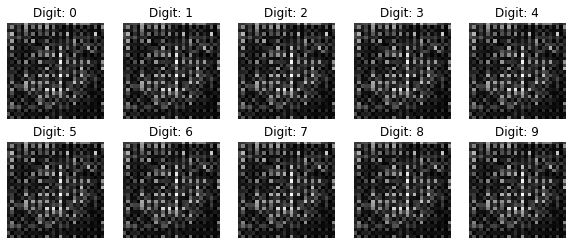

500 [D loss: 0.000021, acc.: 100.00%] [G loss: 0.000039]


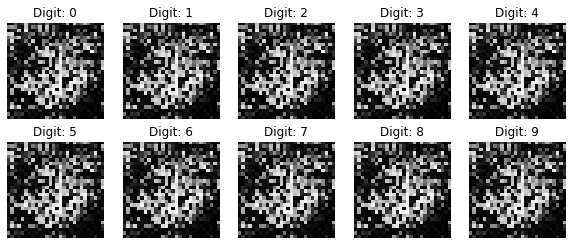

750 [D loss: 0.000029, acc.: 100.00%] [G loss: 0.023963]


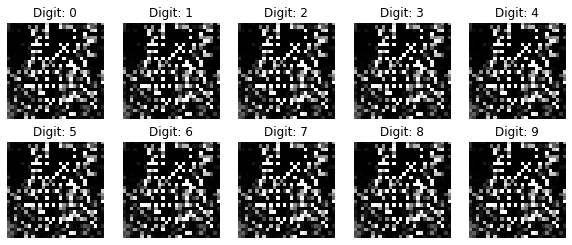

1000 [D loss: 0.000008, acc.: 100.00%] [G loss: 0.056995]


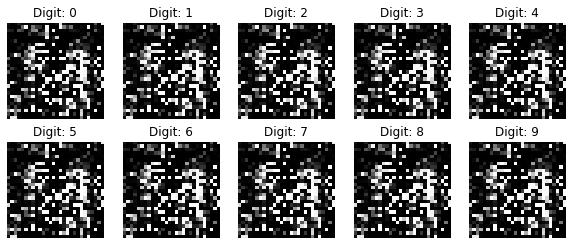

1250 [D loss: 0.000004, acc.: 100.00%] [G loss: 0.087041]


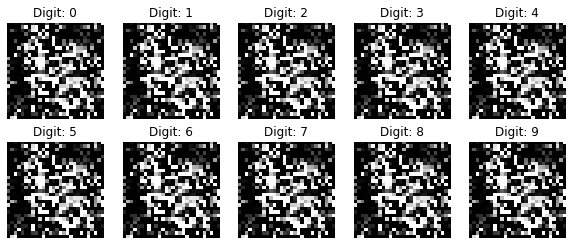

1500 [D loss: 0.000004, acc.: 100.00%] [G loss: 0.255356]


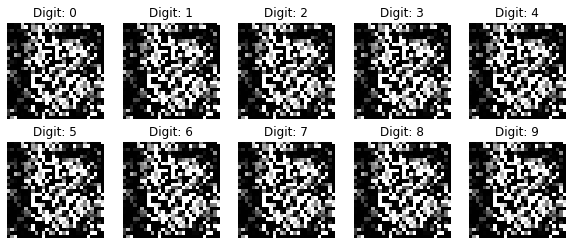

1750 [D loss: 0.000001, acc.: 100.00%] [G loss: 0.284430]


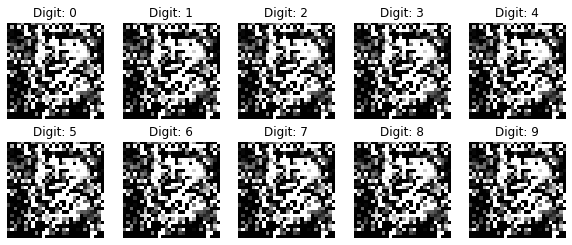

2000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.261815]


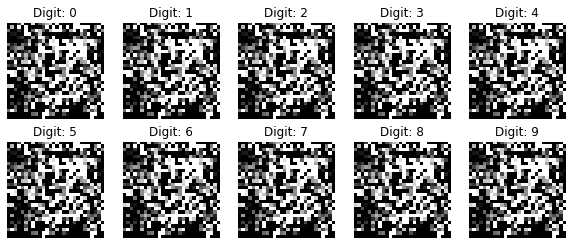

2250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.197499]


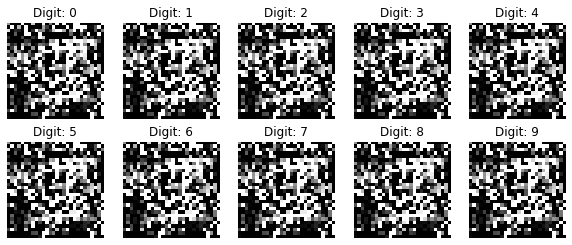

2500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.257133]


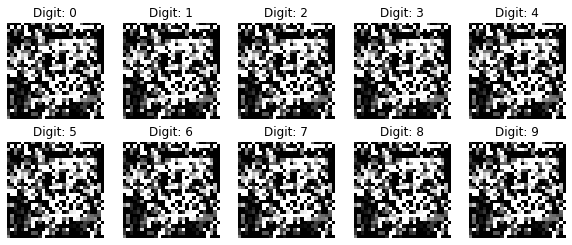

2750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.391176]


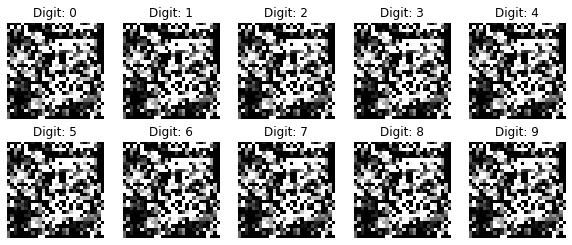

3000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.236051]


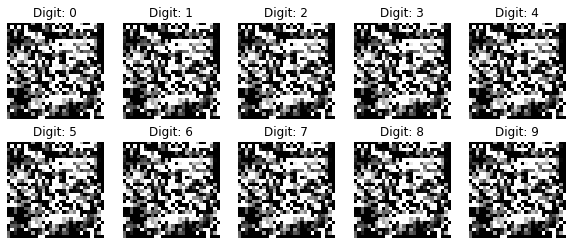

3250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.061917]


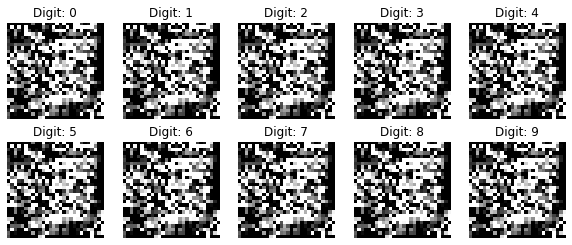

3500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058911]


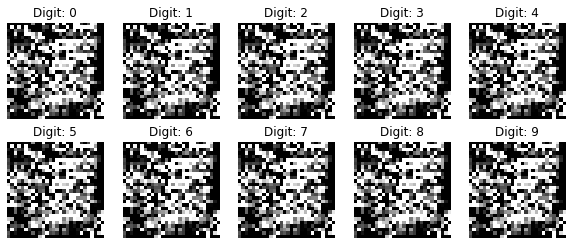

3750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.064661]


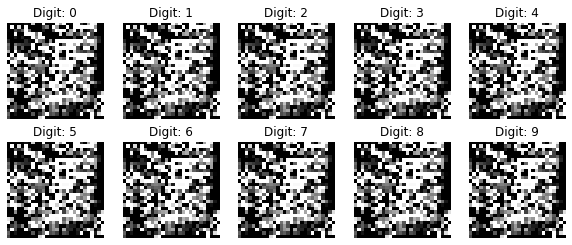

4000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.060814]


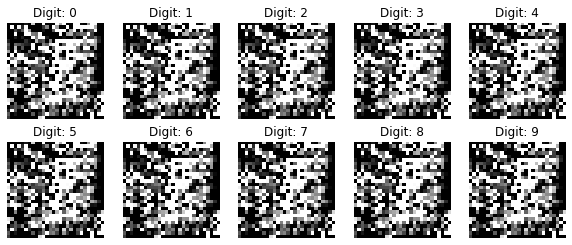

4250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.045569]


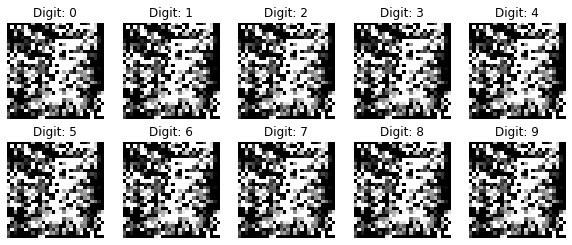

4500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055505]


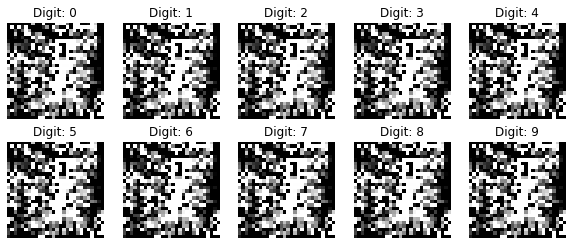

4750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.068769]


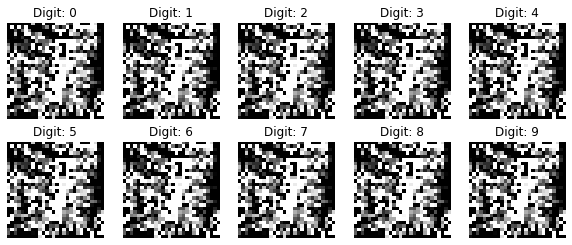

5000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.052930]


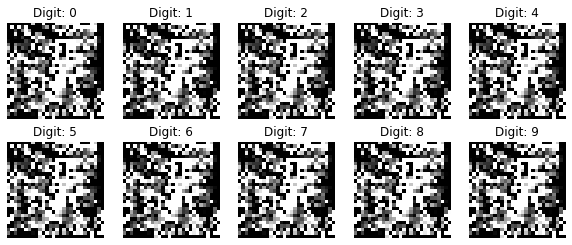

5250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.066819]


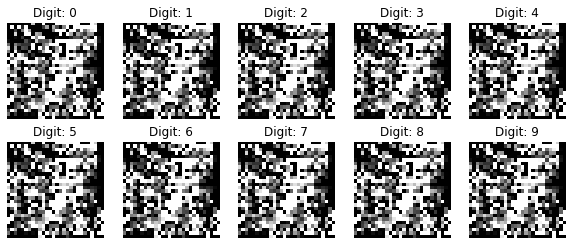

5500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.068656]


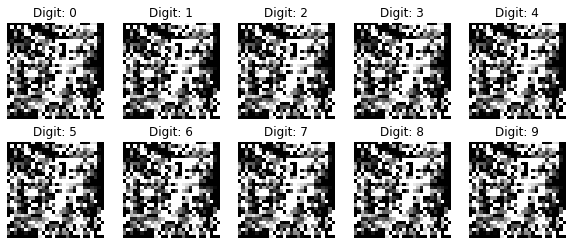

5750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.052311]


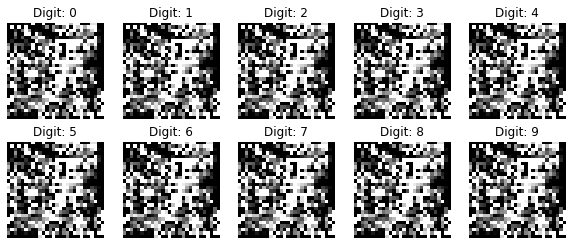

6000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.053632]


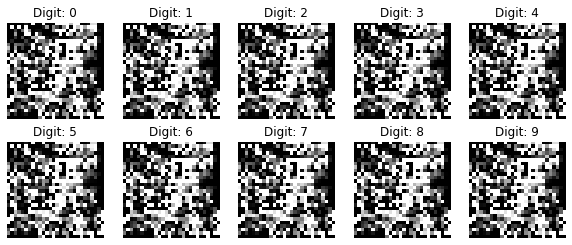

6250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.062496]


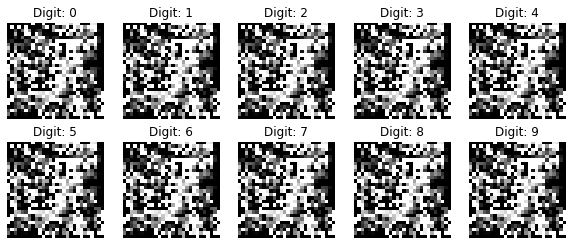

6500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.047832]


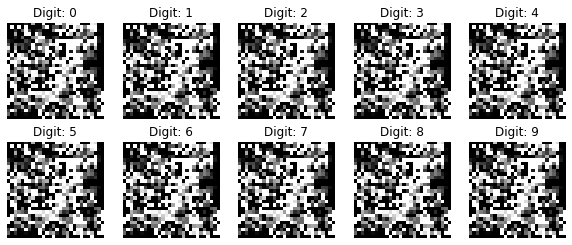

6750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.048682]


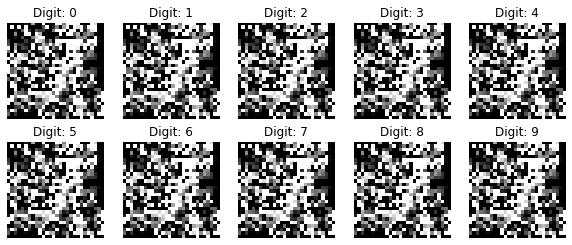

7000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.065893]


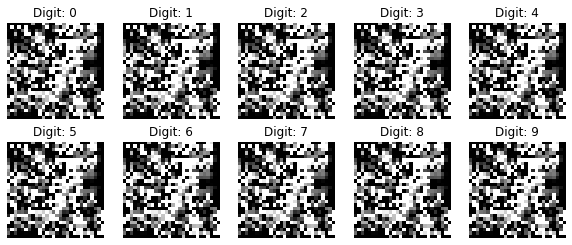

7250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.050951]


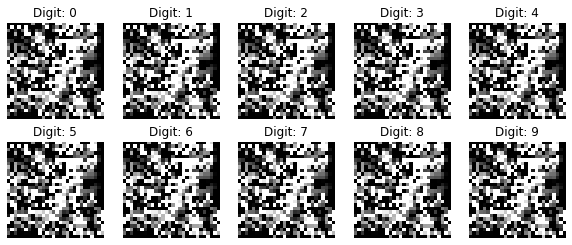

7500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.049384]


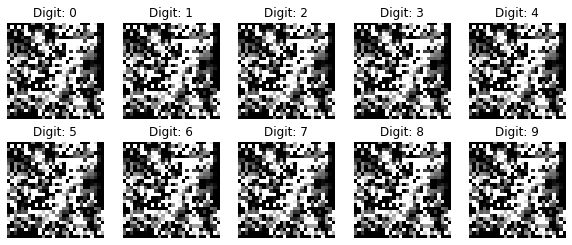

7750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.046420]


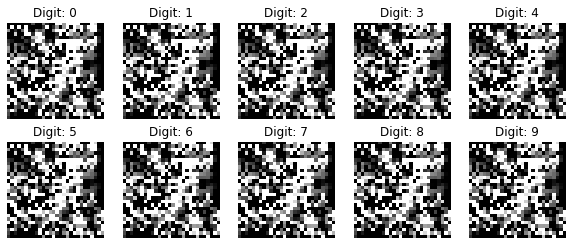

8000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.049784]


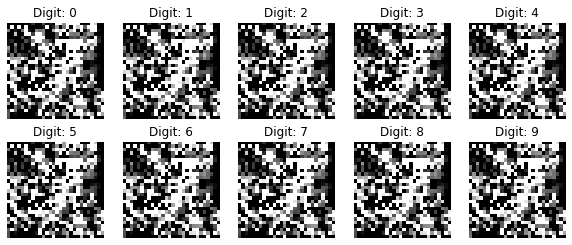

8250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.059362]


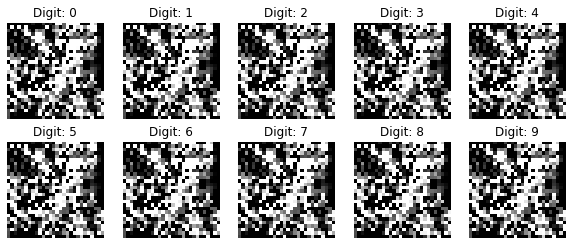

8500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.088352]


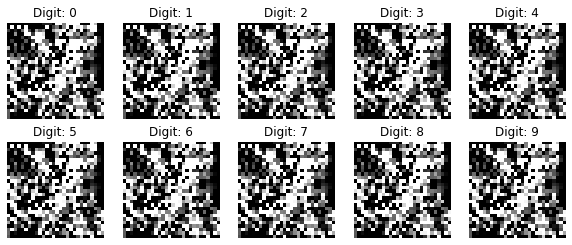

8750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.073849]


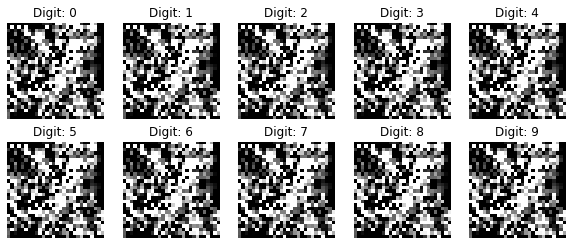

9000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.018762]


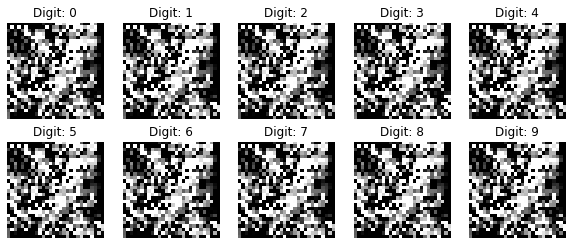

9250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010456]


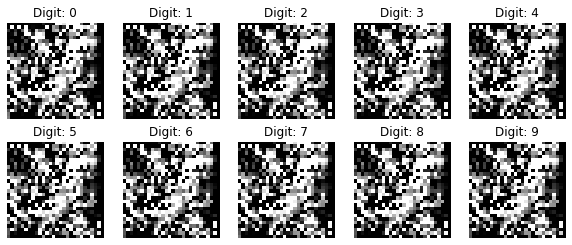

9500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.008849]


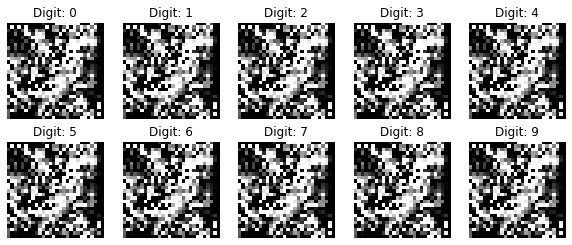

9750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.012408]


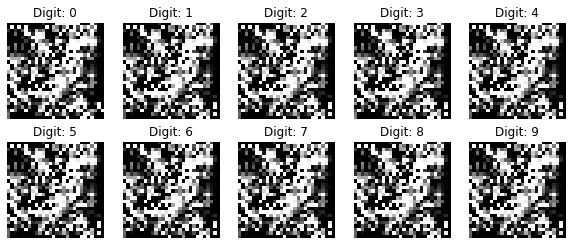

10000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.014007]


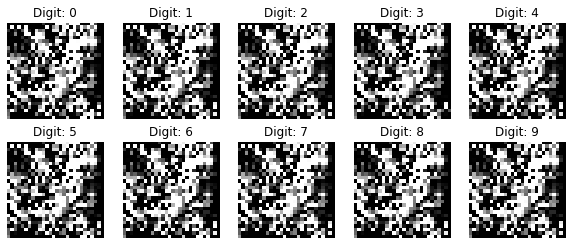

10250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.012478]


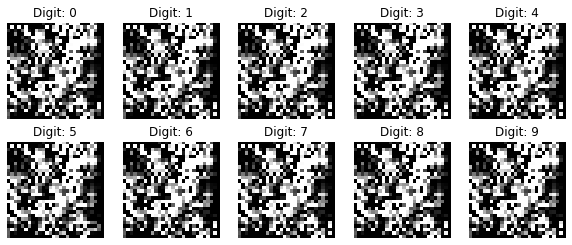

10500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.019353]


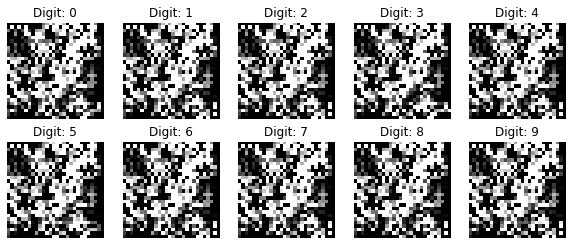

10750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.018678]


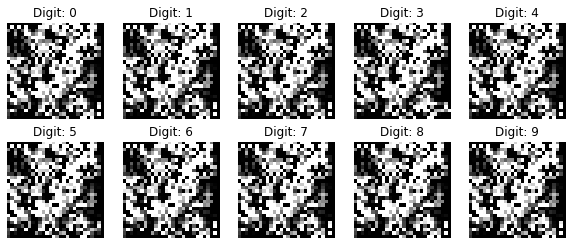

11000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.014596]


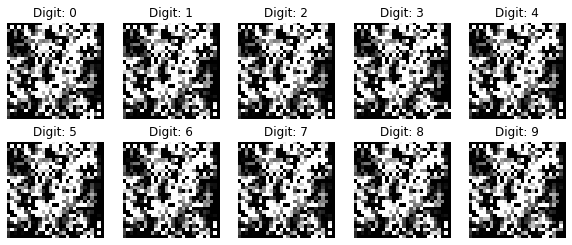

11250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.014277]


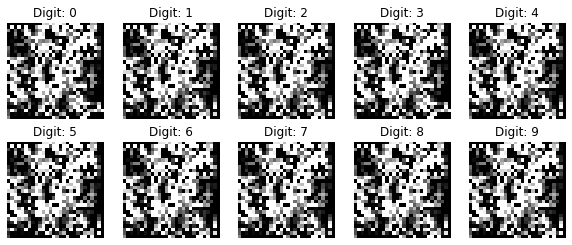

11500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.012531]


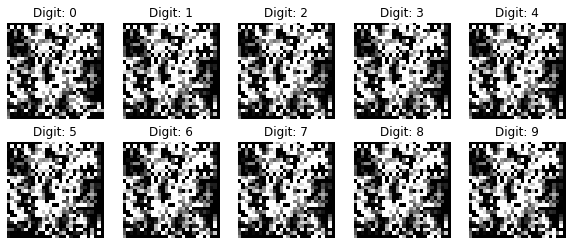

11750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010717]


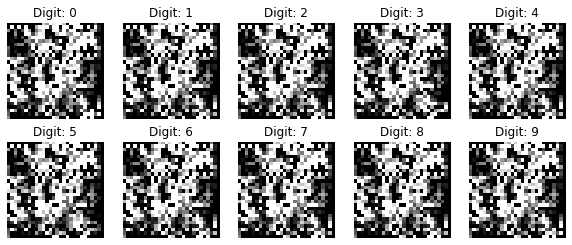

12000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010273]


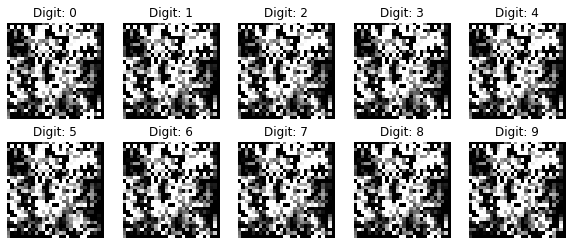

12250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010883]


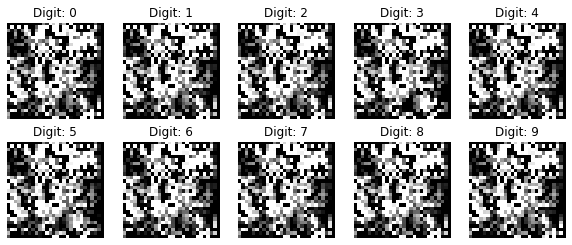

12500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010616]


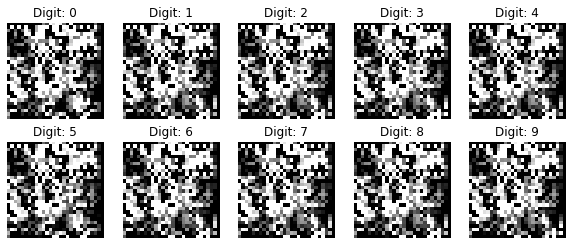

12750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010377]


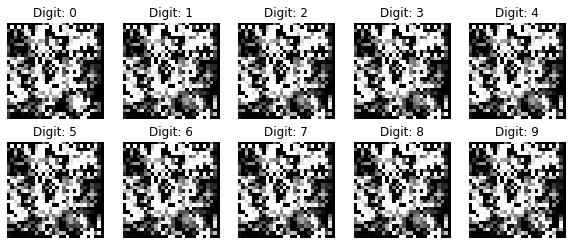

13000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010095]


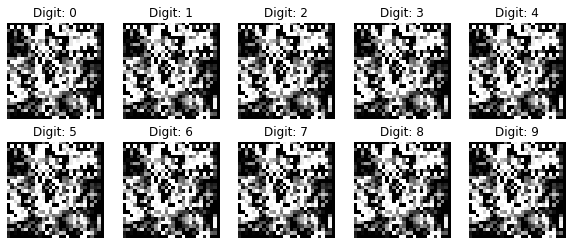

13250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.007814]


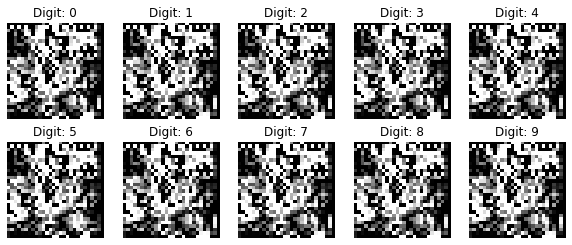

13500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.007915]


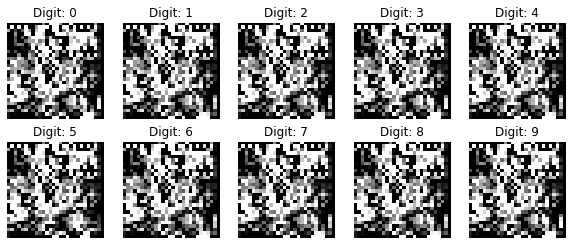

13750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.007444]


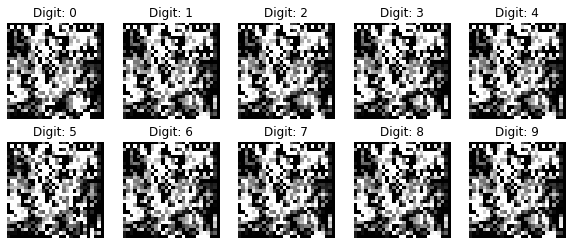

14000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.008462]


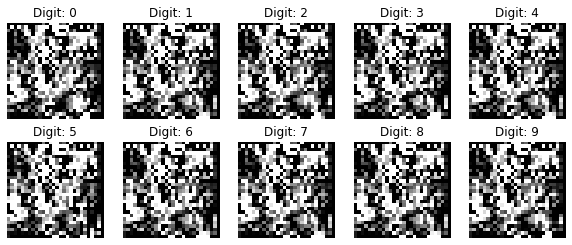

14250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.008597]


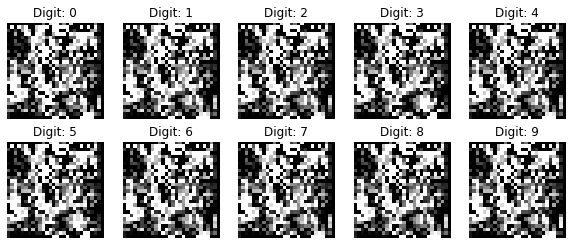

14500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.006211]


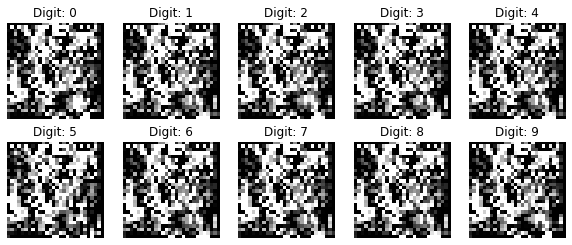

14750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.006835]


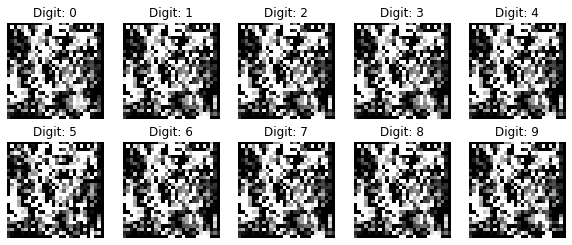

15000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.009903]


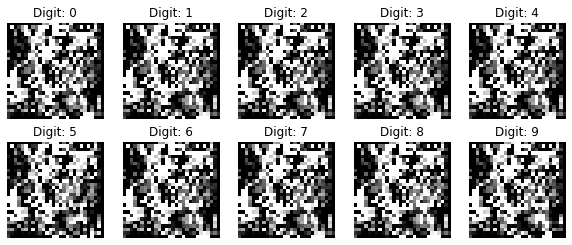

15250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.010224]


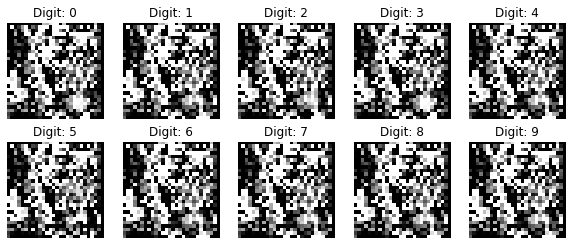

15500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.029203]


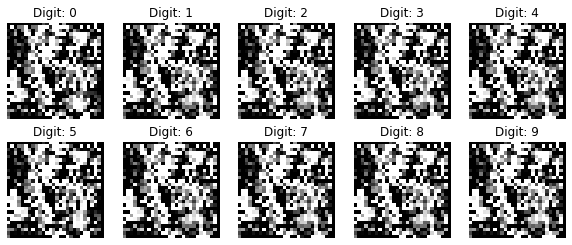

15750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.020910]


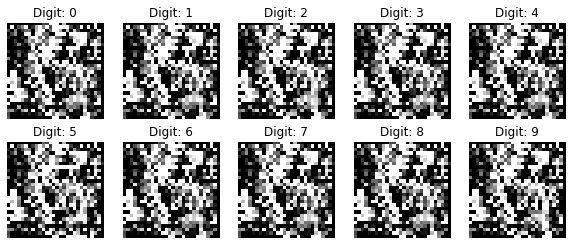

16000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.040953]


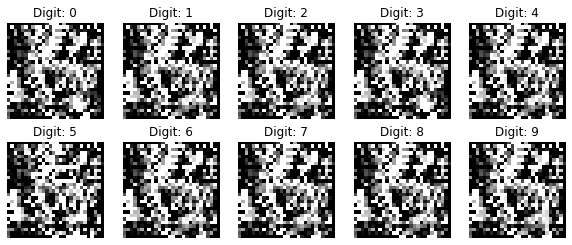

16250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.034945]


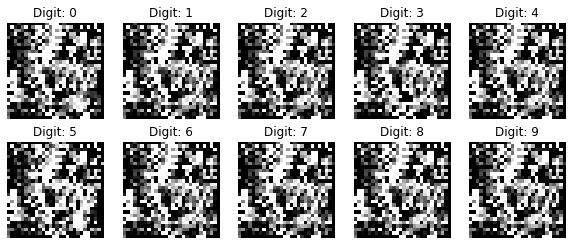

16500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.016538]


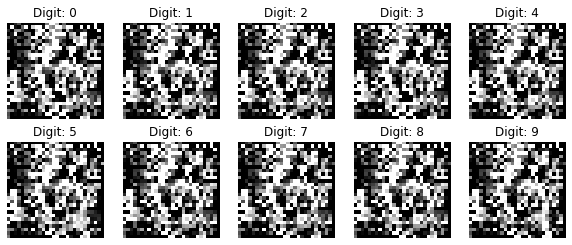

16750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.021552]


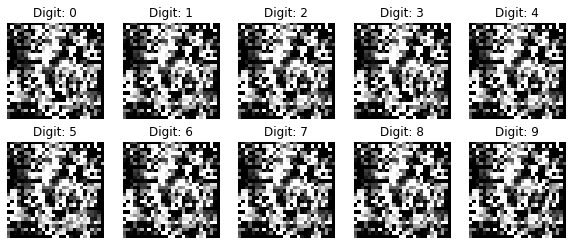

17000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.023760]


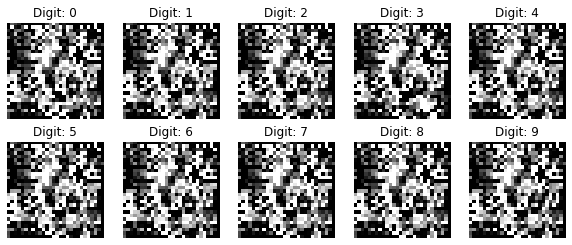

17250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.024765]


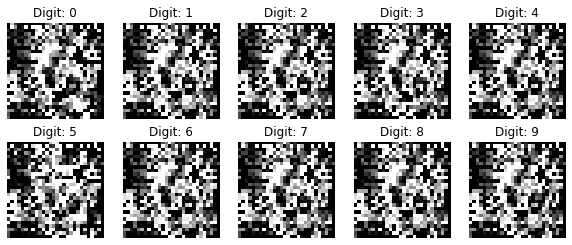

17500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.026130]


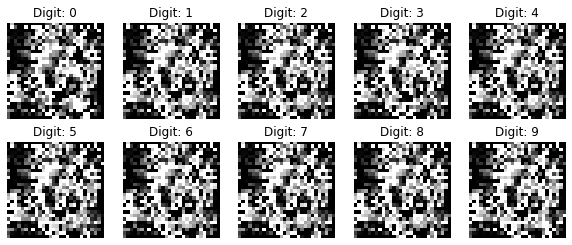

17750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.036115]


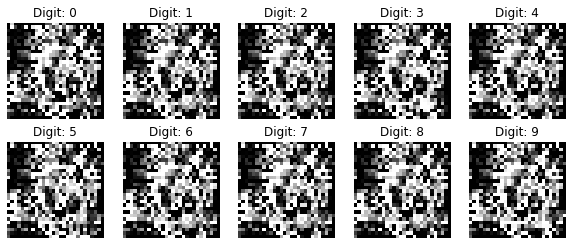

18000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.038185]


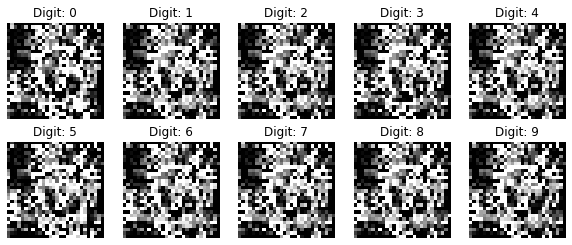

18250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.029028]


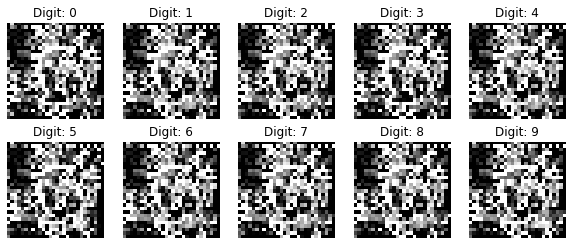

18500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.030665]


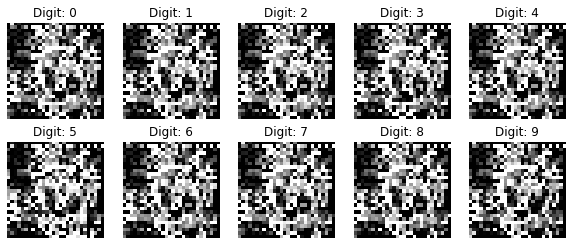

18750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.035304]


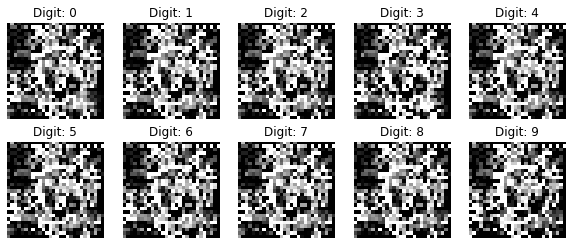

19000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.048277]


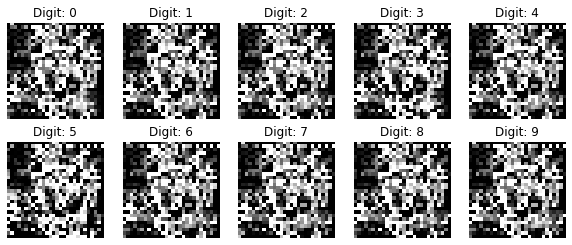

19250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.050376]


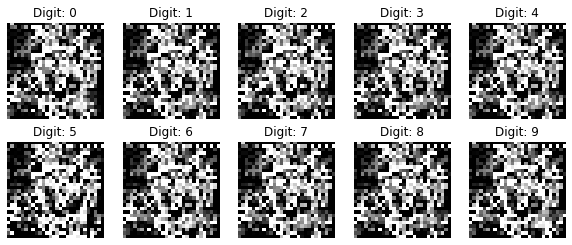

19500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.046903]


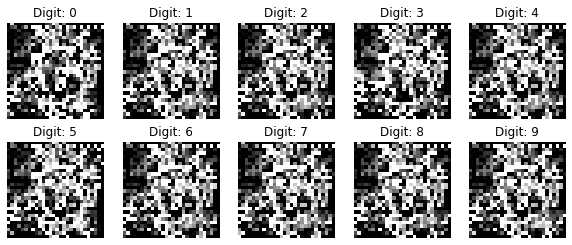

19750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058534]


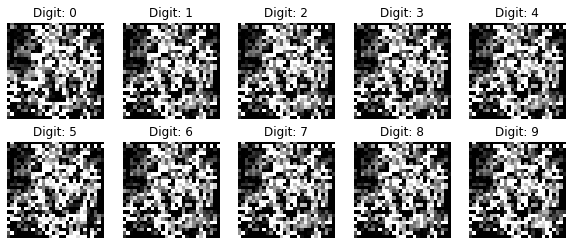

20000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.071776]


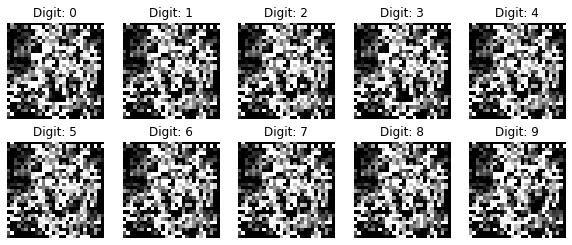

20250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.072878]


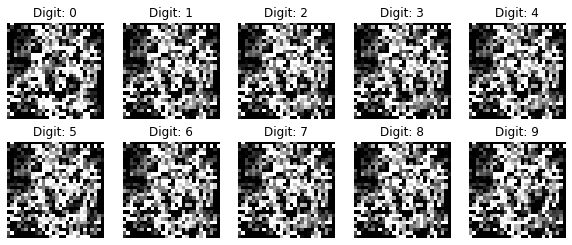

20500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.074719]


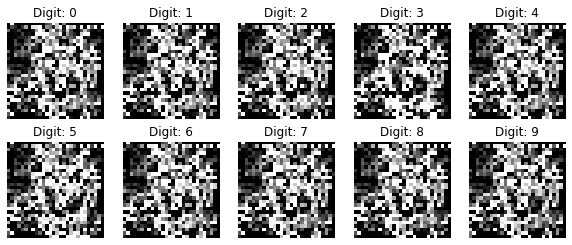

20750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.075230]


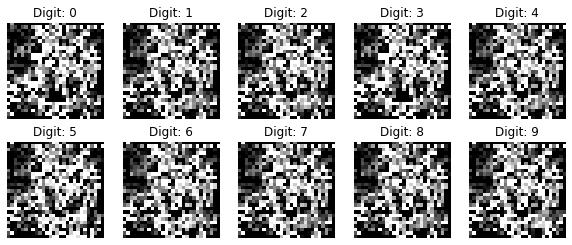

21000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.088032]


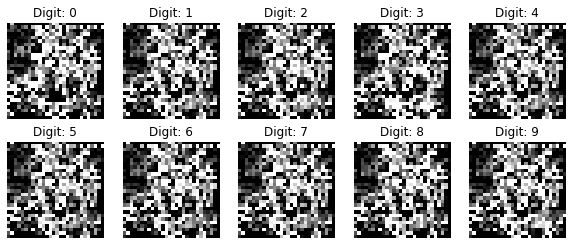

21250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.079576]


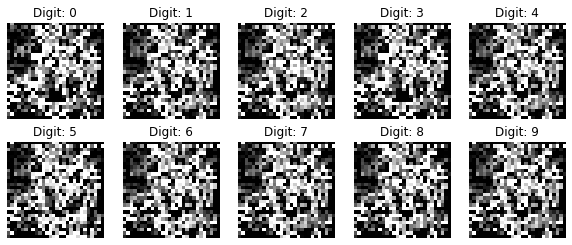

21500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.095458]


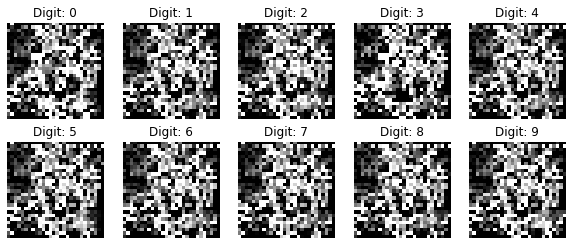

21750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.090823]


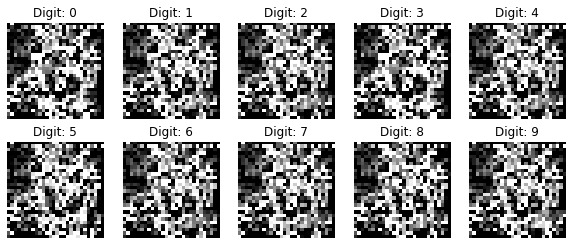

22000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.103224]


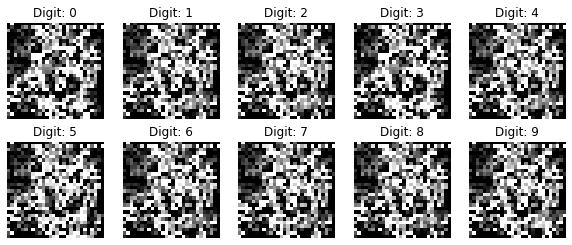

22250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.100271]


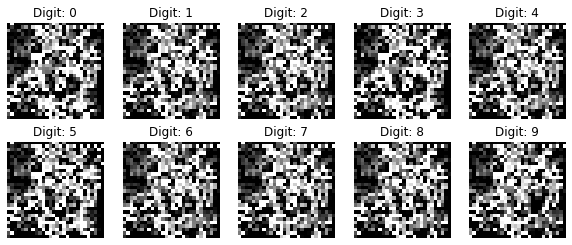

22500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.105679]


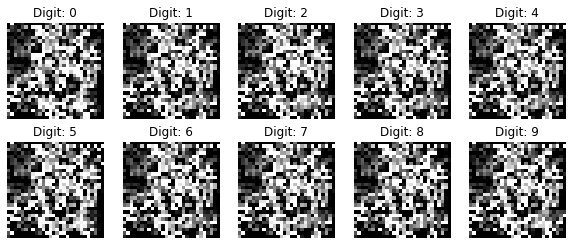

22750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.106854]


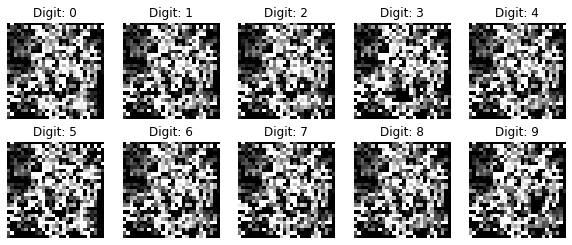

23000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.104727]


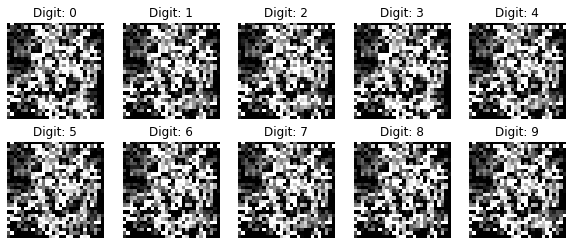

23250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.105638]


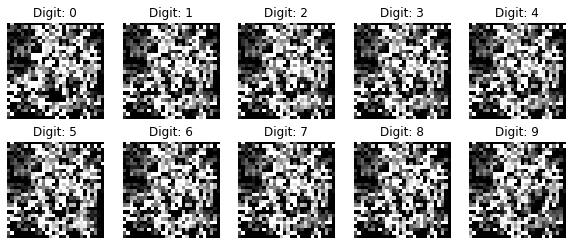

23500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.106075]


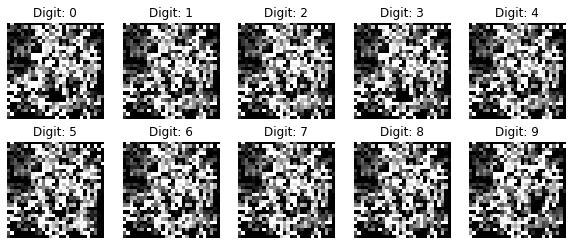

23750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.111056]


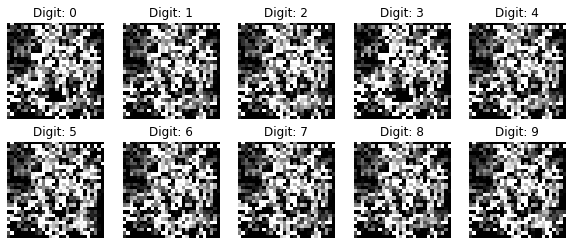

24000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.108677]


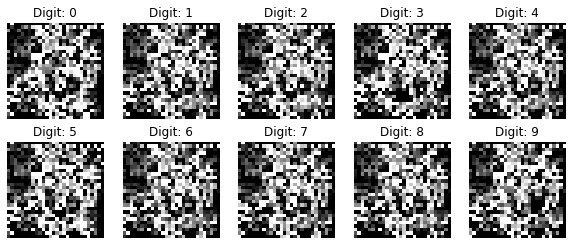

24250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.101419]


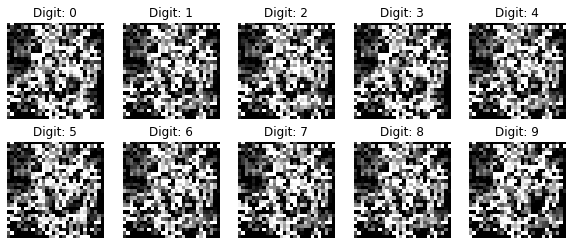

24500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.101554]


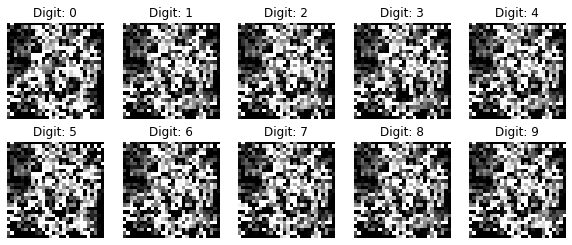

24750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.101671]


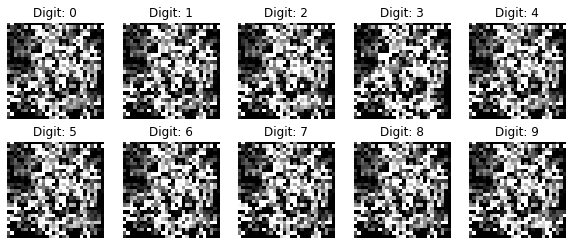

25000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.105837]


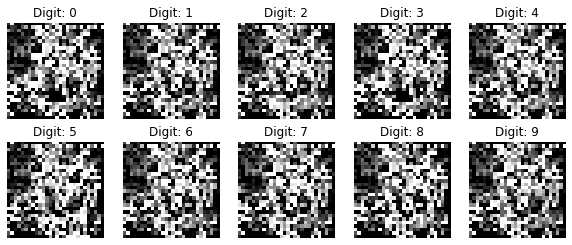

25250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.102321]


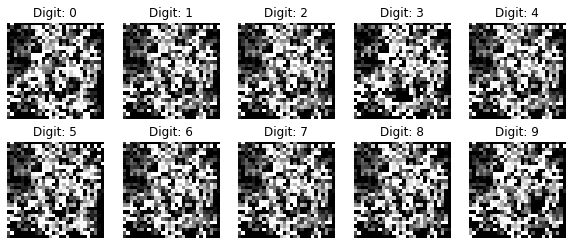

25500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.105263]


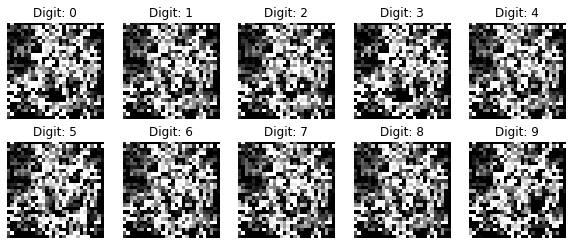

25750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.103738]


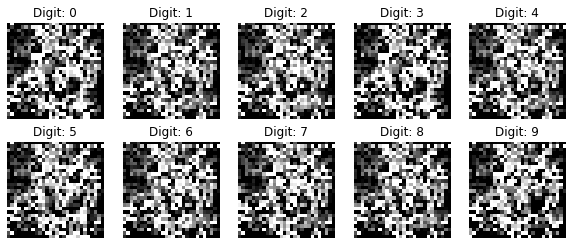

26000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.102576]


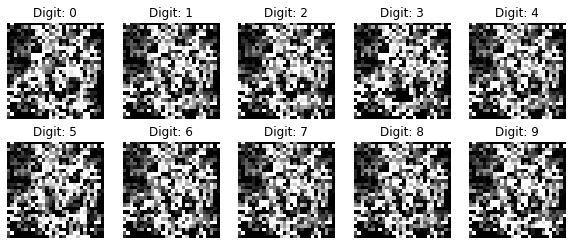

26250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.109078]


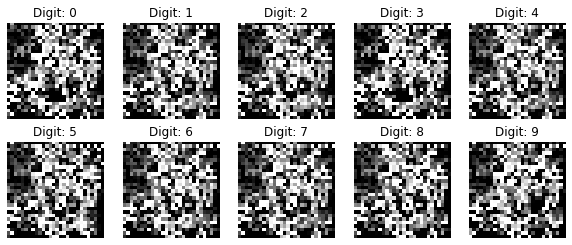

26500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.111697]


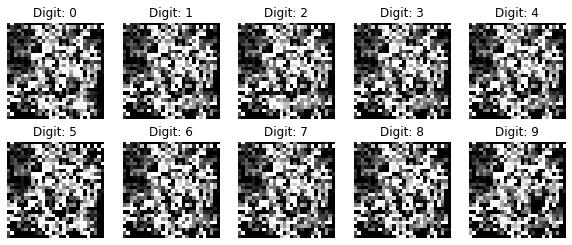

26750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.111250]


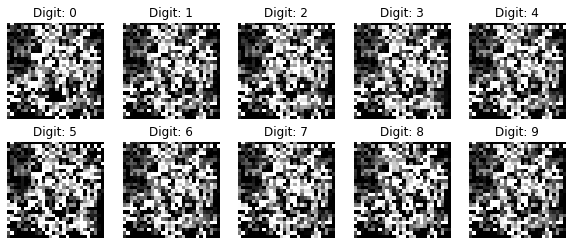

27000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.108146]


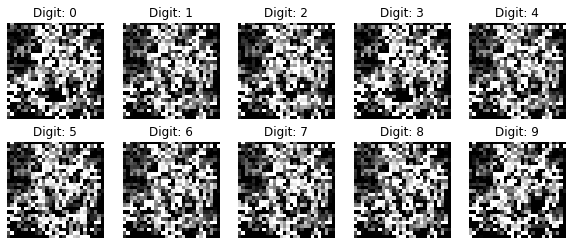

27250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.112976]


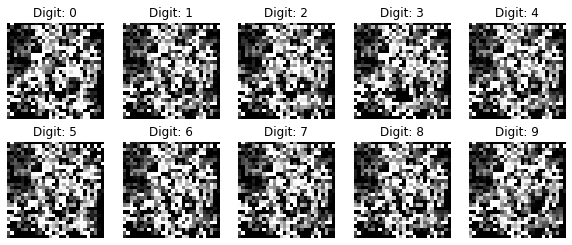

27500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.116536]


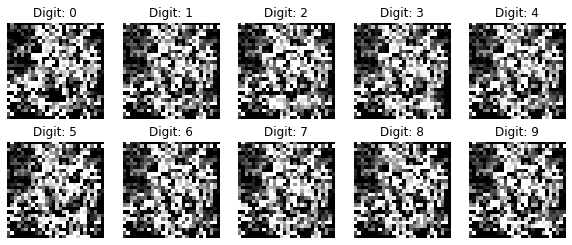

27750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.114095]


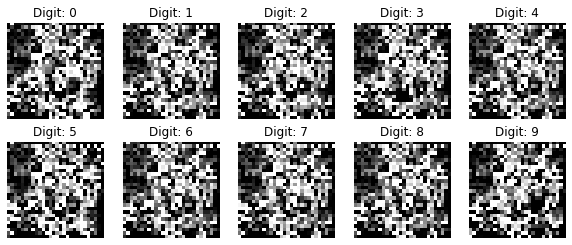

28000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.111811]


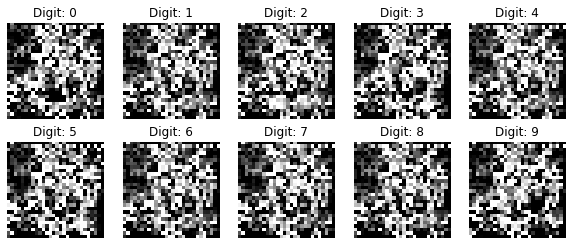

28250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.114348]


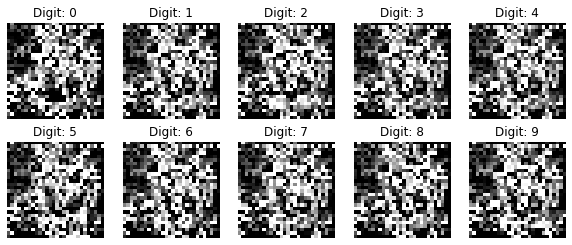

28500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.124067]


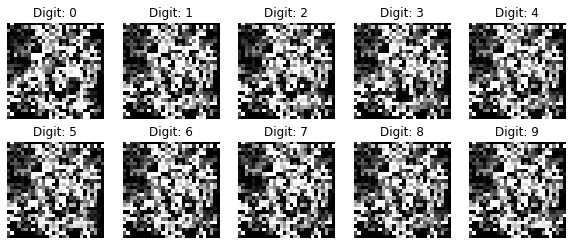

28750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.119471]


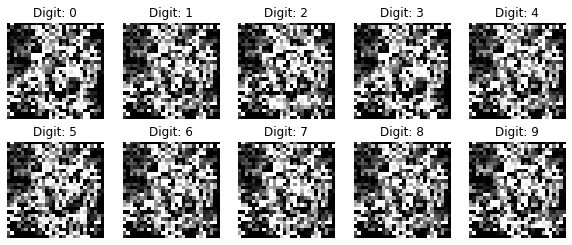

29000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.122537]


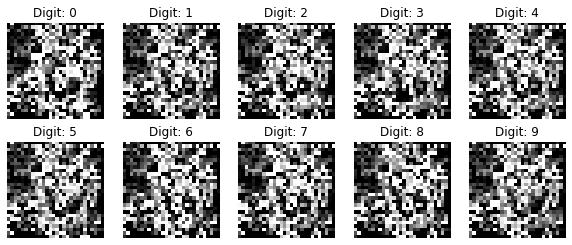

29250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.121604]


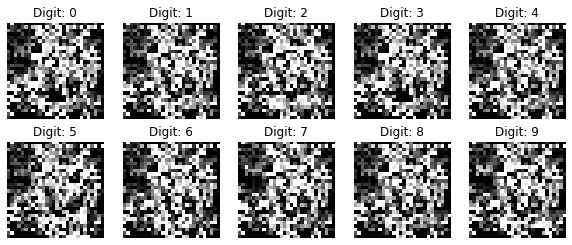

29500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.126343]


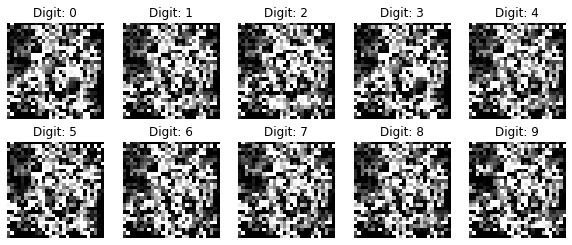

29750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.135235]


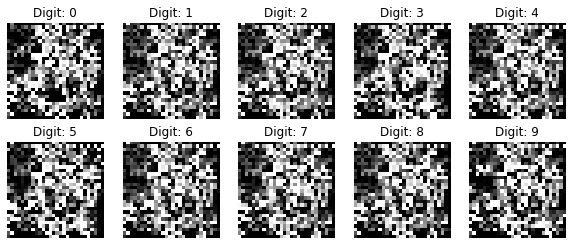

30000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.140060]


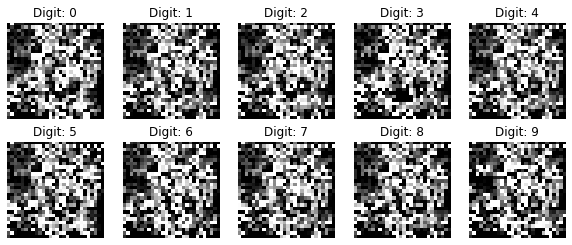

30250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.142245]


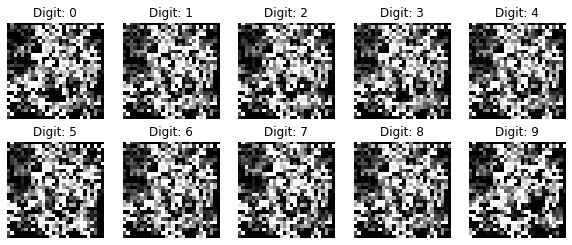

30500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.144222]


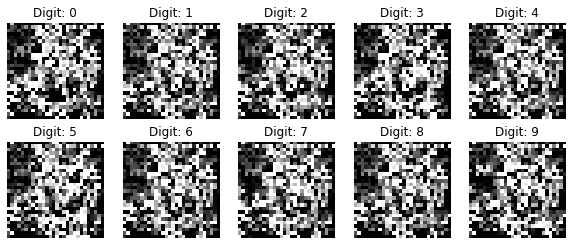

30750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.148793]


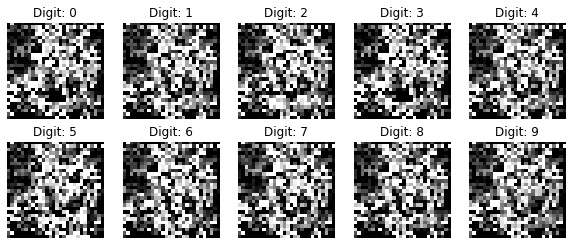

31000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.151807]


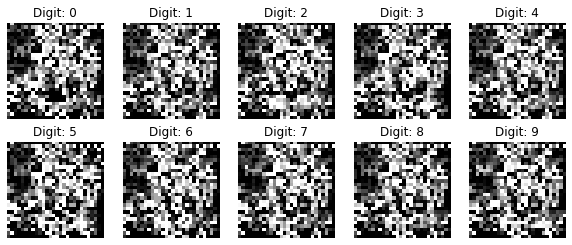

31250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.154818]


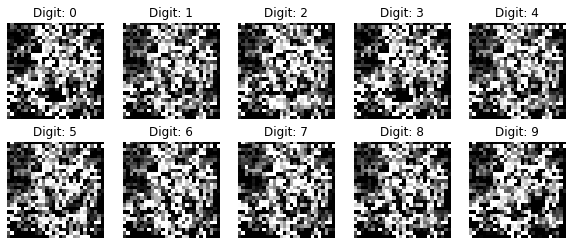

31500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.156489]


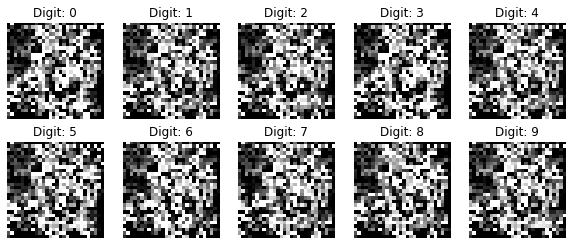

31750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.148698]


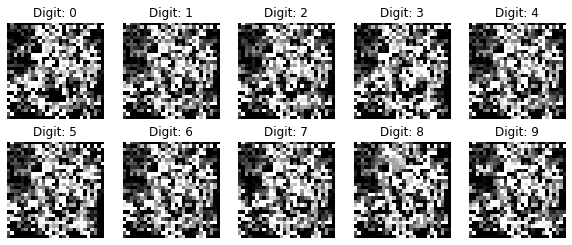

32000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.155775]


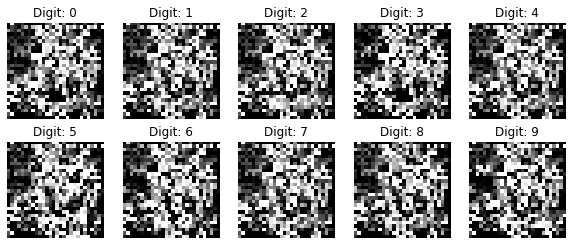

32250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.176266]


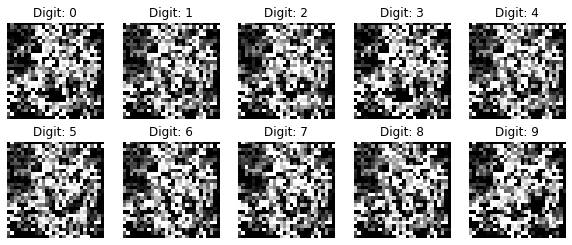

32500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.161831]


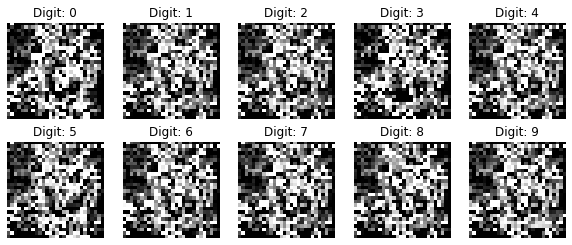

32750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.162425]


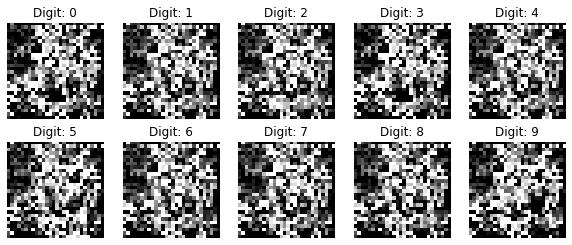

33000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.170311]


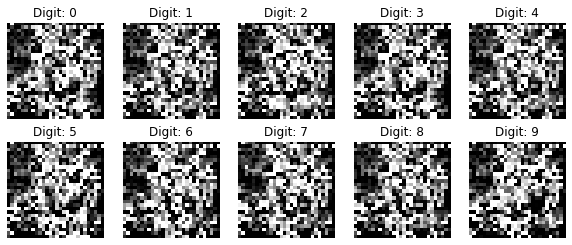

33250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.181256]


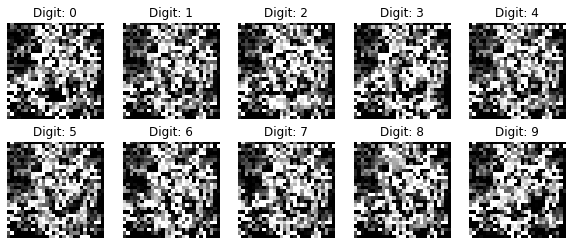

33500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.172867]


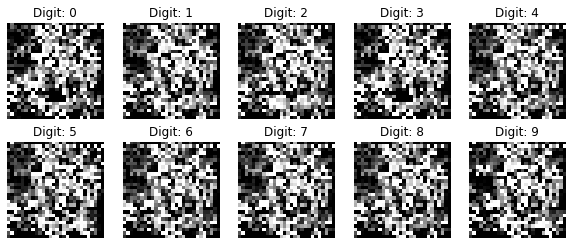

33750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.173816]


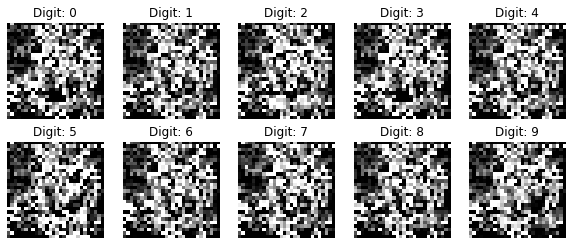

34000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.183482]


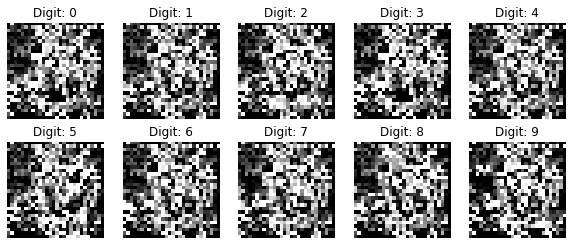

34250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.176994]


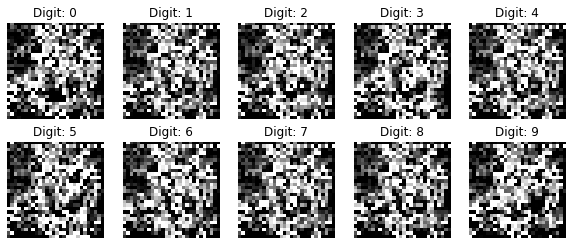

34500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.179233]


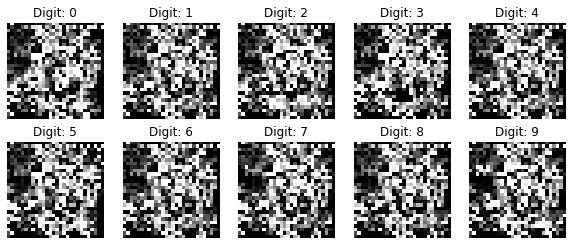

34750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.188191]


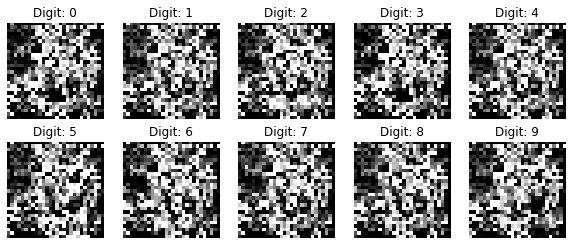

35000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.197754]


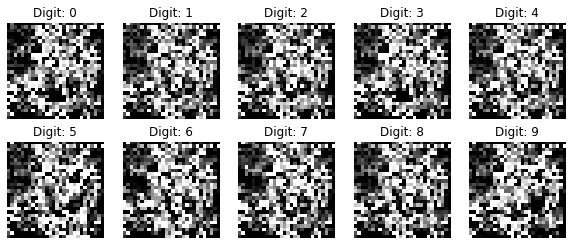

35250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.196155]


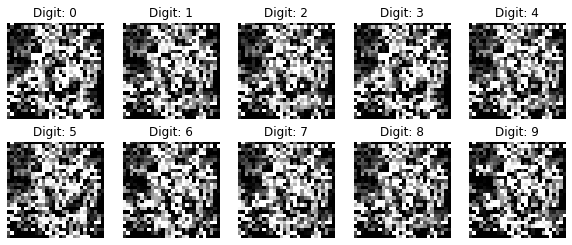

35500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.189743]


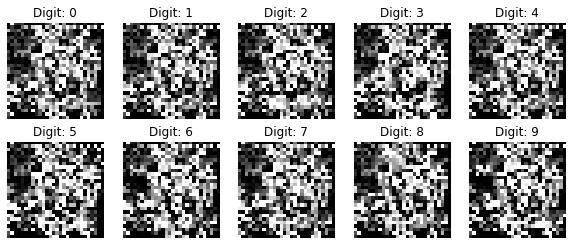

35750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.192456]


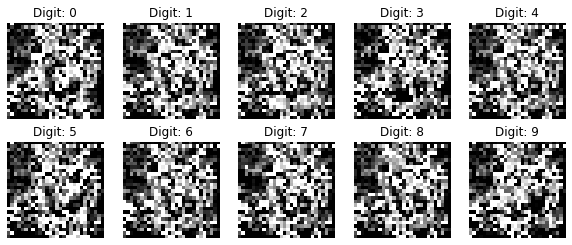

36000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.215685]


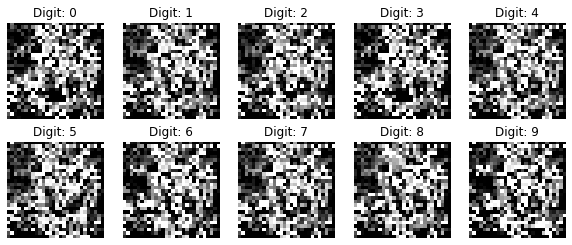

36250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.202890]


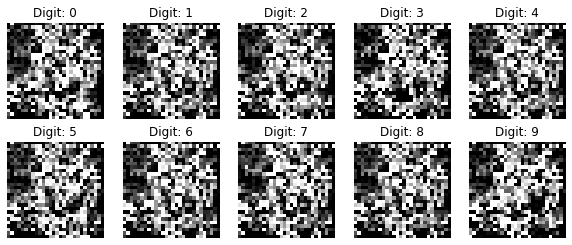

36500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.214645]


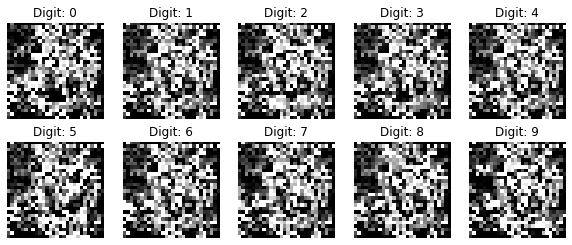

36750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.222691]


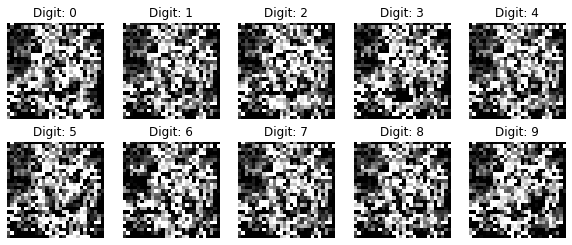

37000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.212166]


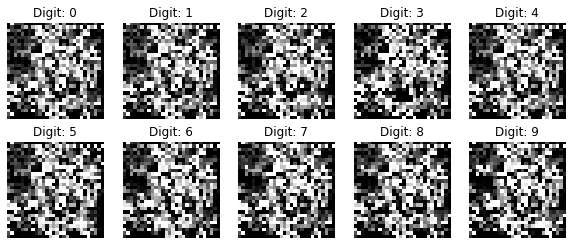

37250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.212123]


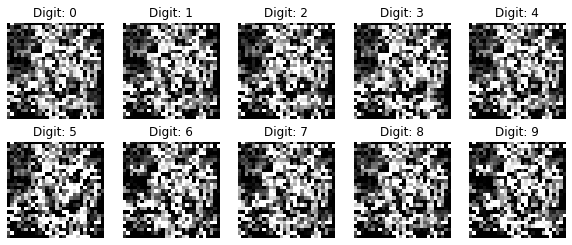

37500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.228303]


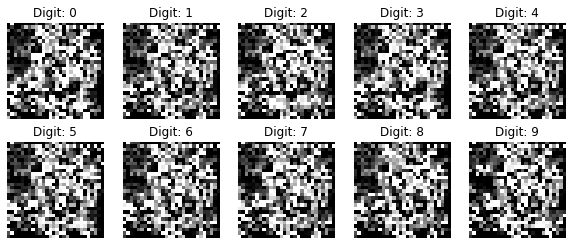

37750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.216897]


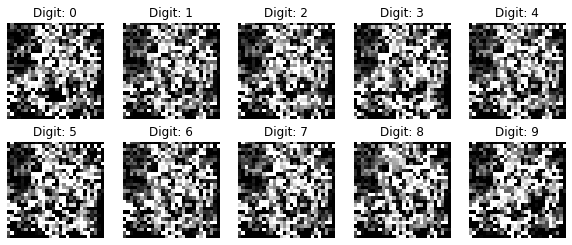

38000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.236949]


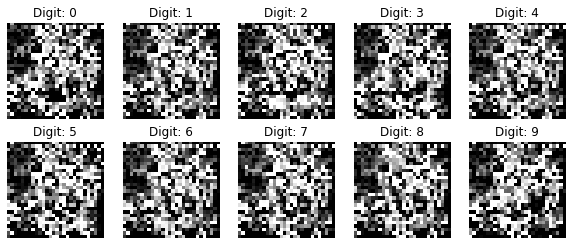

38250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.242381]


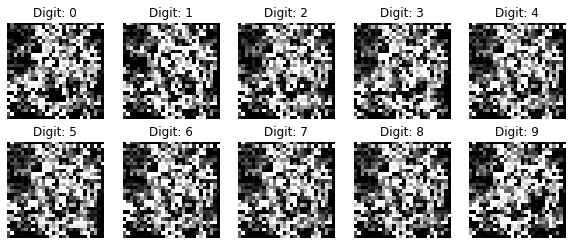

38500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.254517]


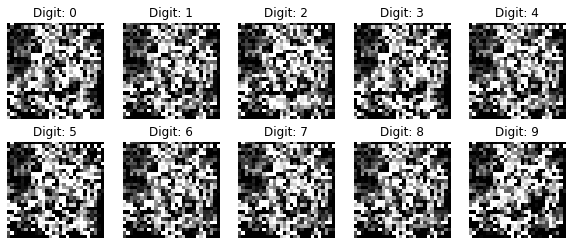

38750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.253587]


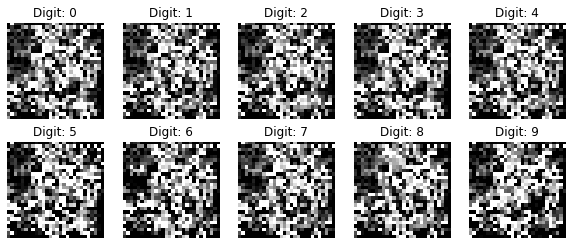

39000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.238669]


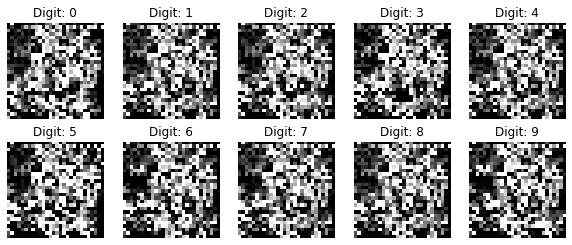

39250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.262617]


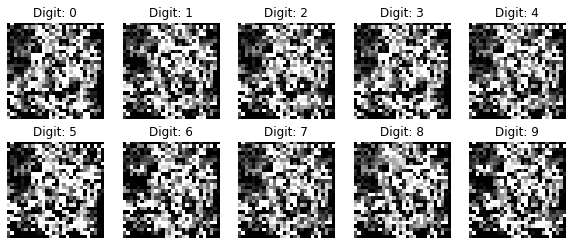

39500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.250065]


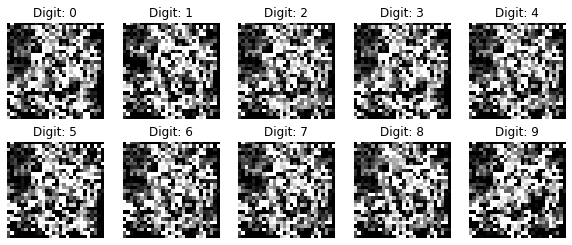

39750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.255480]


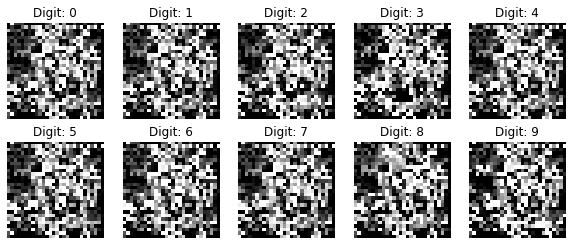

40000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.239509]


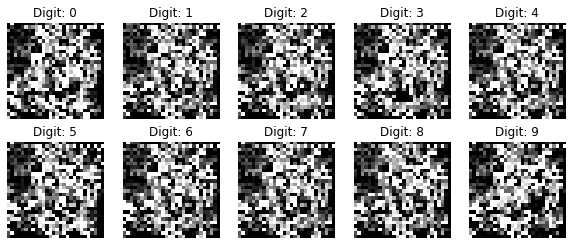

40250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.243420]


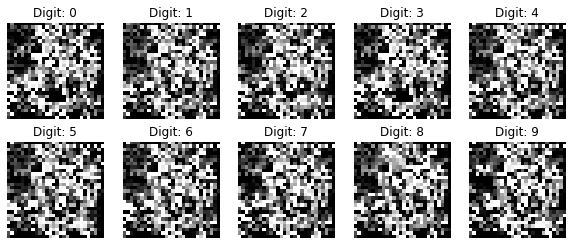

40500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.244877]


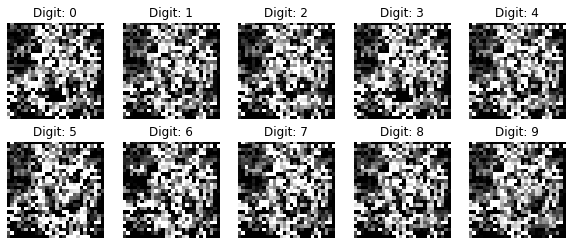

40750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.244304]


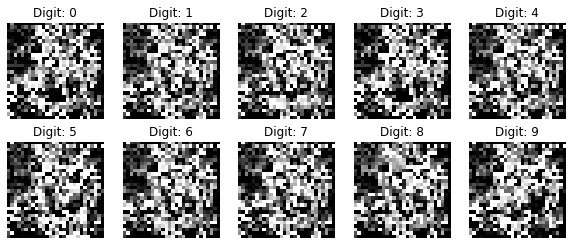

41000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.259899]


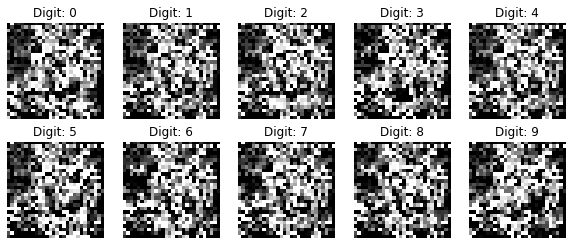

41250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.244446]


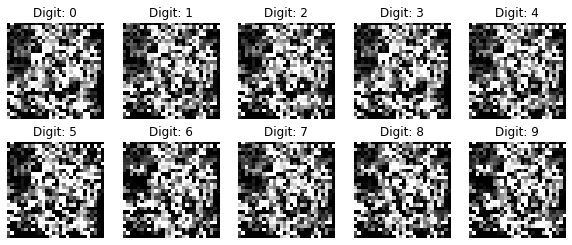

41500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.267073]


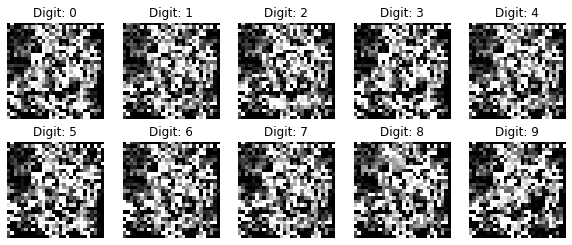

41750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.255145]


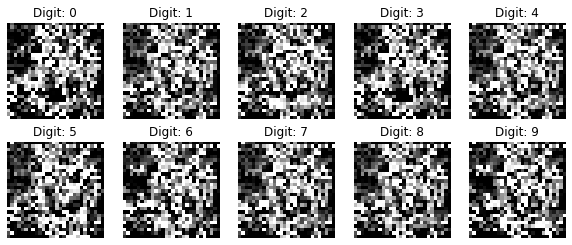

42000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.262334]


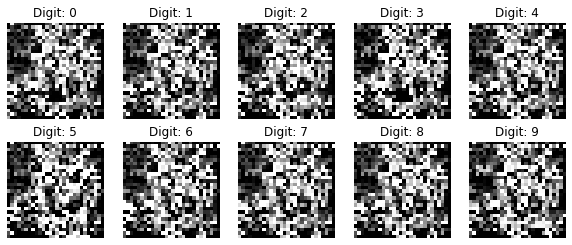

42250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.266272]


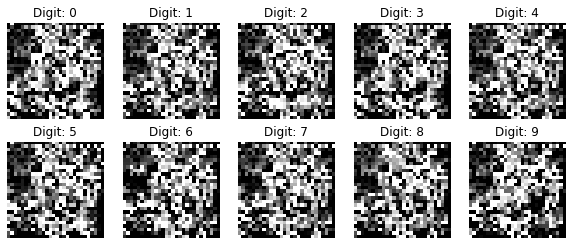

42500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.278556]


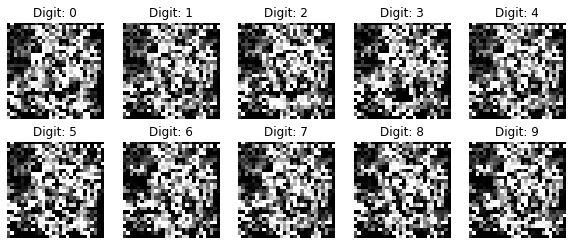

42750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.292404]


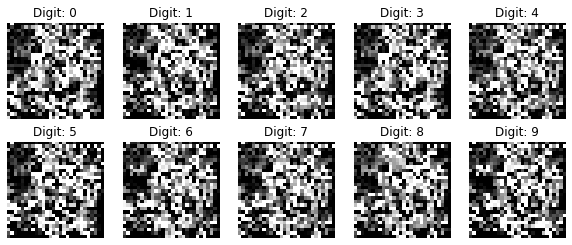

43000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.268677]


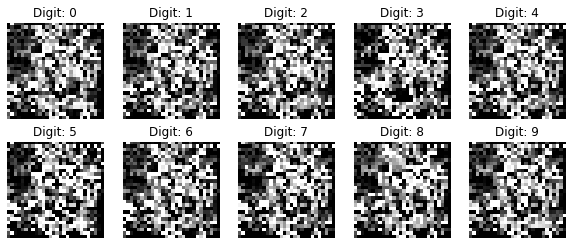

43250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.288455]


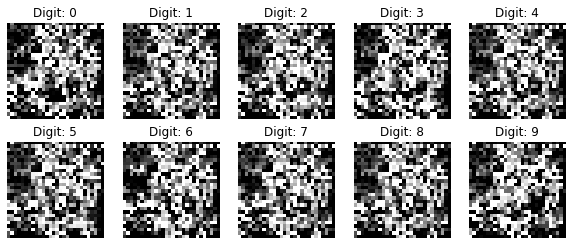

43500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.258182]


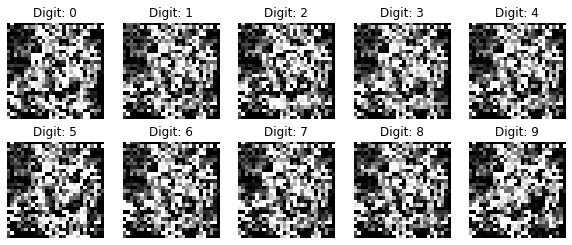

43750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.279803]


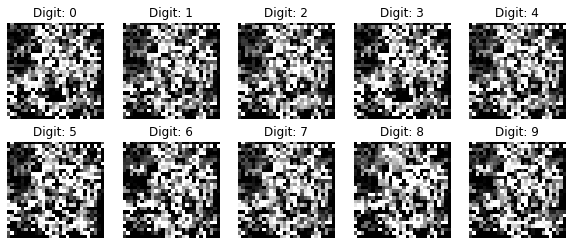

44000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.274591]


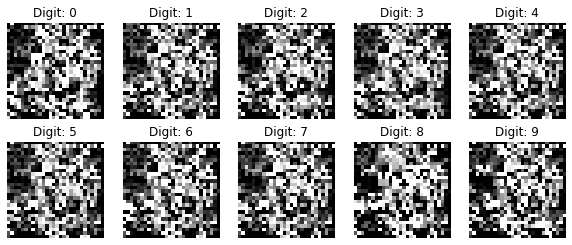

44250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.303386]


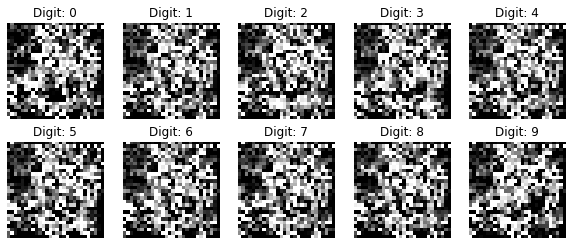

44500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.286865]


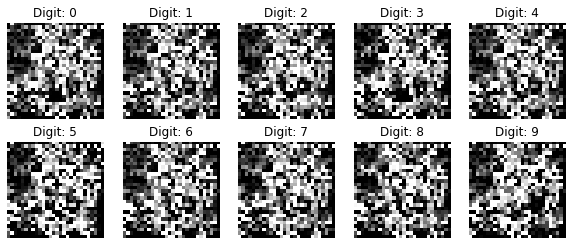

44750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.298438]


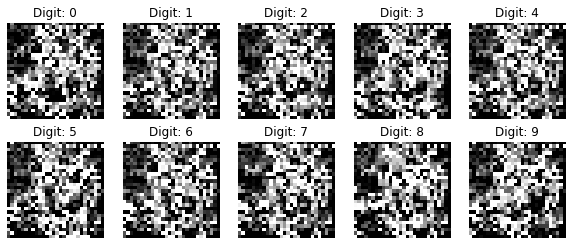

45000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.313004]


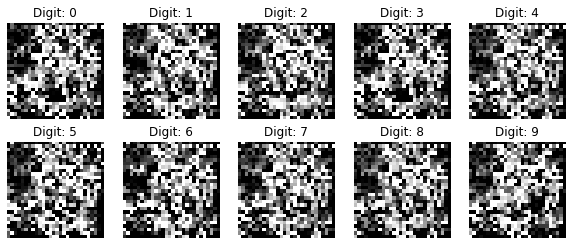

45250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.310830]


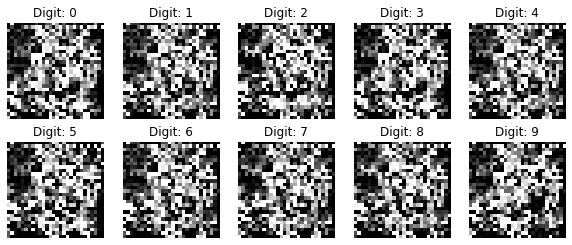

45500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.330270]


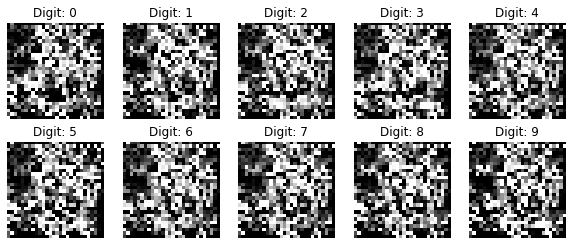

45750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.301949]


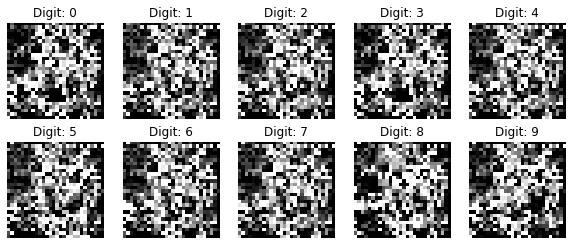

46000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.306193]


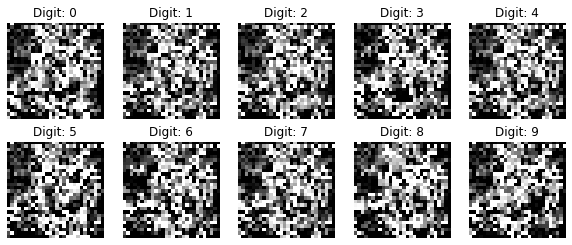

46250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.298354]


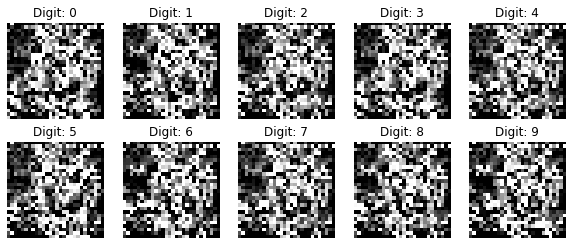

46500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.299660]


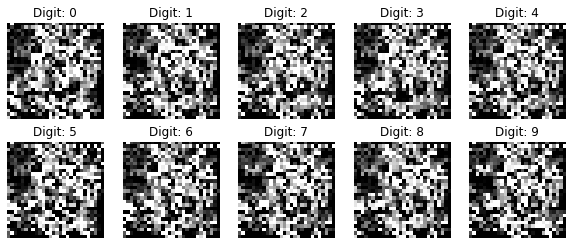

46750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.306494]


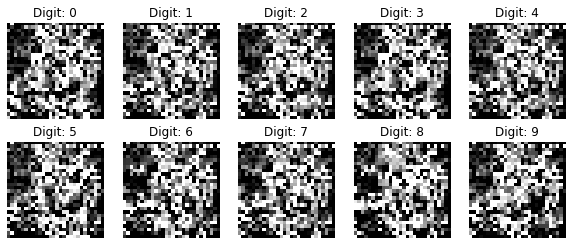

47000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.291509]


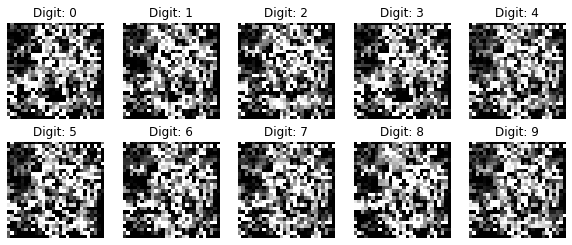

47250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.305159]


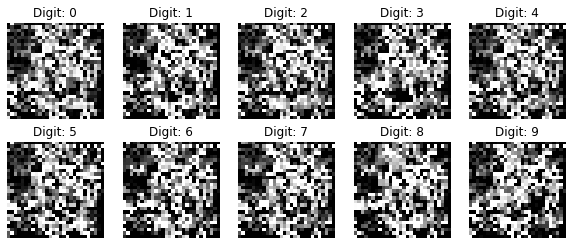

47500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.302702]


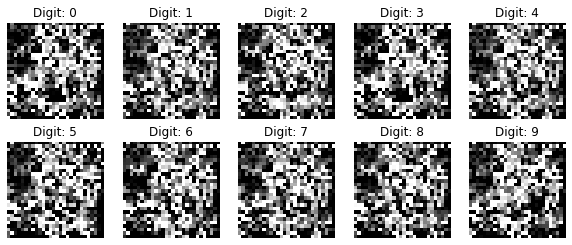

47750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.289044]


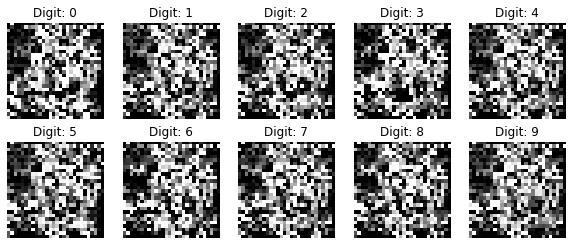

48000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.316442]


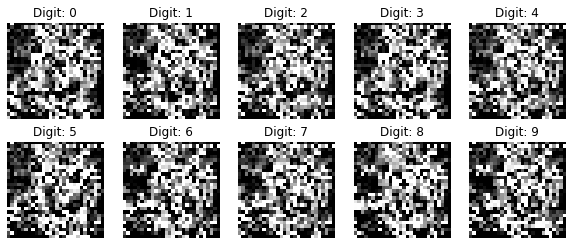

48250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.300776]


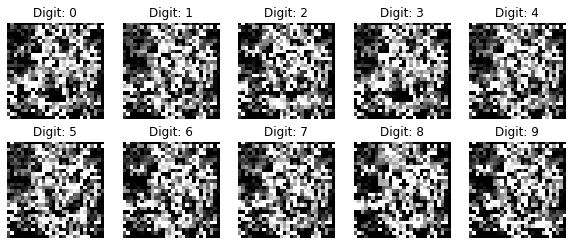

48500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.303621]


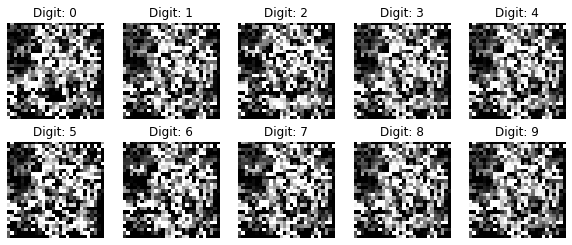

48750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.302935]


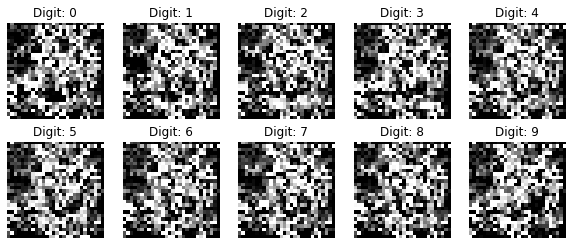

49000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.285085]


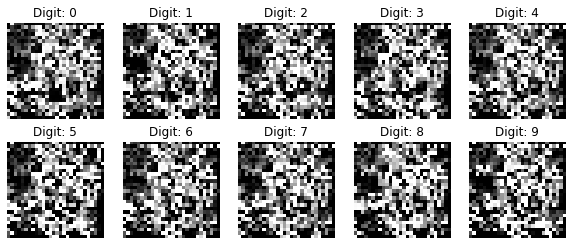

49250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.300021]


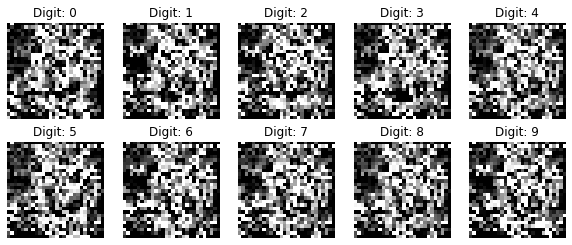

49500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.283895]


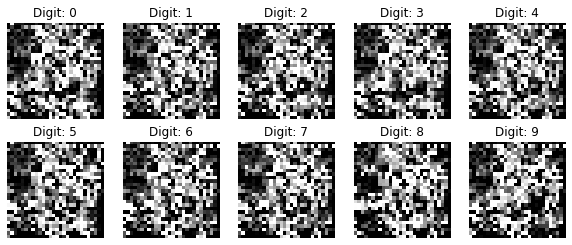

49750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.294049]


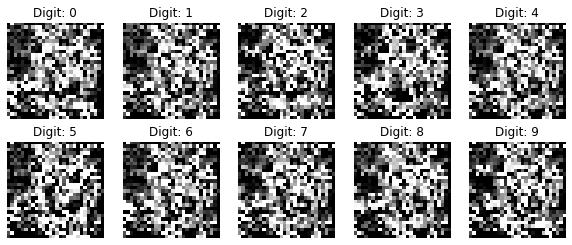

50000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.300237]


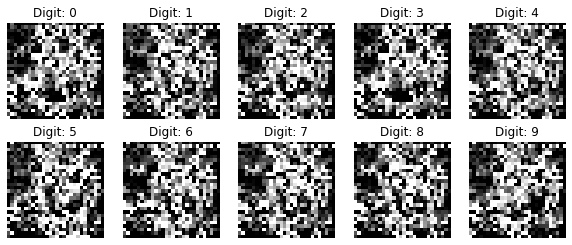

50250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.318074]


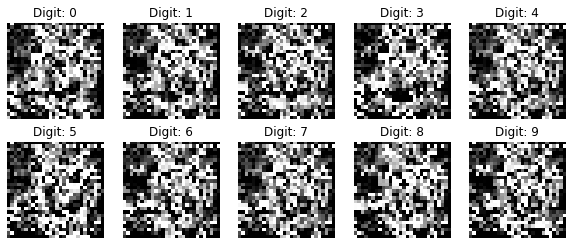

50500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.297575]


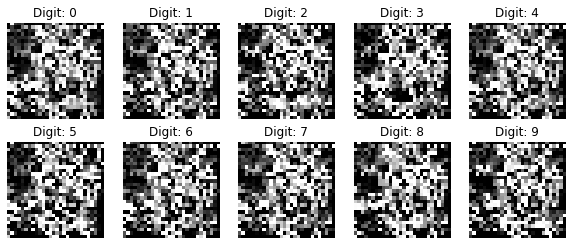

50750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.316029]


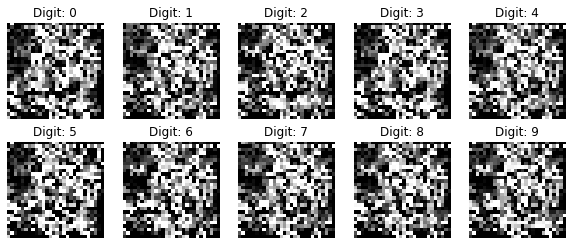

51000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.324703]


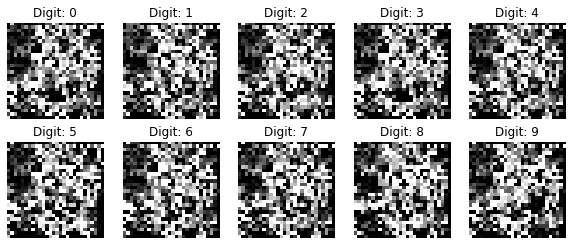

51250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.319274]


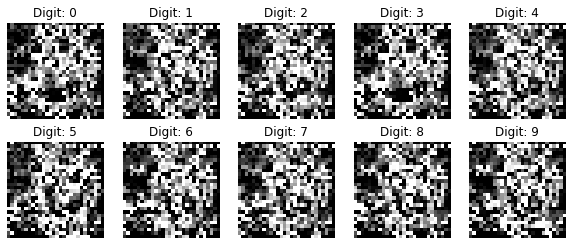

51500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.327368]


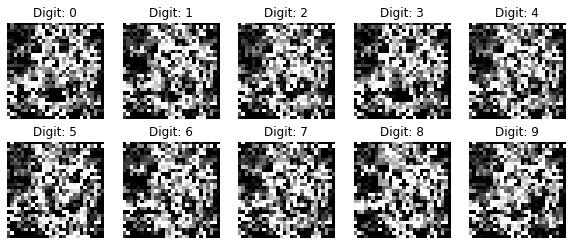

51750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.314315]


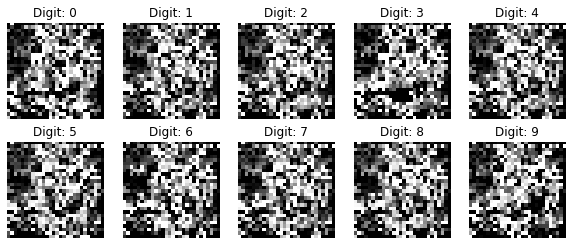

52000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.308743]


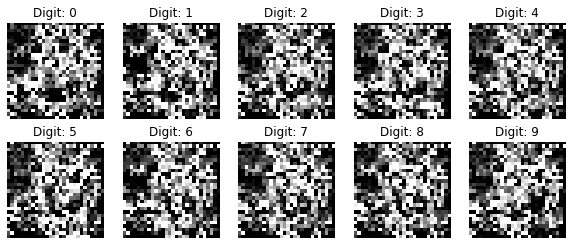

52250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.315005]


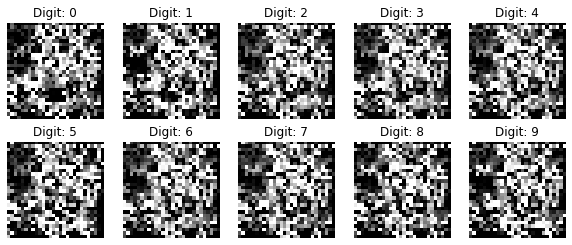

52500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.311189]


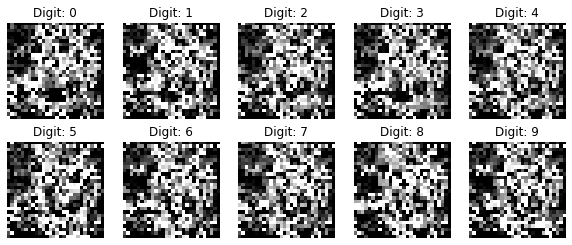

52750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.327726]


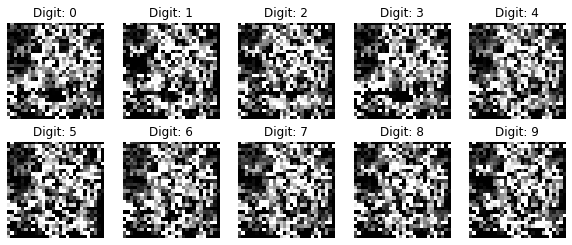

53000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.317366]


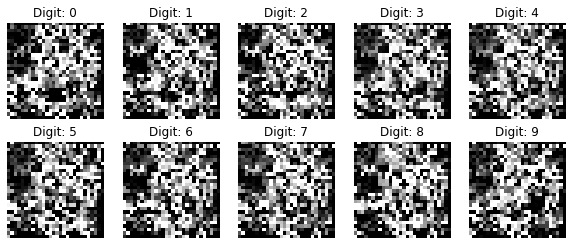

53250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.292712]


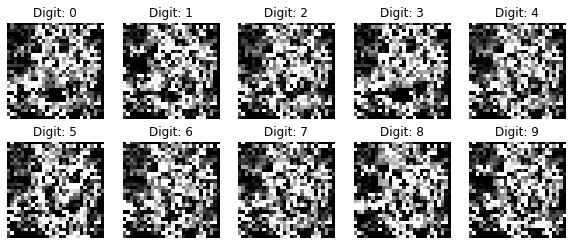

53500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.330965]


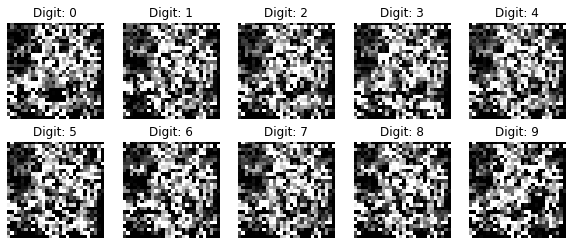

53750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.324061]


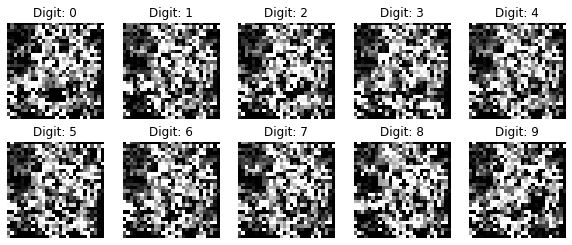

54000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.327361]


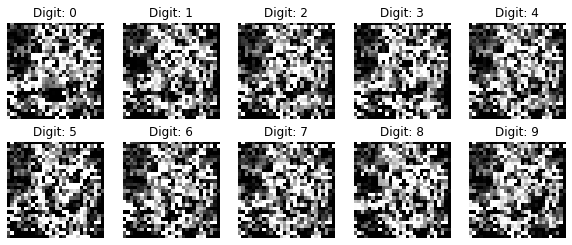

54250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.331175]


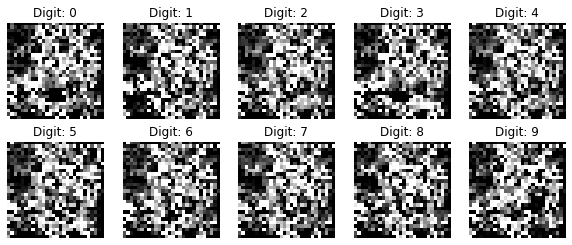

54500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.332744]


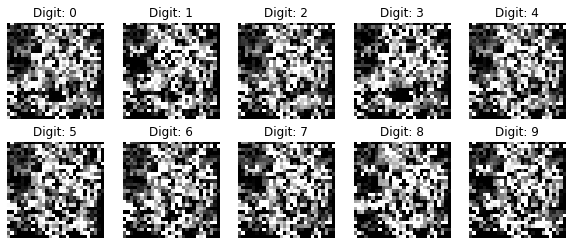

54750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.327620]


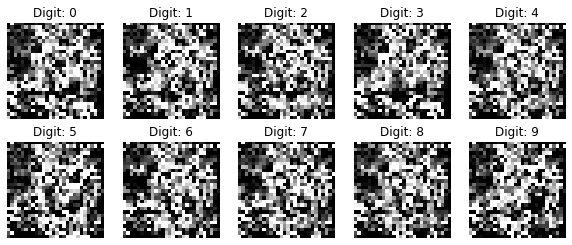

55000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.323789]


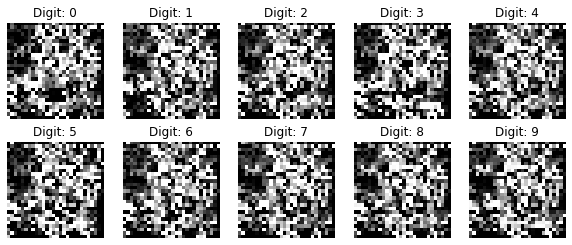

55250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.333304]


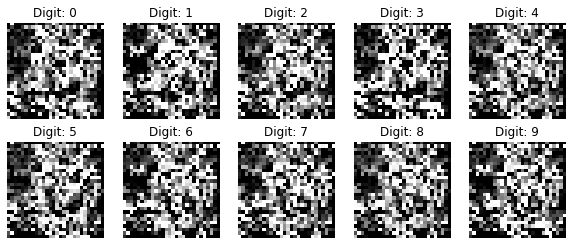

55500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.317046]


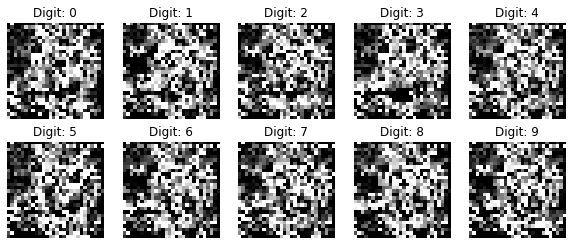

55750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.345674]


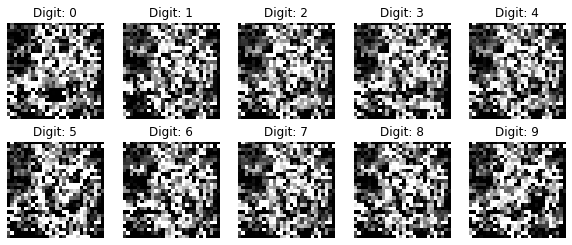

56000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.343086]


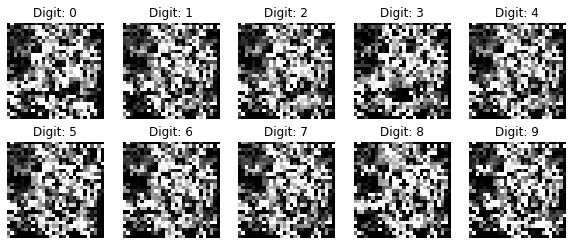

56250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.329349]


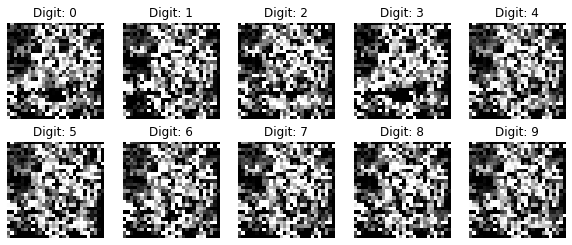

56500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.337171]


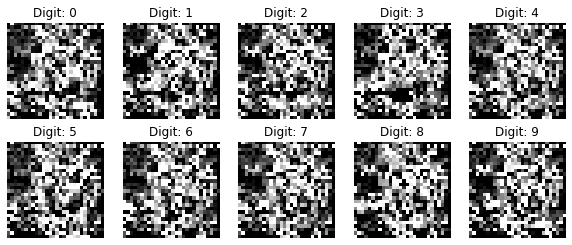

56750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.355267]


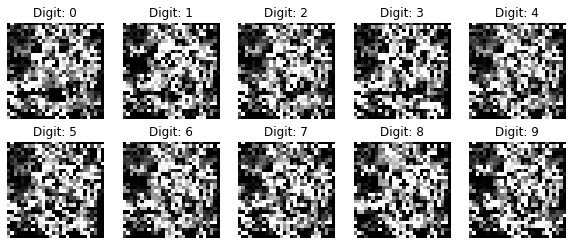

57000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.357976]


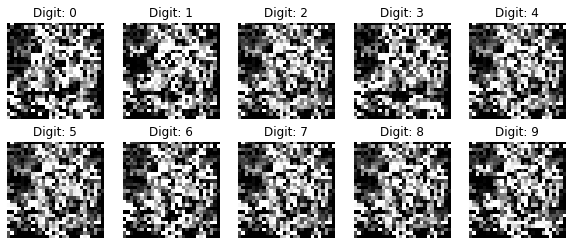

57250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.341950]


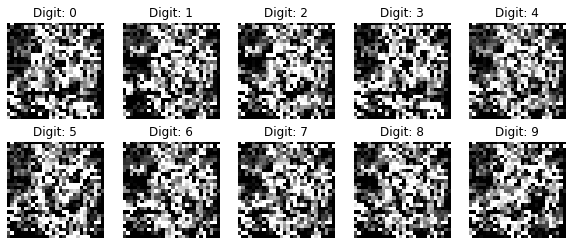

57500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.342236]


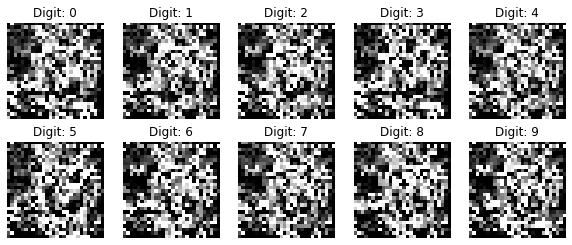

57750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.361744]


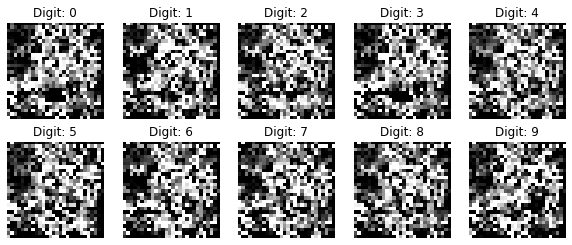

58000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.371599]


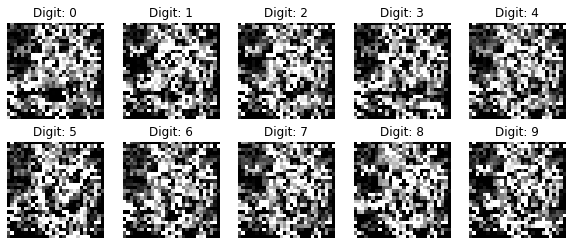

58250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.361963]


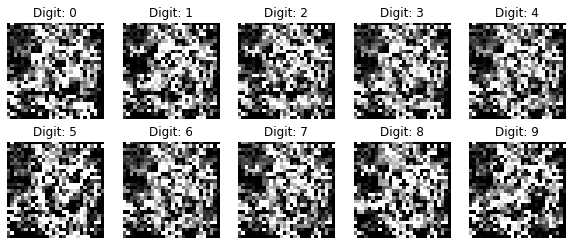

58500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.398048]


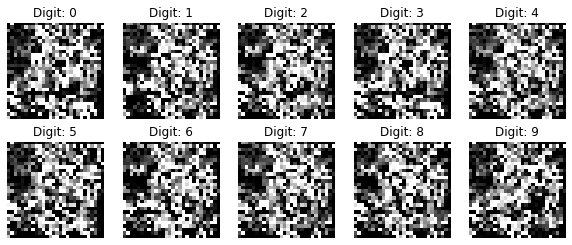

58750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.383663]


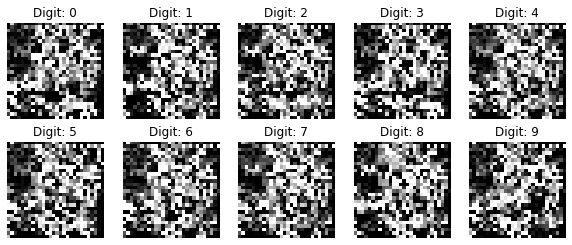

59000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.382625]


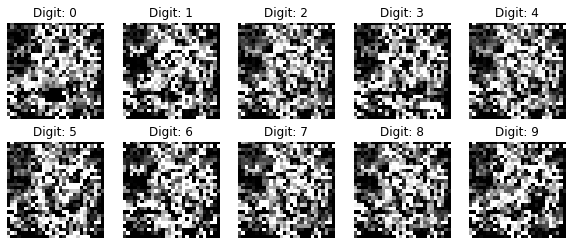

59250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.393111]


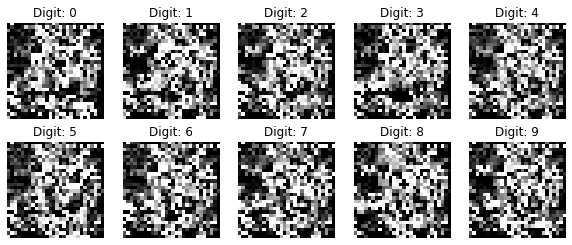

59500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.400181]


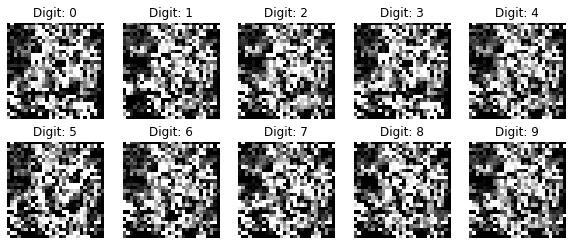

59750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.385787]


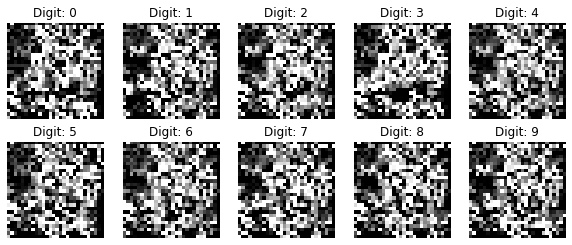

60000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.355242]


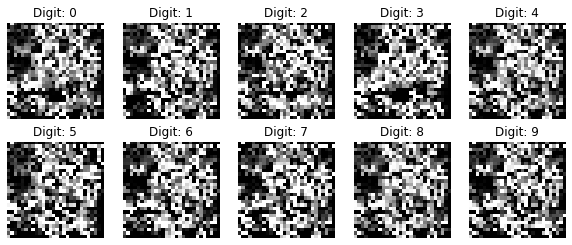

60250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.344098]


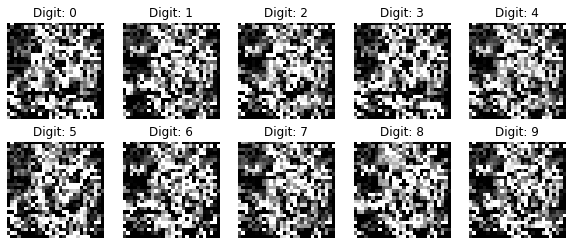

60500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.331795]


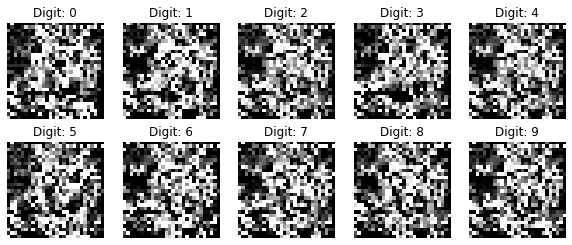

60750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.314096]


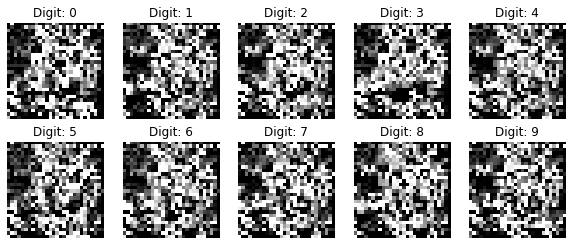

61000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.297627]


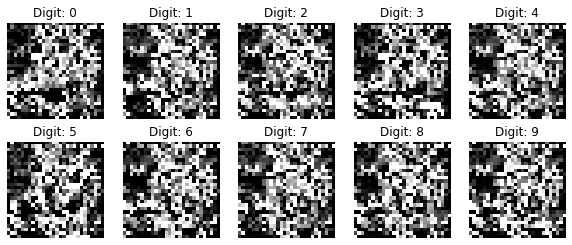

61250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.307528]


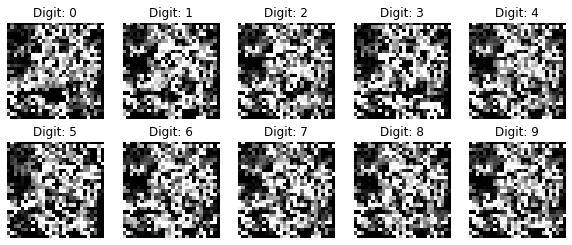

61500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.286180]


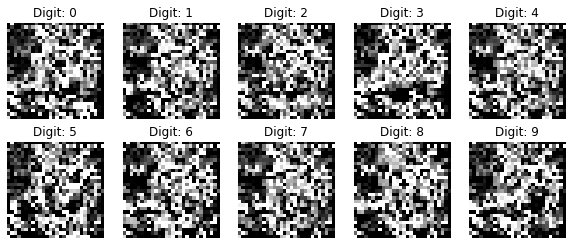

61750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.281988]


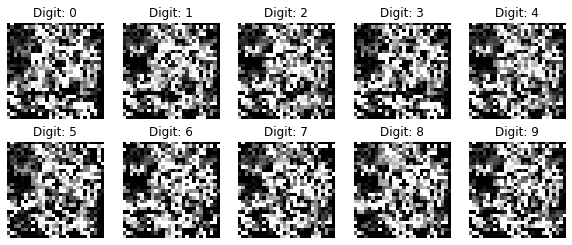

62000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.297433]


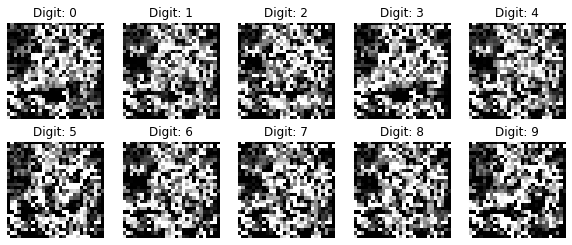

62250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.276199]


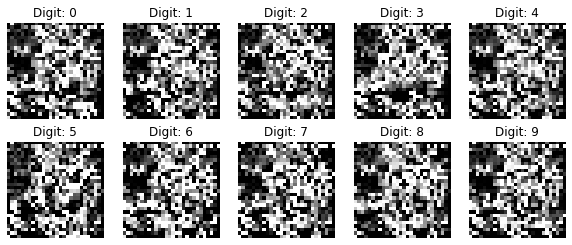

62500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.242528]


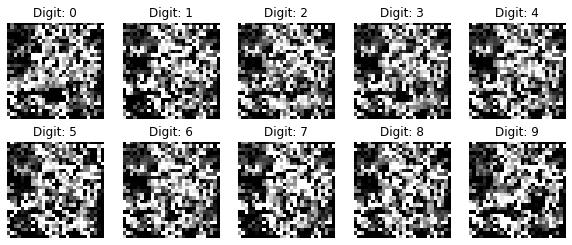

62750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.261619]


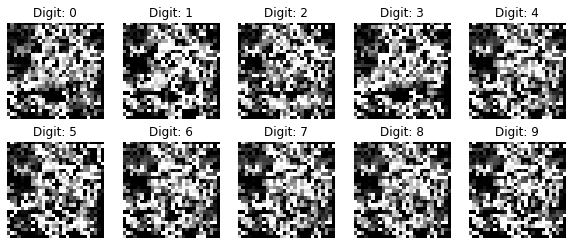

63000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.262067]


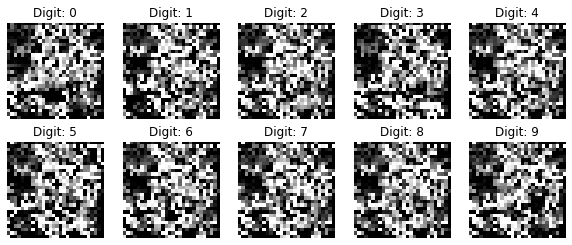

63250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.258623]


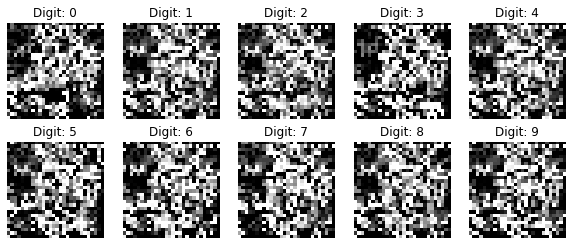

63500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.254294]


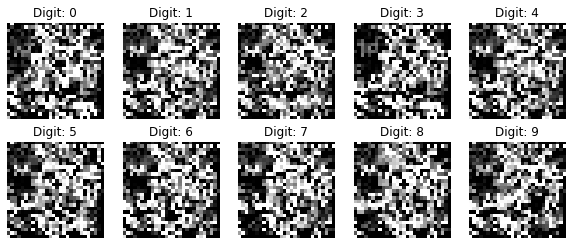

63750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.269453]


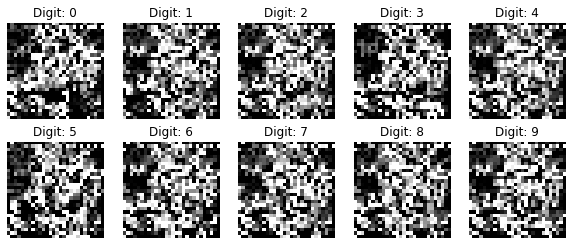

64000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.274691]


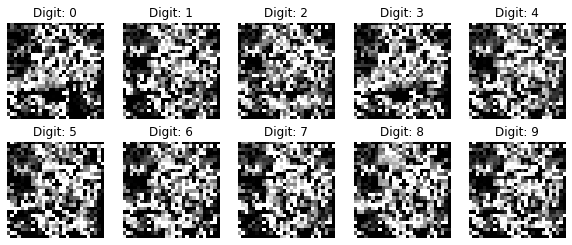

64250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.257804]


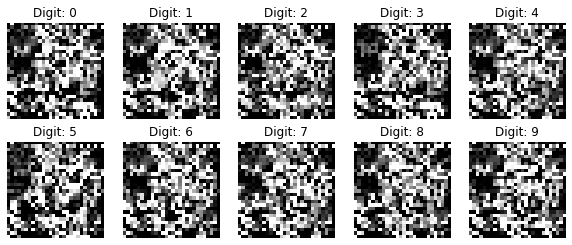

64500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.276804]


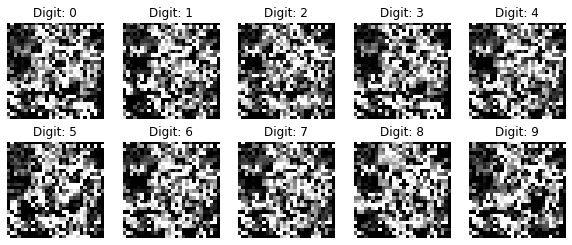

64750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.290697]


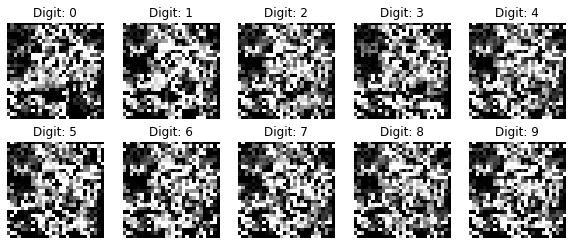

65000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.275864]


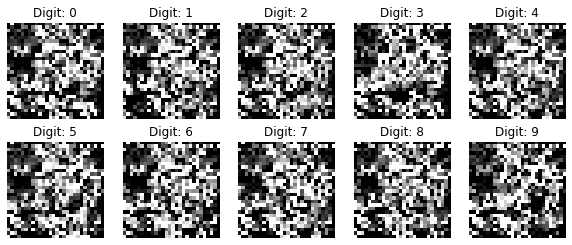

65250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.298915]


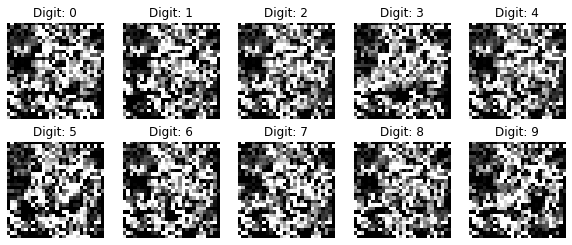

65500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.309393]


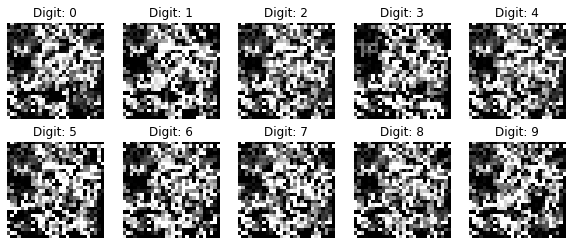

65750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.324243]


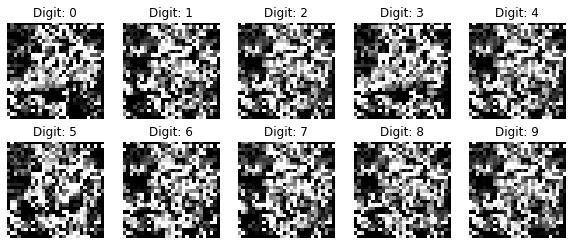

66000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.291485]


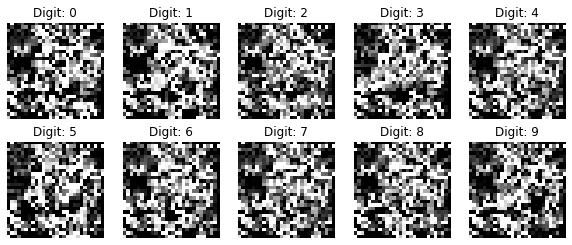

66250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.293344]


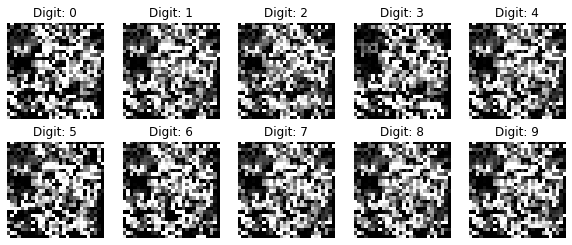

66500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.327987]


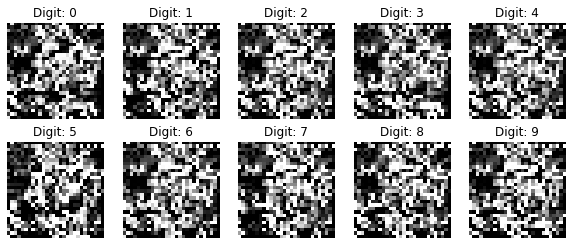

66750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.324605]


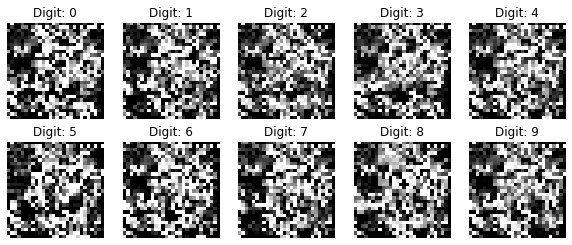

67000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.274908]


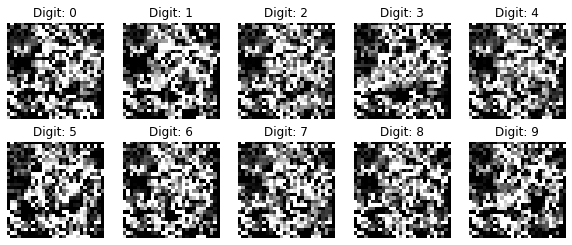

67250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.272851]


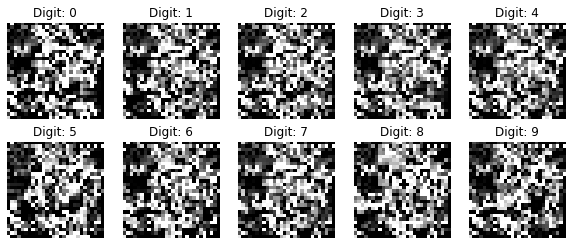

67500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.257416]


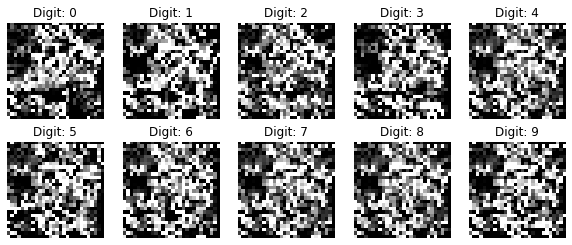

67750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.251385]


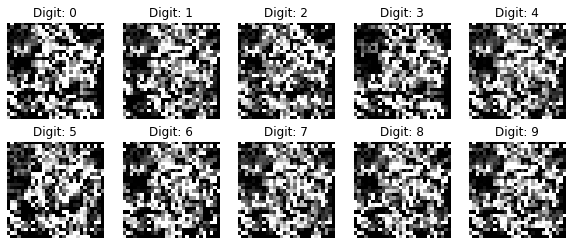

68000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.260016]


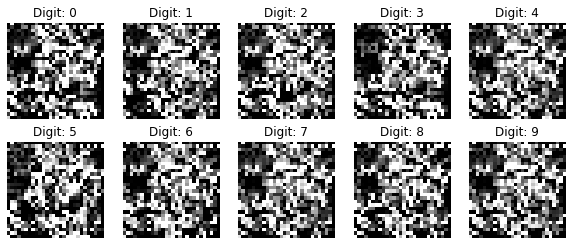

68250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.238854]


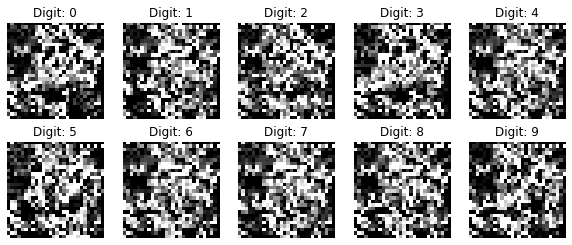

68500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.225049]


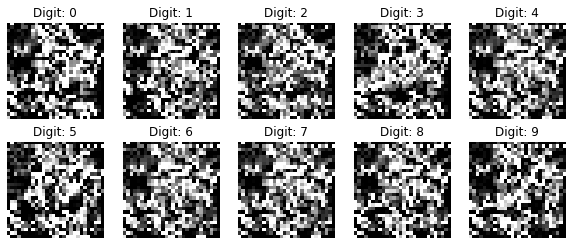

68750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.214238]


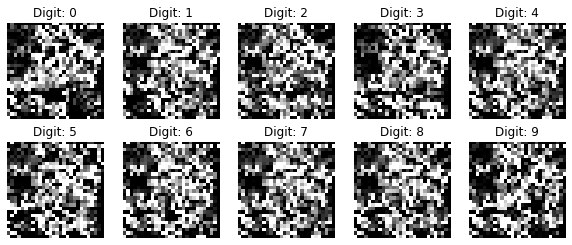

69000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.211232]


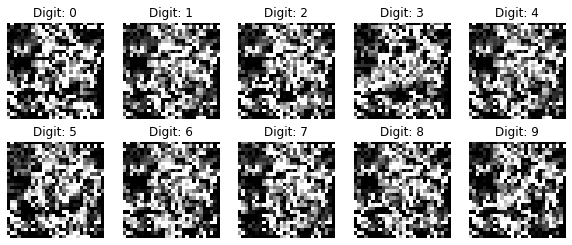

69250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.205252]


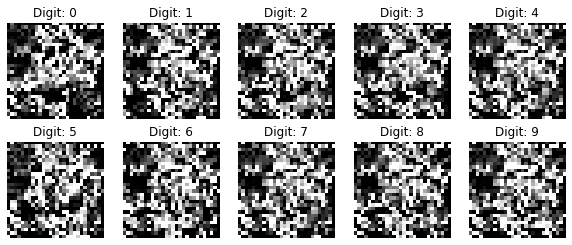

69500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.202141]


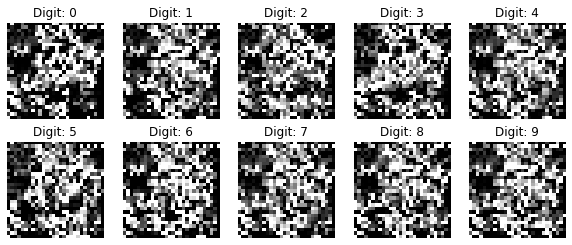

69750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.239982]


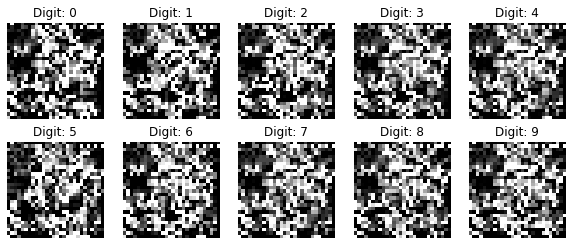

70000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.239188]


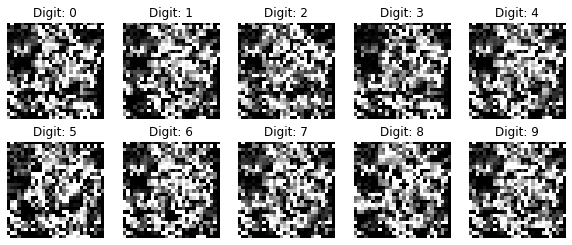

70250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.231435]


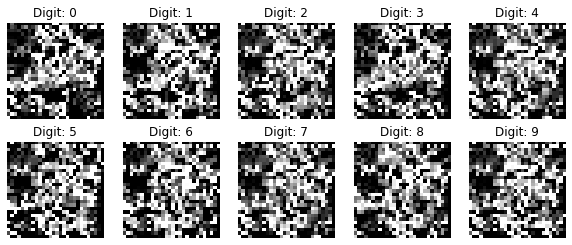

70500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.227994]


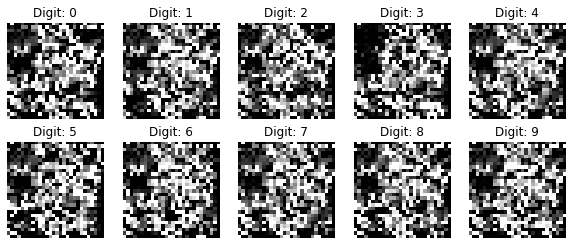

70750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.246601]


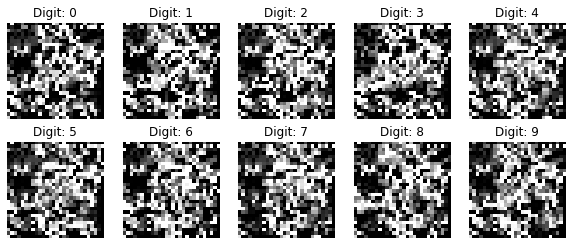

71000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.259806]


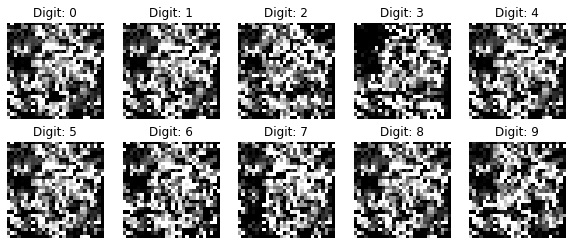

71250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.246990]


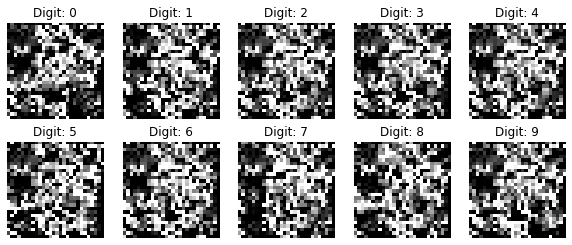

71500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.260567]


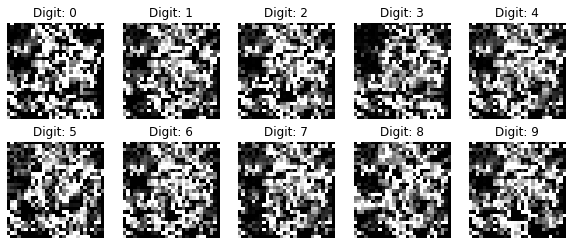

71750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.262452]


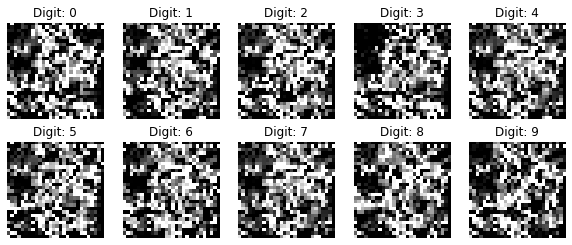

72000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.293486]


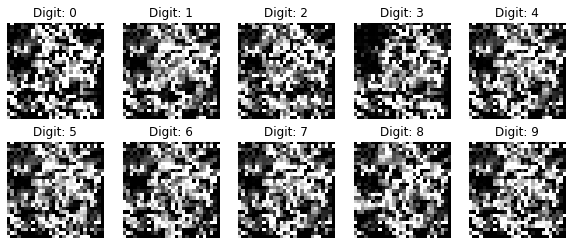

72250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.265117]


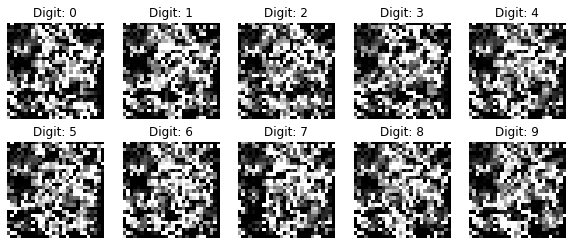

72500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.263269]


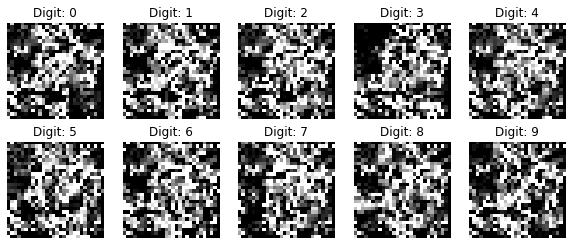

72750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.297464]


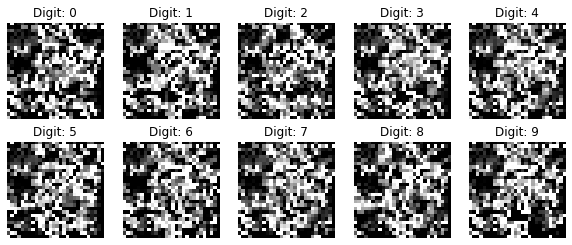

73000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.279683]


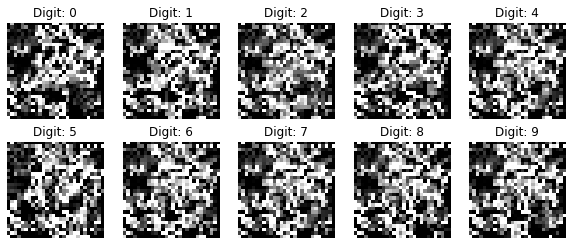

73250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.242338]


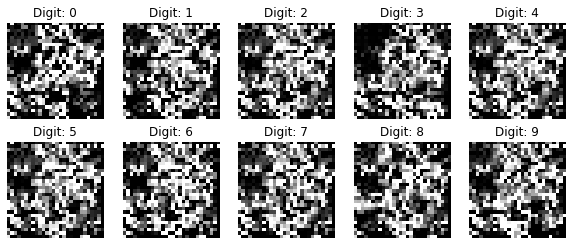

73500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.310032]


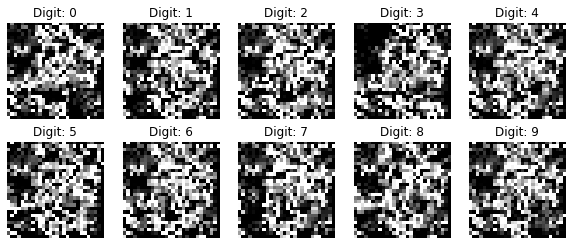

73750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.270625]


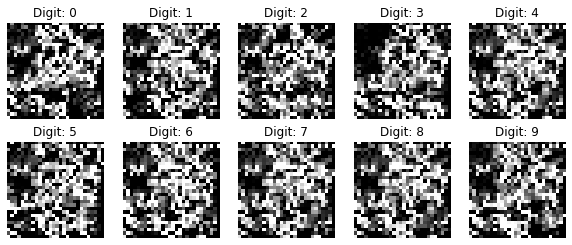

74000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.297900]


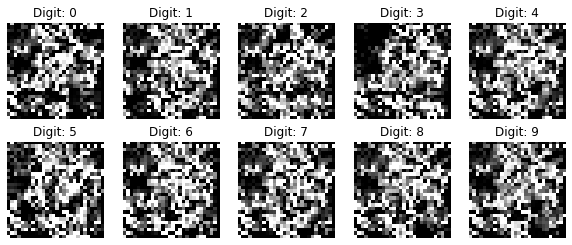

74250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.285194]


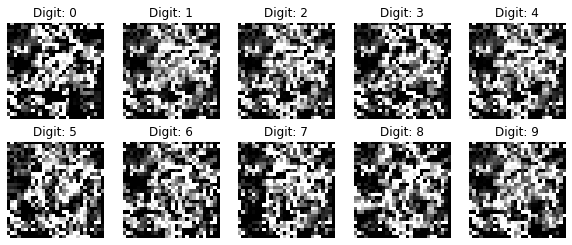

74500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.292706]


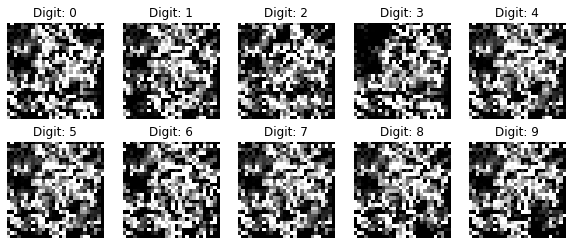

74750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.276954]


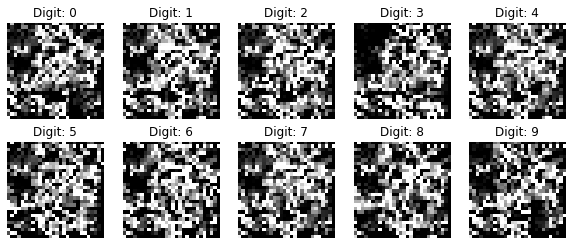

75000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.278154]


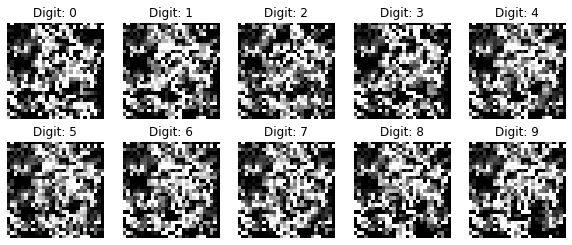

75250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.262005]


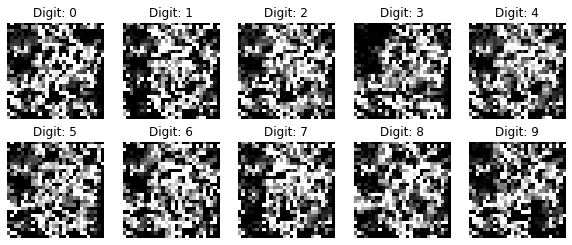

75500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.280158]


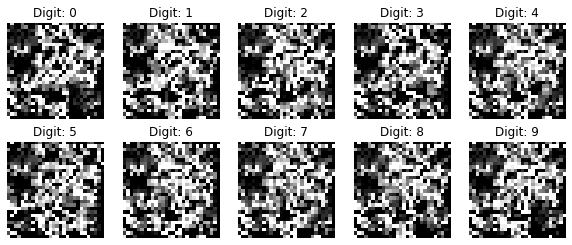

75750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.266817]


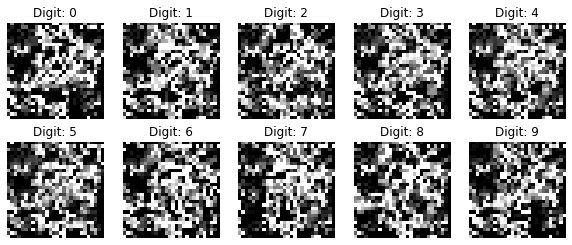

76000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.293995]


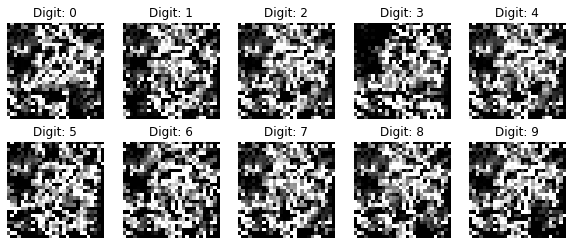

76250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.269499]


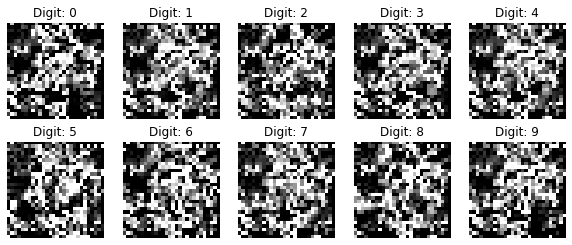

76500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.269698]


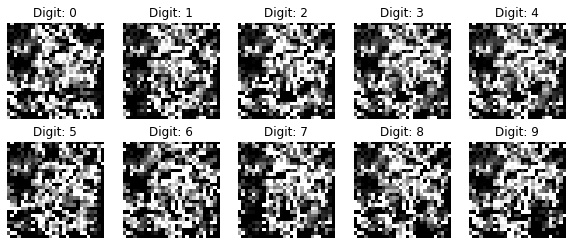

76750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.276110]


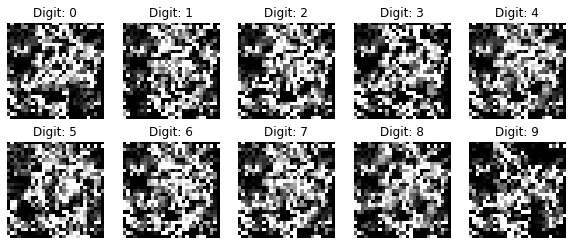

77000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.333827]


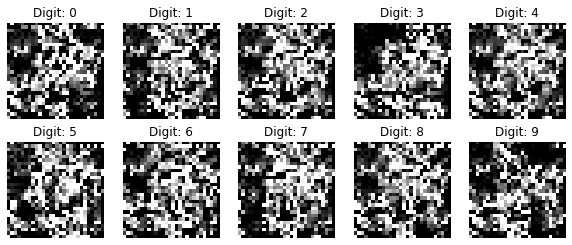

77250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.336041]


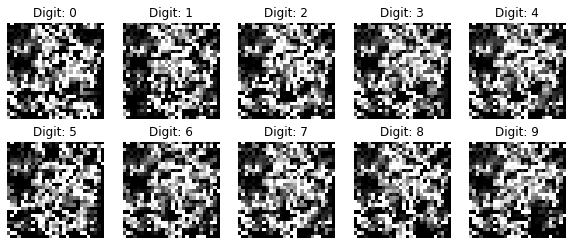

77500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.282682]


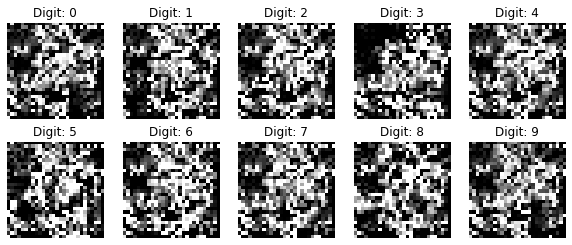

77750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.285270]


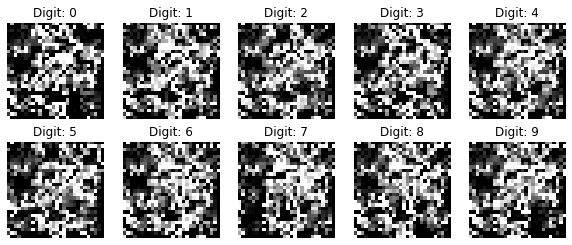

78000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.276122]


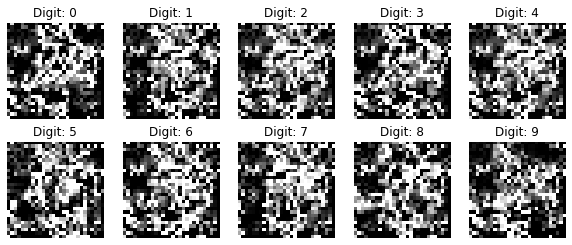

78250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.302280]


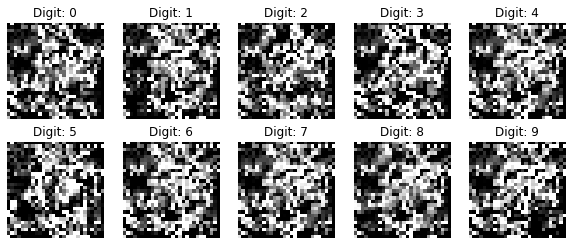

78500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.313706]


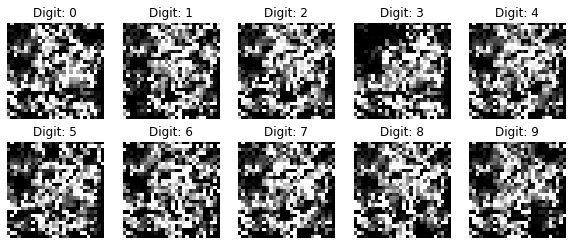

78750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.309372]


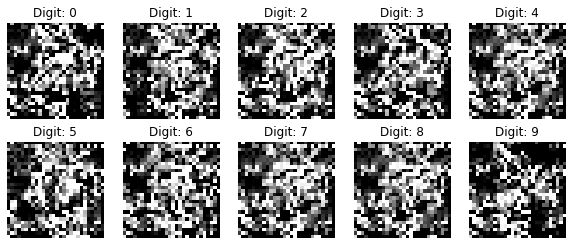

79000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.312829]


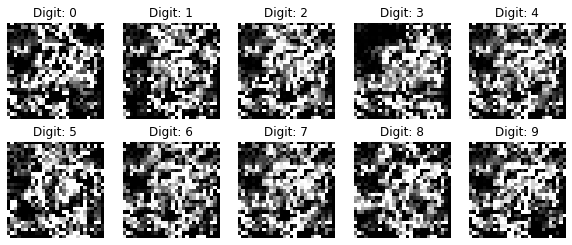

79250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.327712]


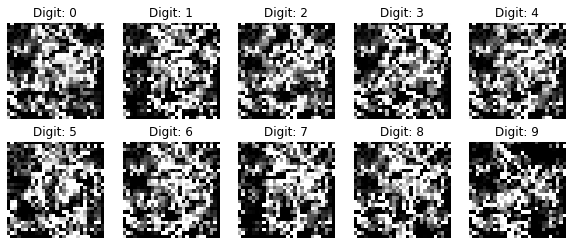

79500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.355128]


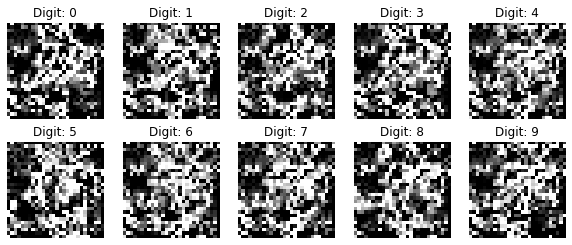

79750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.295047]


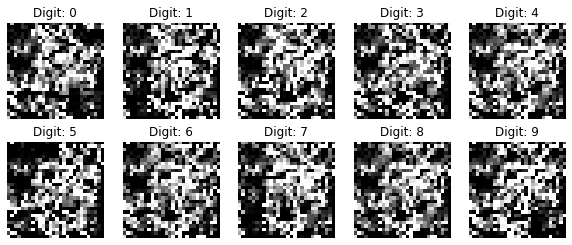

80000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.256844]


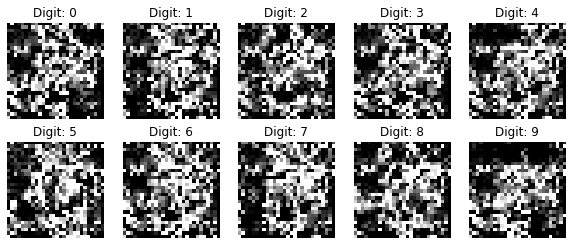

80250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.736377]


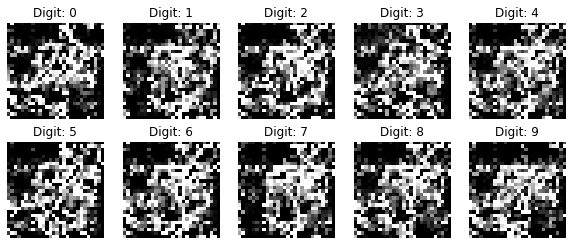

80500 [D loss: 0.000000, acc.: 100.00%] [G loss: 1.014428]


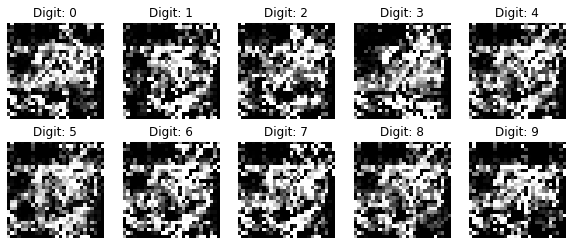

80750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.827090]


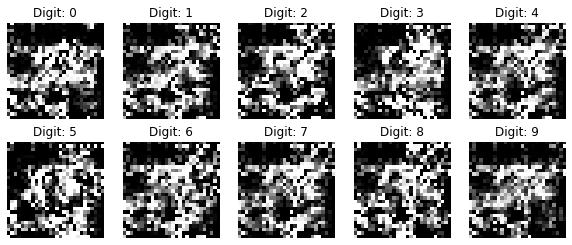

81000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.723725]


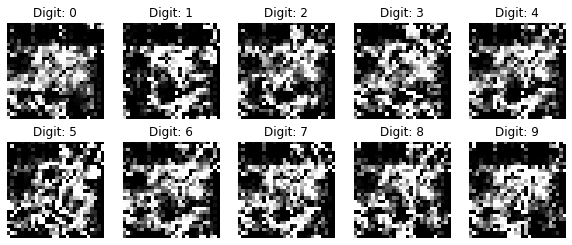

81250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.582850]


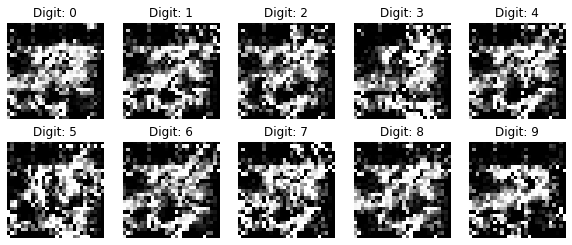

81500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.489363]


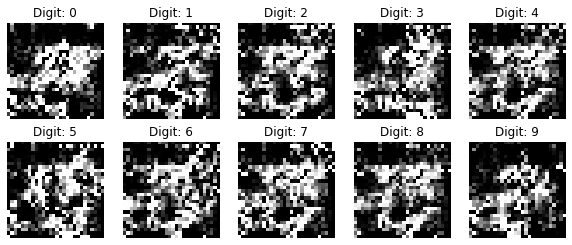

81750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.394765]


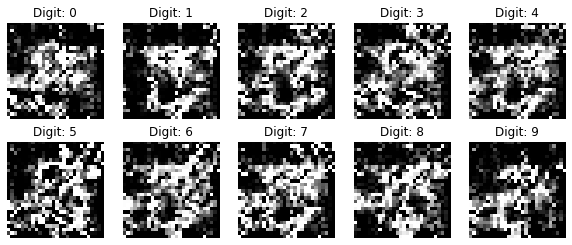

82000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.397062]


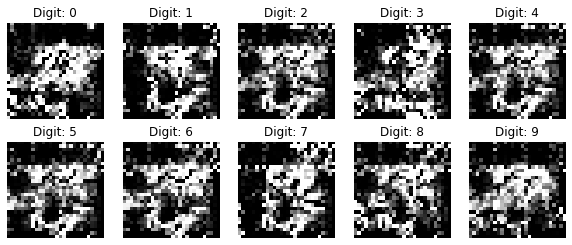

82250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.352015]


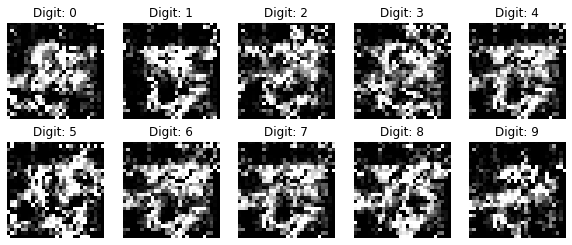

82500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.602427]


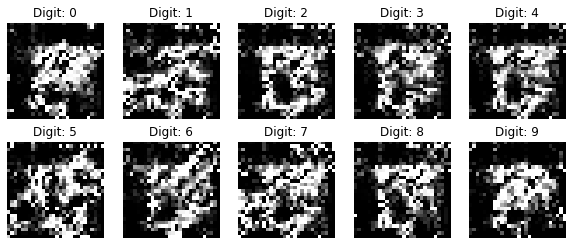

82750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.970972]


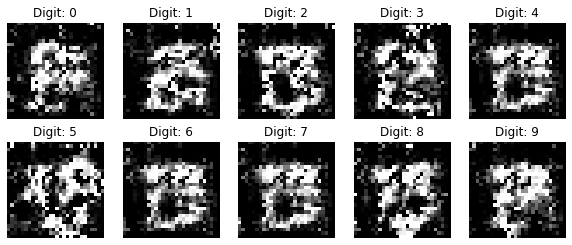

83000 [D loss: 0.000681, acc.: 100.00%] [G loss: 0.064329]


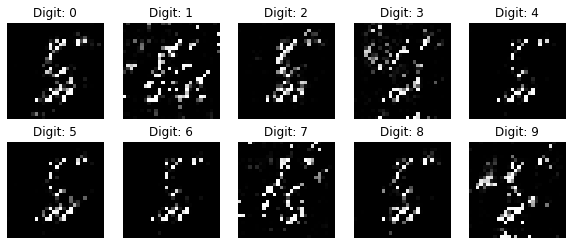

83250 [D loss: 0.000061, acc.: 100.00%] [G loss: 0.027236]


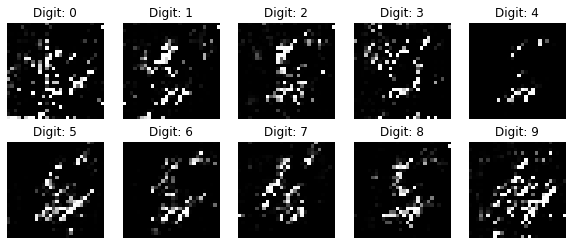

83500 [D loss: 0.000033, acc.: 100.00%] [G loss: 0.007219]


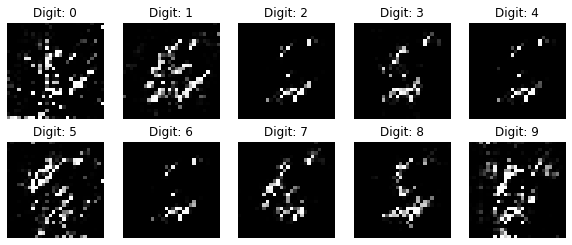

83750 [D loss: 0.000017, acc.: 100.00%] [G loss: 0.005367]


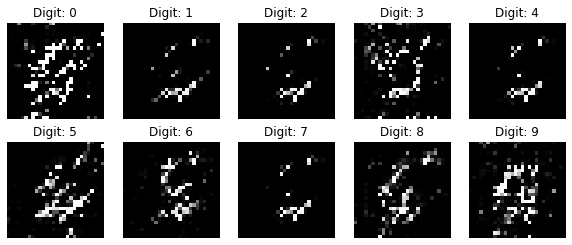

84000 [D loss: 0.000009, acc.: 100.00%] [G loss: 0.005456]


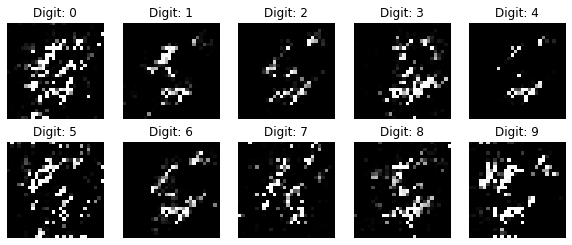

84250 [D loss: 0.000006, acc.: 100.00%] [G loss: 0.004928]


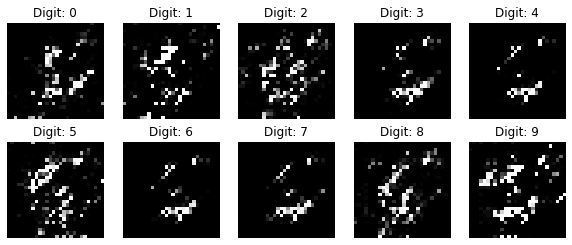

84500 [D loss: 0.000007, acc.: 100.00%] [G loss: 0.004228]


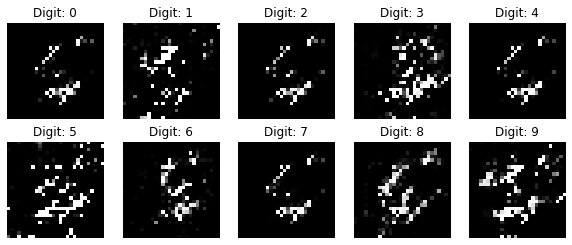

84750 [D loss: 0.000003, acc.: 100.00%] [G loss: 0.005269]


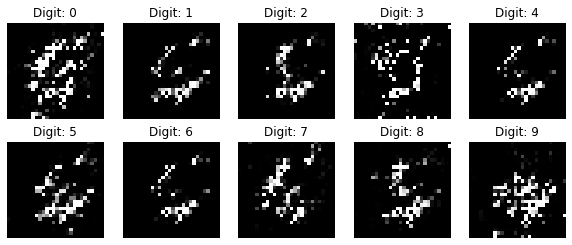

85000 [D loss: 0.000004, acc.: 100.00%] [G loss: 0.005742]


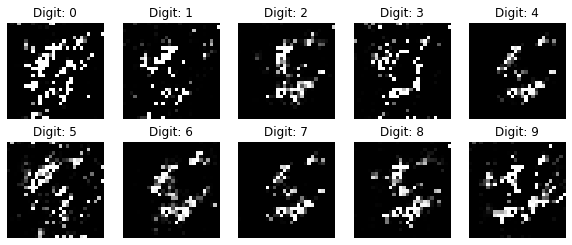

85250 [D loss: 0.000005, acc.: 100.00%] [G loss: 0.006704]


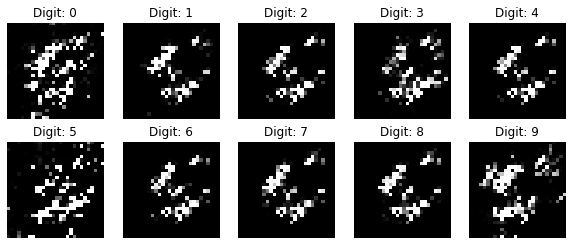

85500 [D loss: 0.001564, acc.: 100.00%] [G loss: 0.010781]


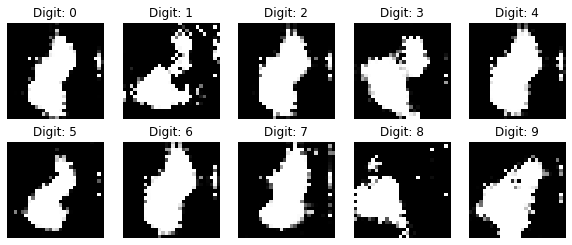

85750 [D loss: 0.000254, acc.: 100.00%] [G loss: 0.010908]


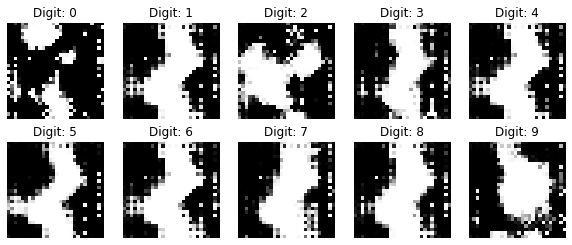

86000 [D loss: 0.000586, acc.: 100.00%] [G loss: 0.014841]


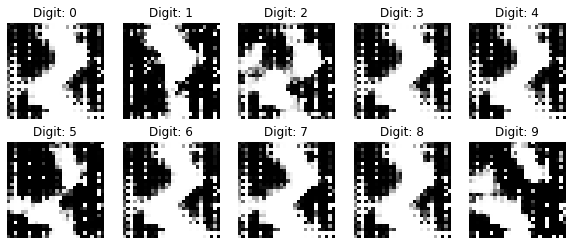

86250 [D loss: 0.000633, acc.: 100.00%] [G loss: 1.264155]


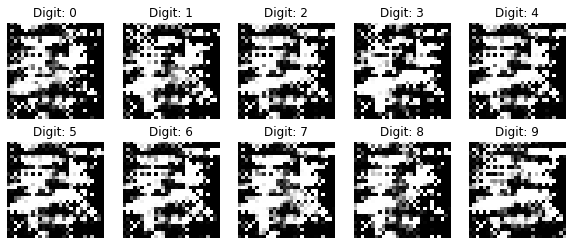

86500 [D loss: 0.000024, acc.: 100.00%] [G loss: 0.035592]


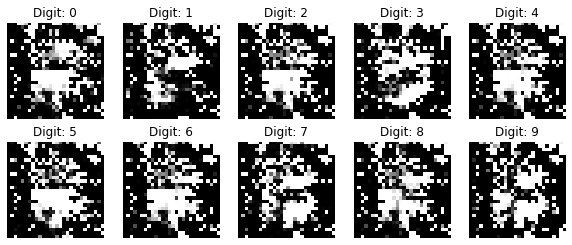

86750 [D loss: 0.000008, acc.: 100.00%] [G loss: 0.027039]


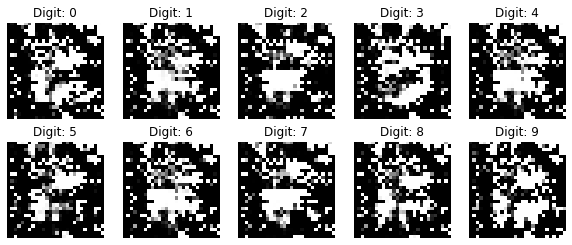

87000 [D loss: 0.000005, acc.: 100.00%] [G loss: 0.018603]


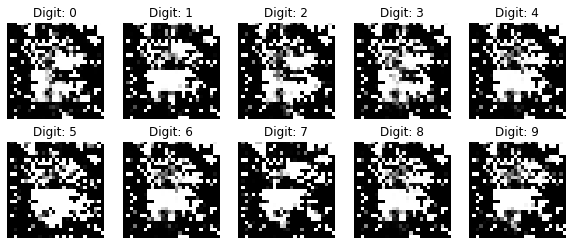

87250 [D loss: 0.000004, acc.: 100.00%] [G loss: 0.013357]


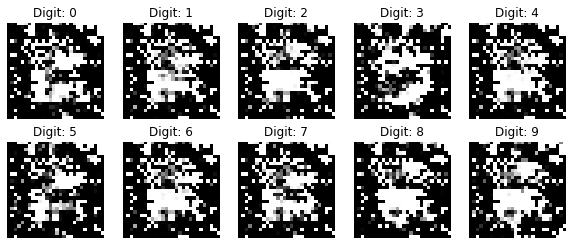

87500 [D loss: 0.000003, acc.: 100.00%] [G loss: 0.011986]


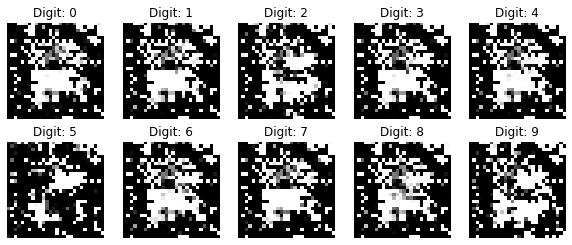

87750 [D loss: 0.000001, acc.: 100.00%] [G loss: 0.010258]


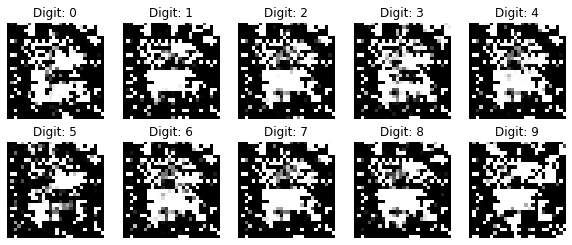

88000 [D loss: 0.000001, acc.: 100.00%] [G loss: 0.008870]


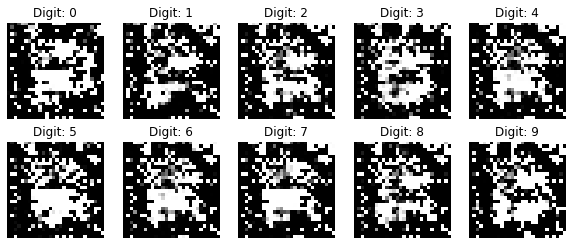

88250 [D loss: 0.000001, acc.: 100.00%] [G loss: 0.006707]


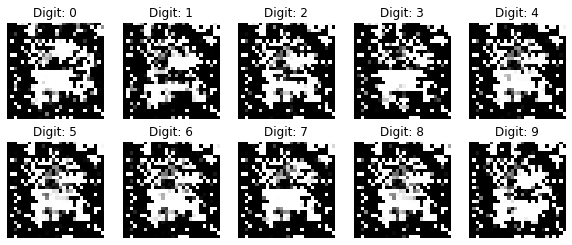

88500 [D loss: 0.000001, acc.: 100.00%] [G loss: 0.006675]


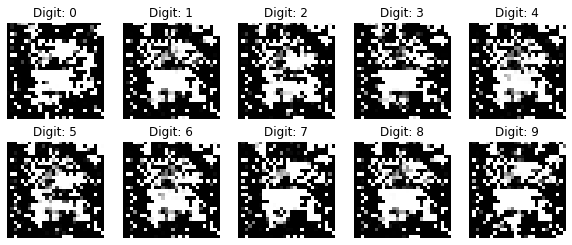

88750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.006335]


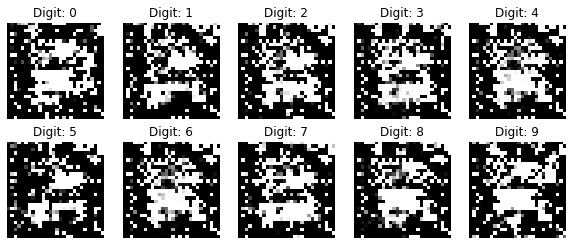

89000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.005200]


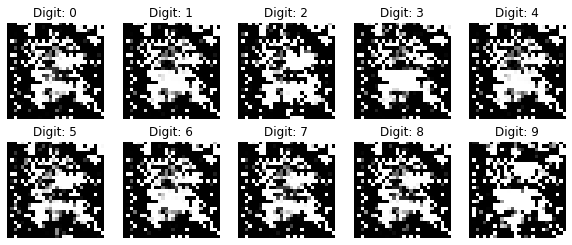

89250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.005356]


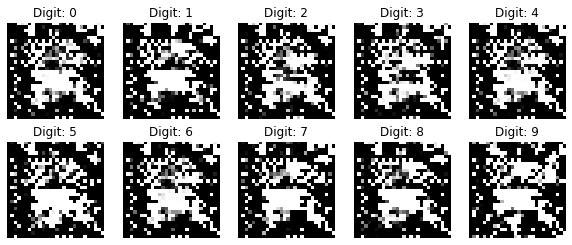

89500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.005464]


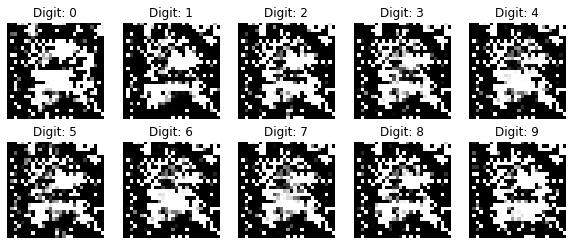

89750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004825]


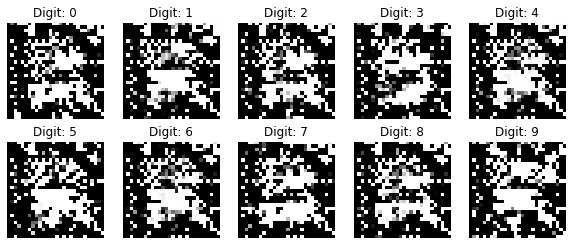

90000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004632]


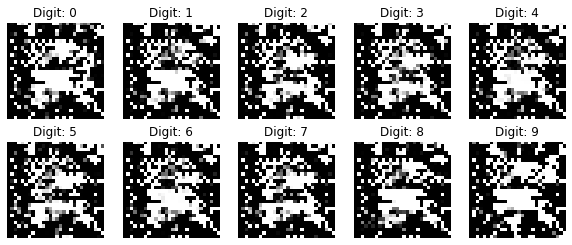

90250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.005423]


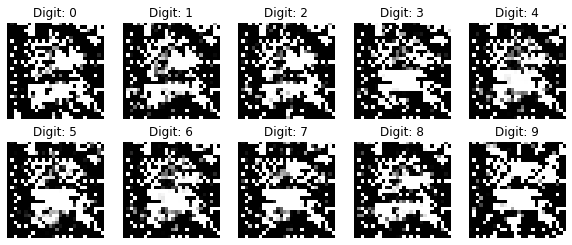

90500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004732]


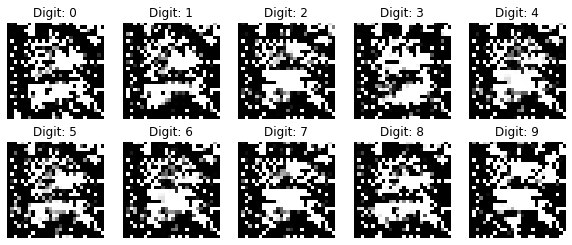

90750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004873]


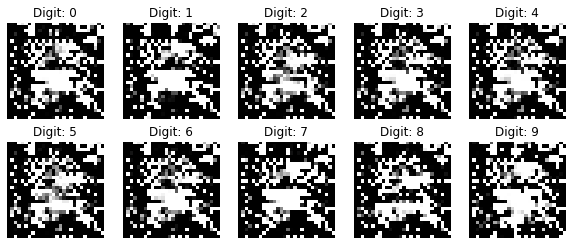

91000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004652]


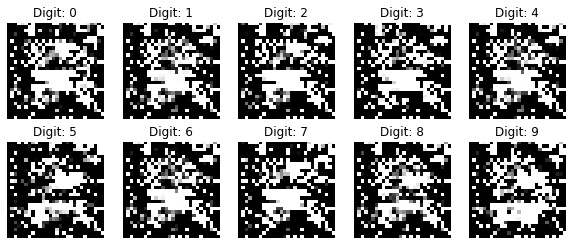

91250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.005597]


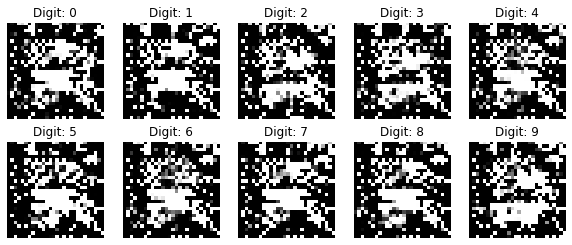

91500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004996]


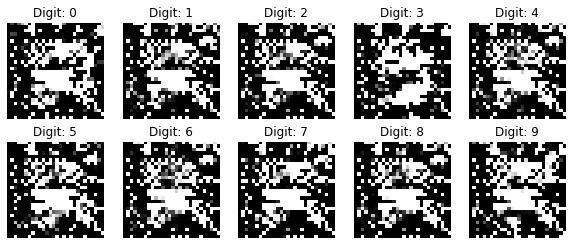

91750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.003818]


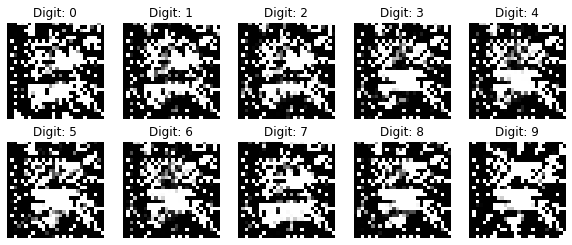

92000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004022]


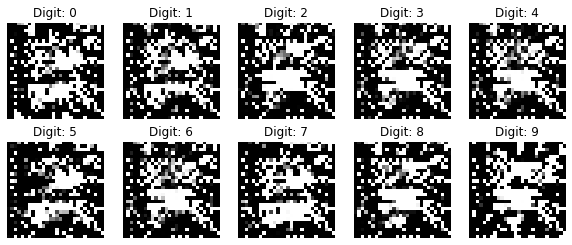

92250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004967]


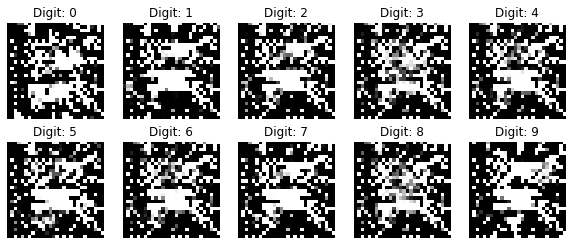

92500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.008183]


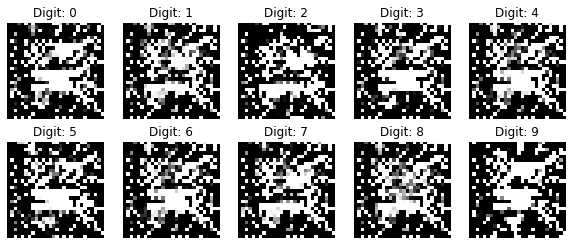

92750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.004656]


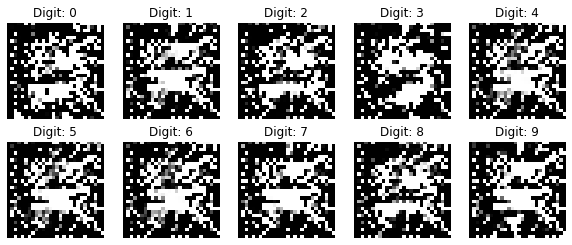

93000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.006396]


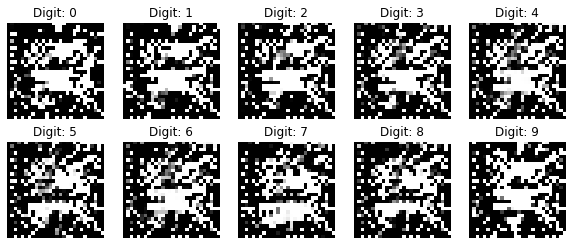

93250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.006102]


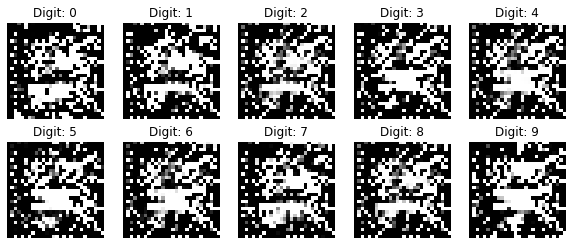

93500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.006902]


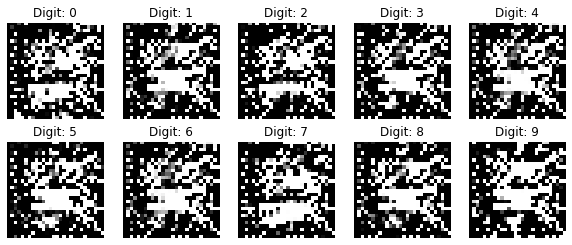

93750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.005614]


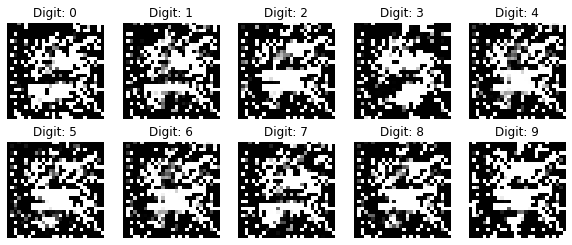

94000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.007315]


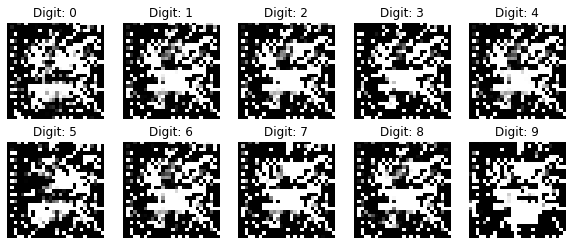

94250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.007660]


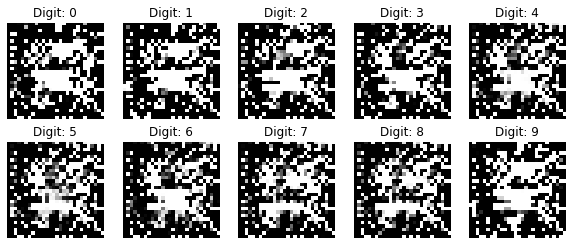

94500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.008265]


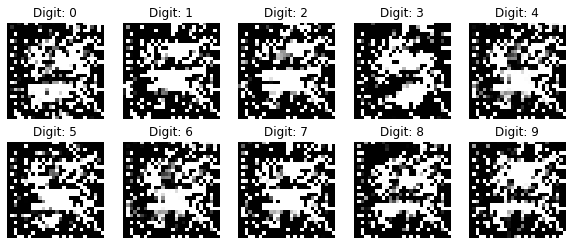

94750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.007838]


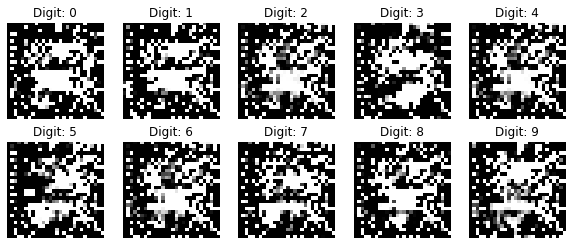

95000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.008355]


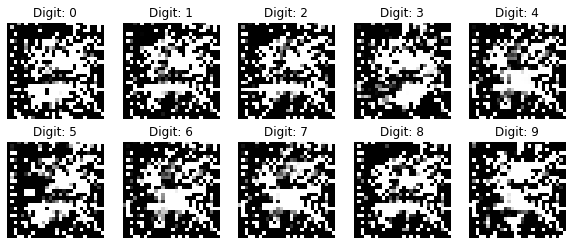

95250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.009373]


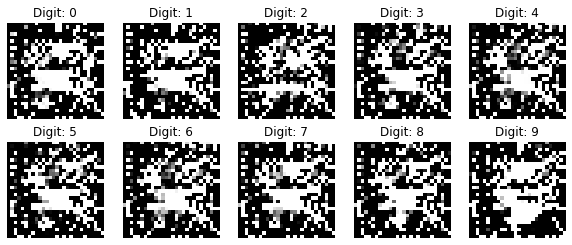

95500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.011161]


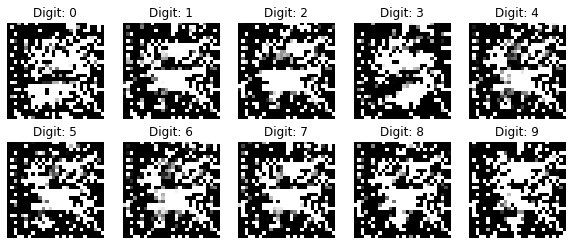

95750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.012049]


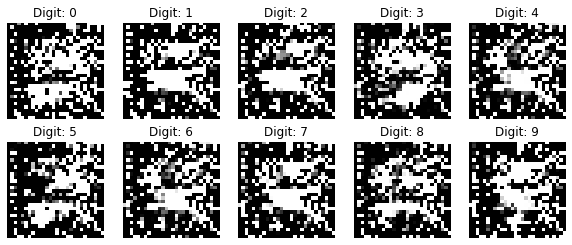

96000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.014088]


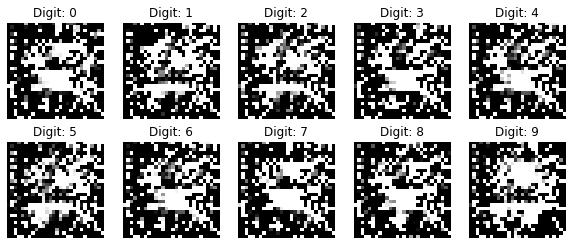

96250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.014837]


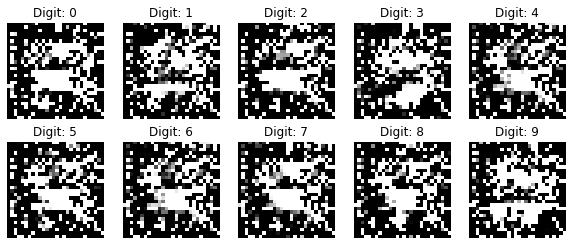

96500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.018182]


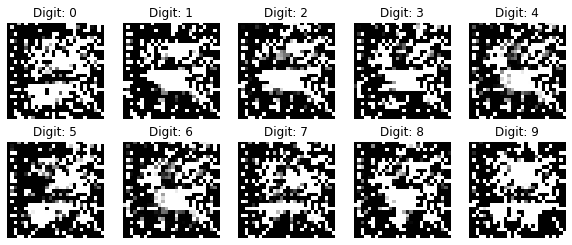

96750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.019425]


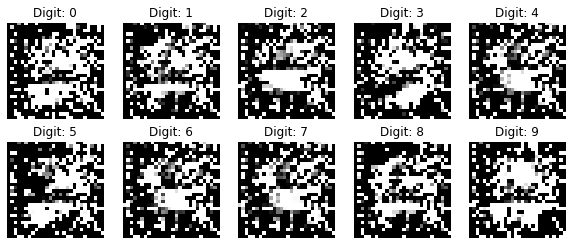

97000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.021212]


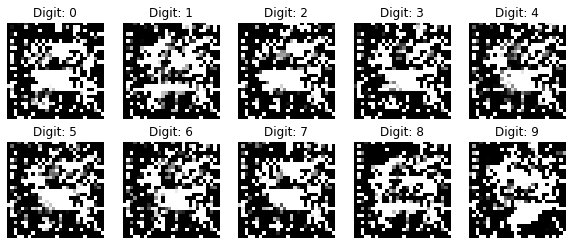

97250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.029615]


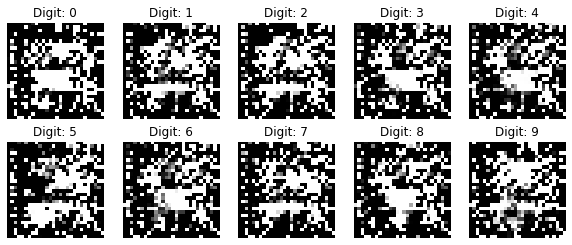

97500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.036175]


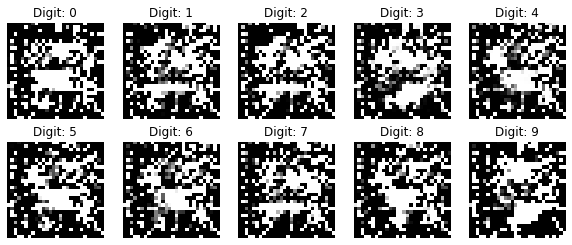

97750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.040565]


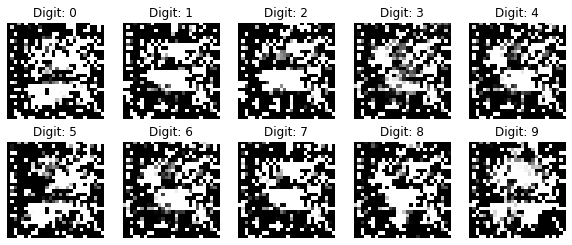

98000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.043280]


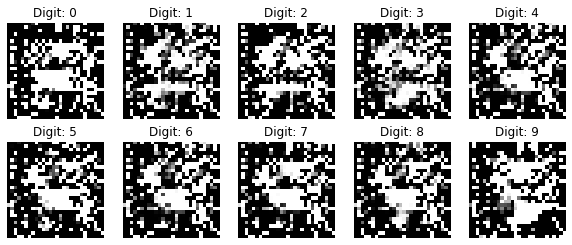

98250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.044827]


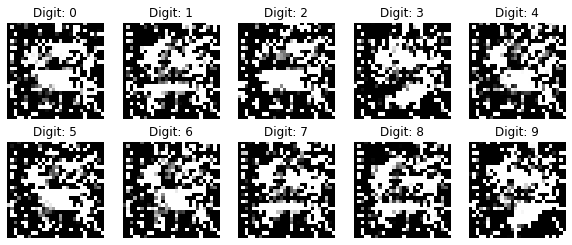

98500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.049833]


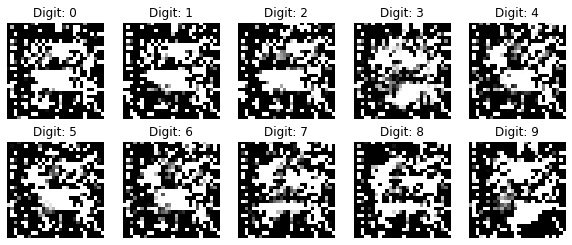

98750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.046879]


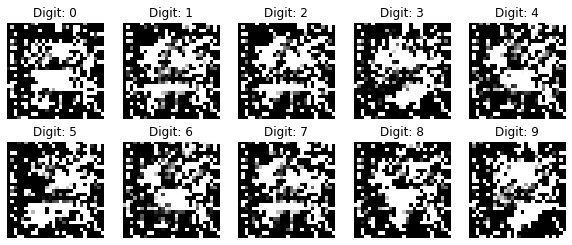

99000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.051493]


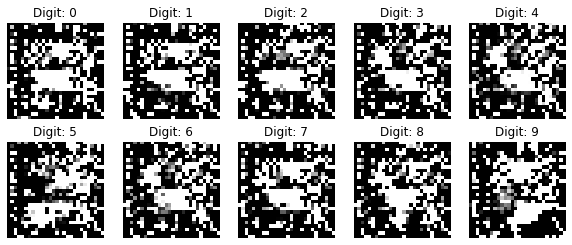

99250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.046845]


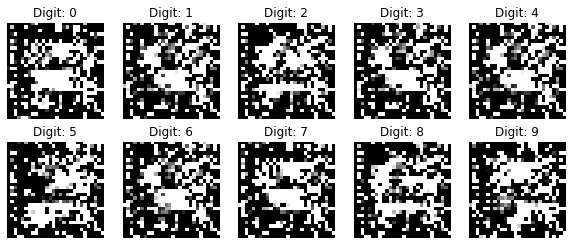

99500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.051410]


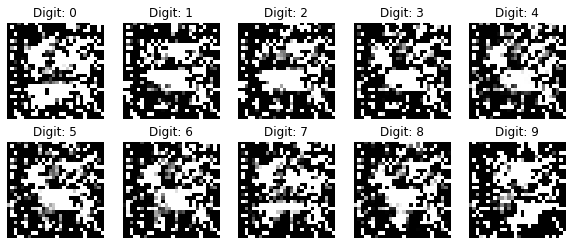

99750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058932]


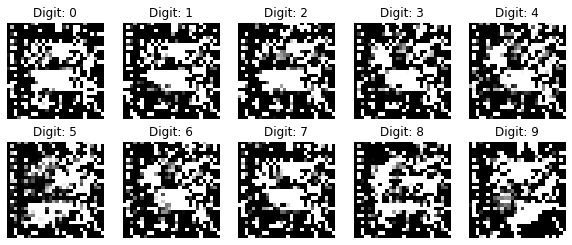

100000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.064235]


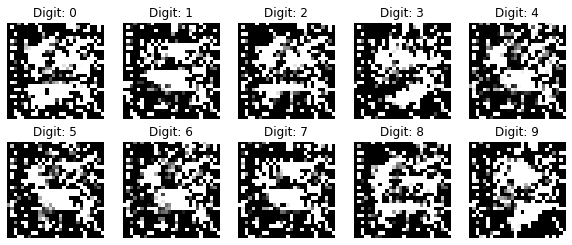

100250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.063586]


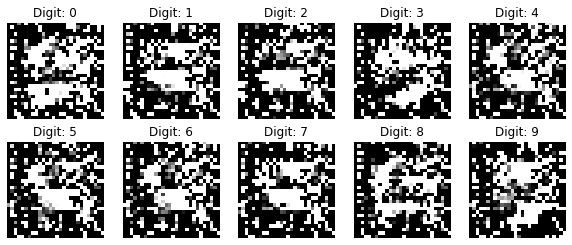

100500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.060447]


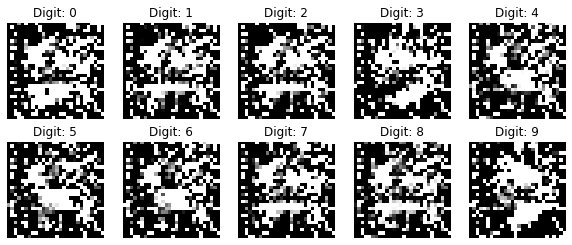

100750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.056791]


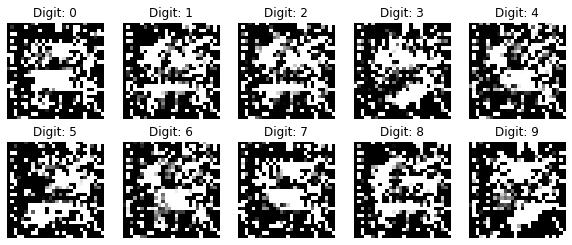

101000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.064527]


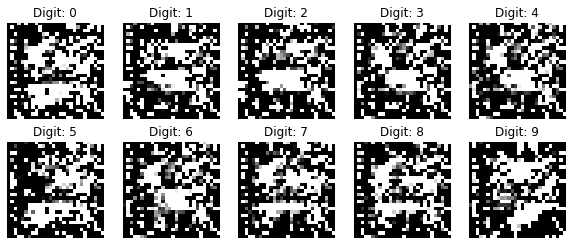

101250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058219]


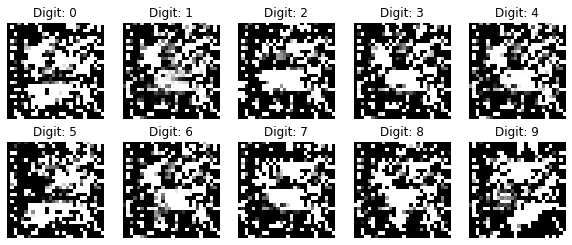

101500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.060309]


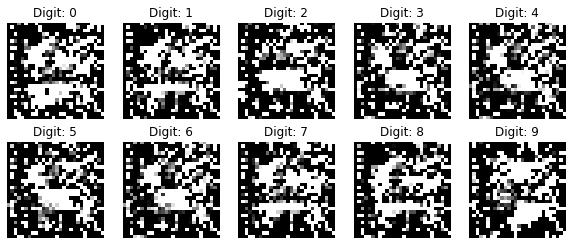

101750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.062673]


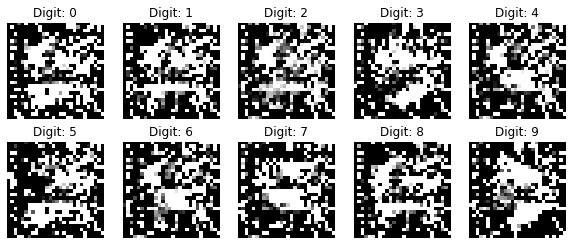

102000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.057111]


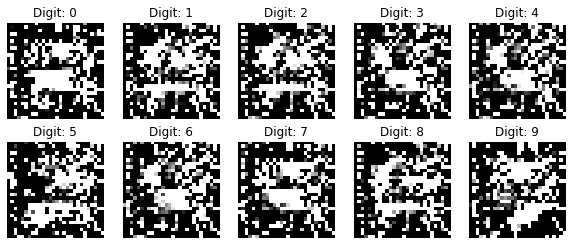

102250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.062788]


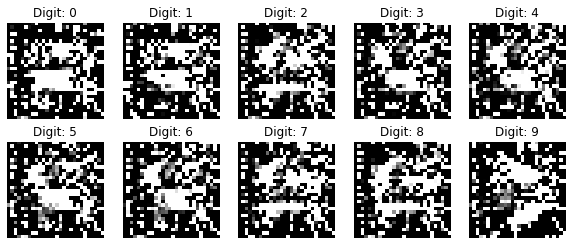

102500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058168]


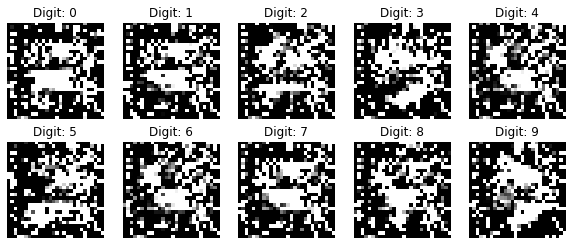

102750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.062876]


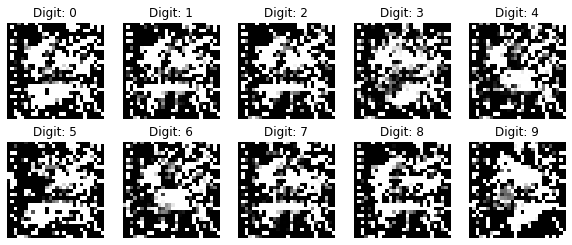

103000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.042083]


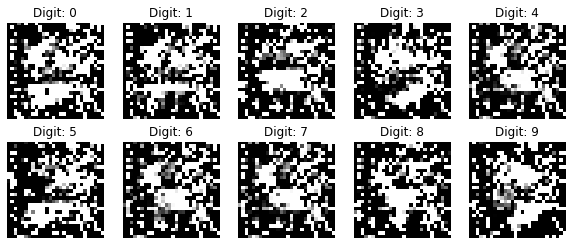

103250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.034649]


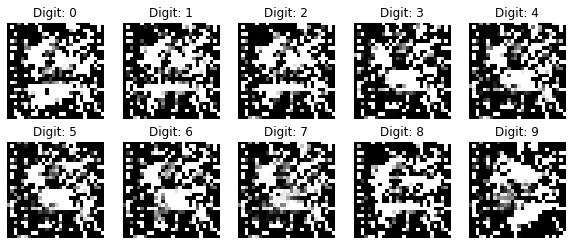

103500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.028393]


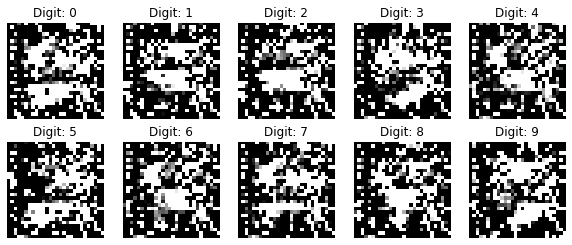

103750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.022511]


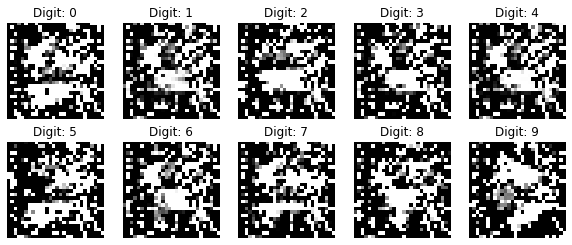

104000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.027948]


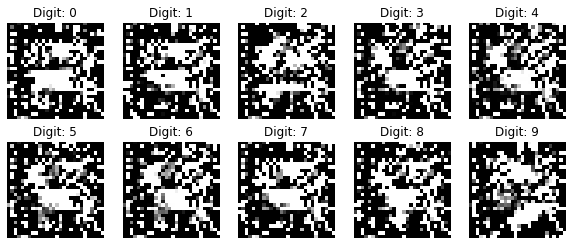

104250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.027252]


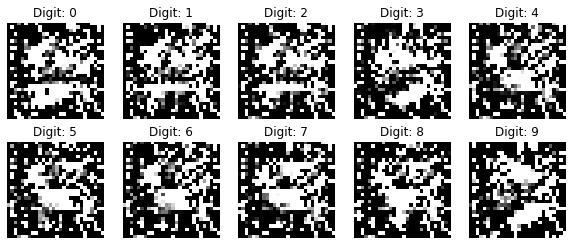

104500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.027872]


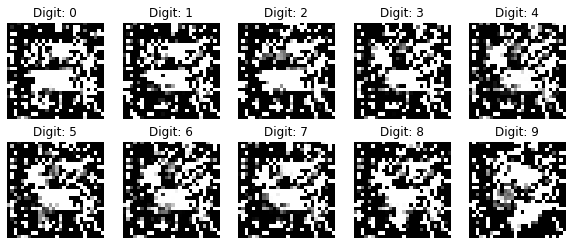

104750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.023770]


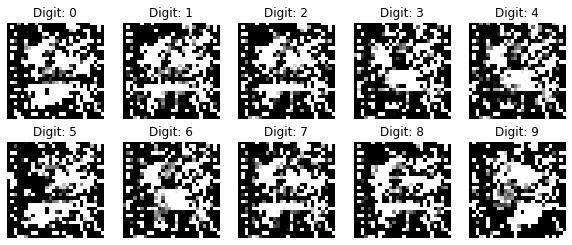

105000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.024080]


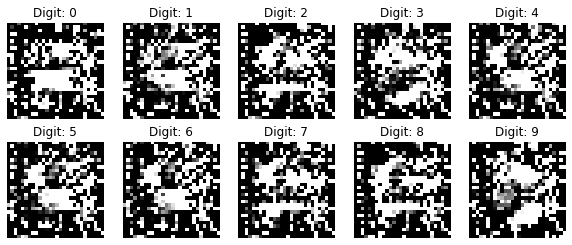

105250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.029803]


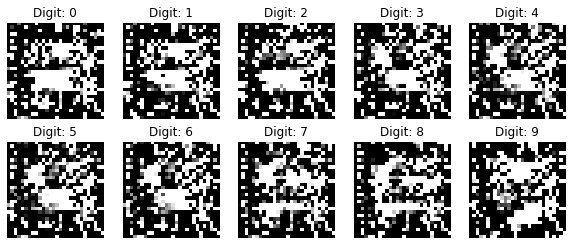

105500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.024685]


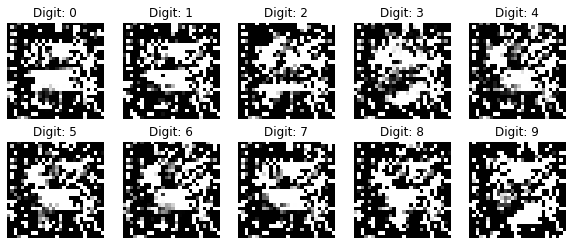

105750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.026179]


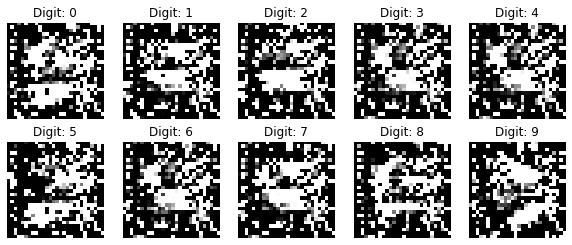

106000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.030605]


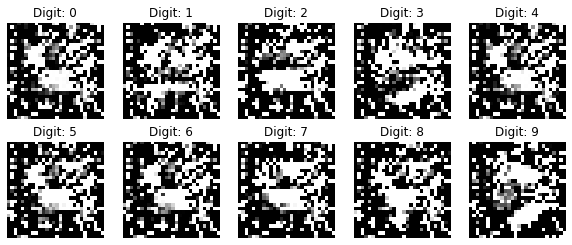

106250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.026503]


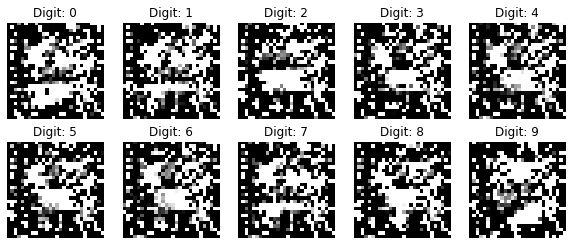

106500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.025037]


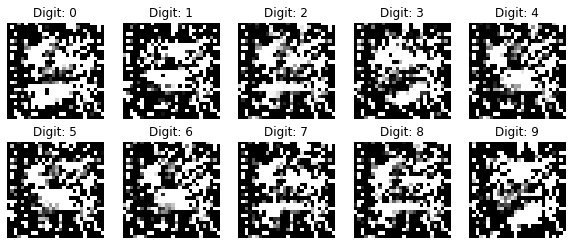

106750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.027292]


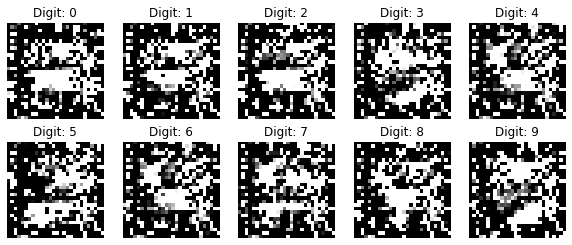

107000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.045086]


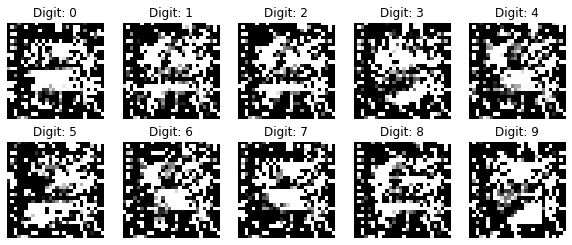

107250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.038743]


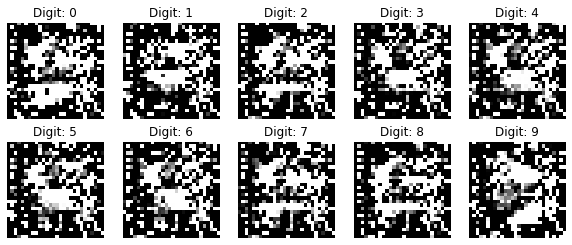

107500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.042367]


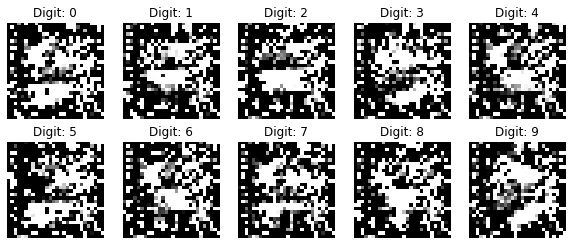

107750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.056966]


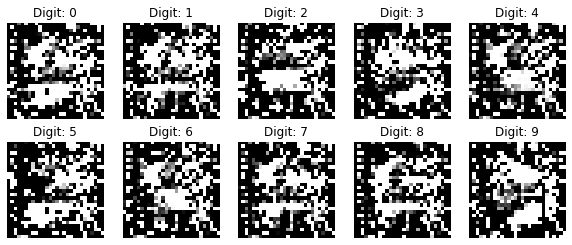

108000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.056152]


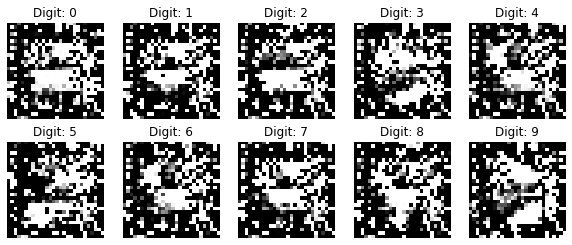

108250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.057329]


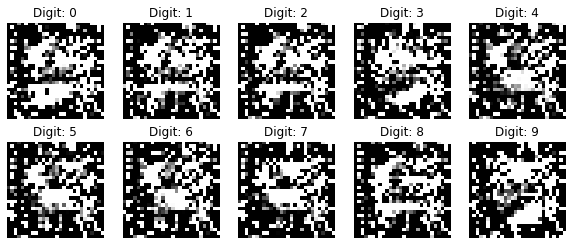

108500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.063183]


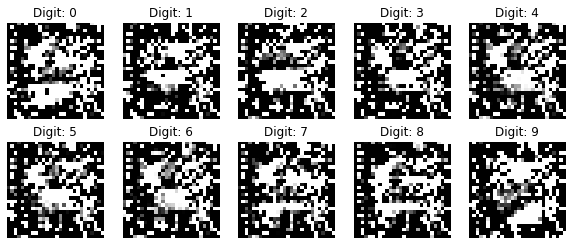

108750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055733]


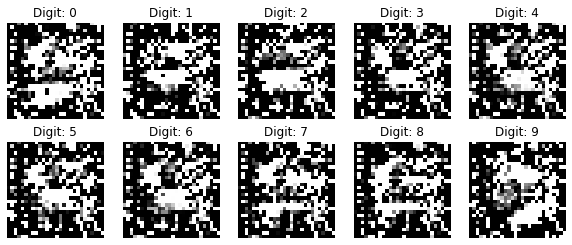

109000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055784]


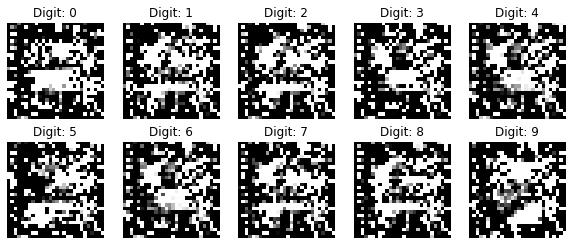

109250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058086]


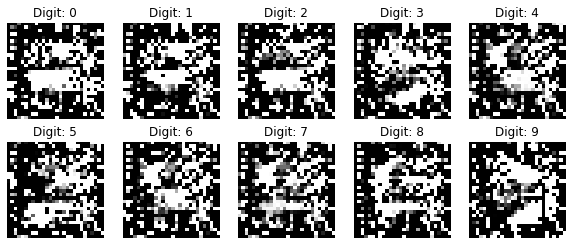

109500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058299]


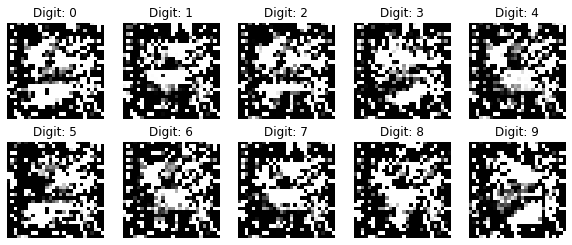

109750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.050032]


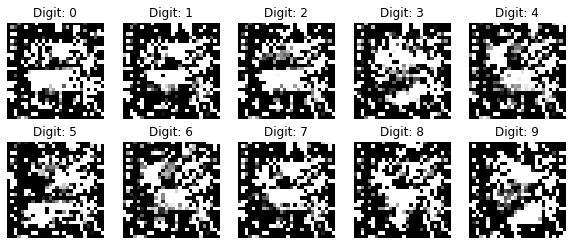

110000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.050822]


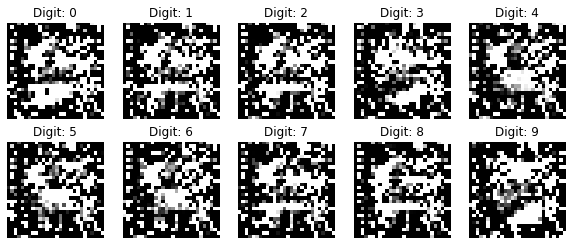

110250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.052595]


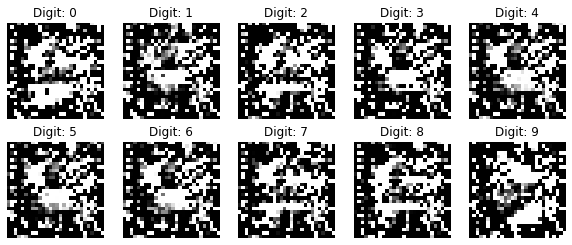

110500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.058182]


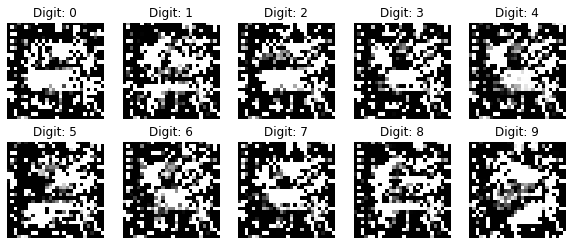

110750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055485]


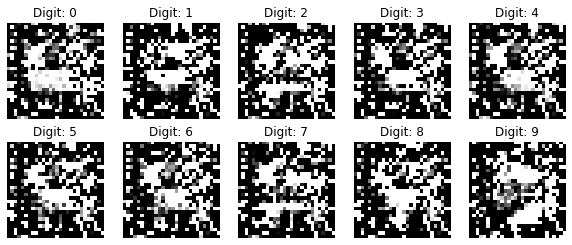

111000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055813]


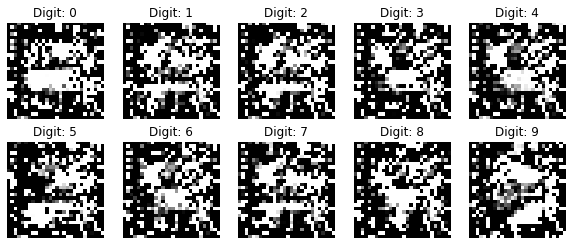

111250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.057548]


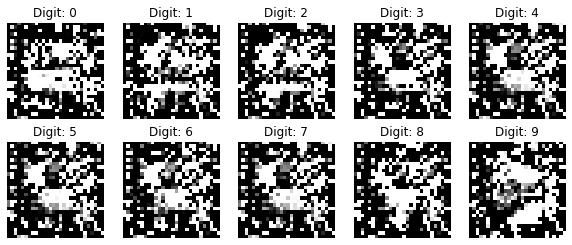

111500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.048893]


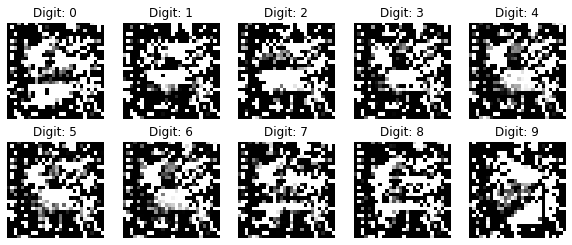

111750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055737]


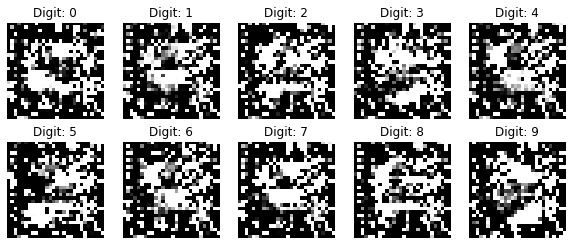

112000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.061576]


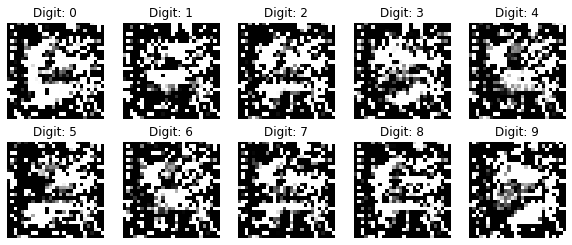

112250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.055431]


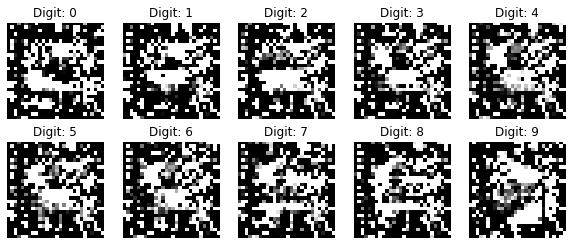

112500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.095526]


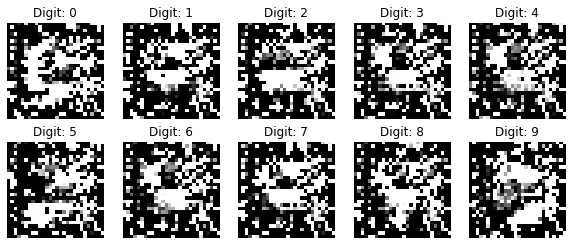

112750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.096849]


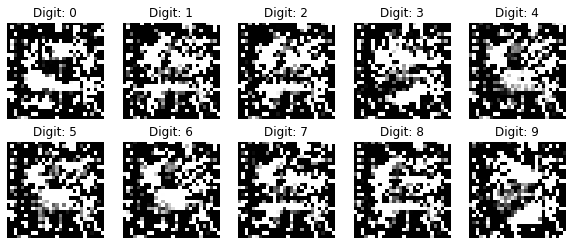

113000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.107259]


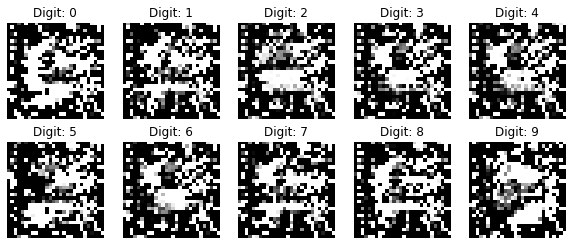

113250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.109580]


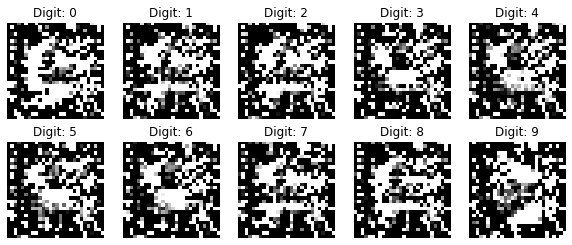

113500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.102175]


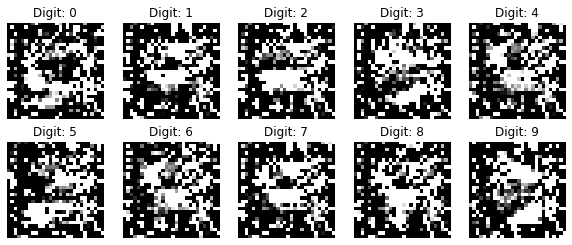

113750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.137299]


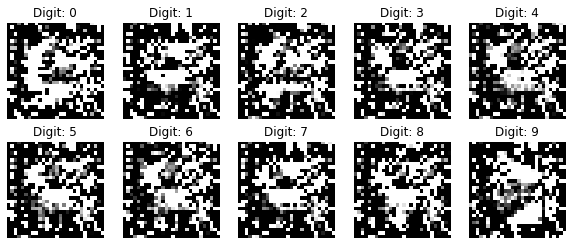

114000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.118358]


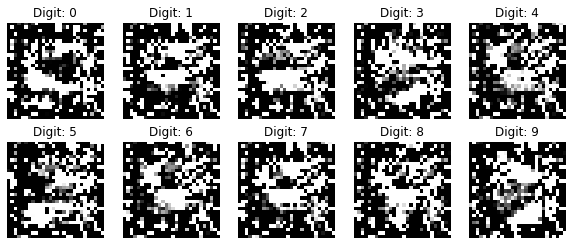

114250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.107743]


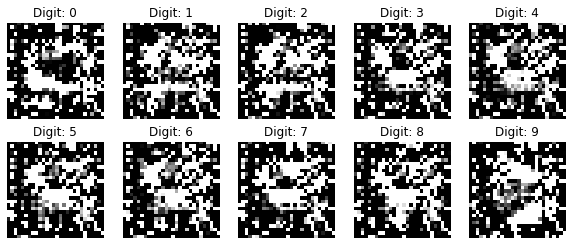

114500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.114809]


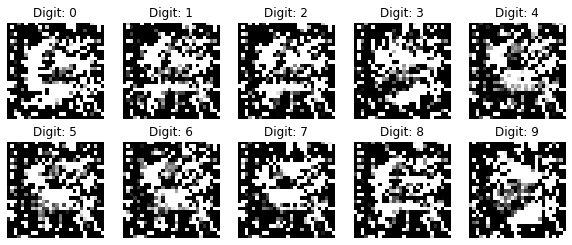

114750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.093888]


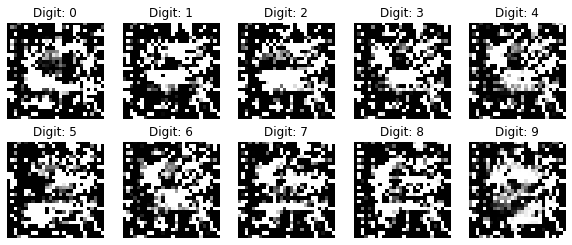

115000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.101833]


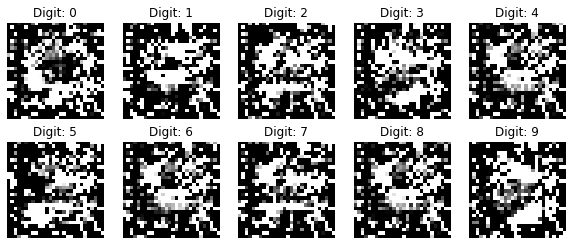

115250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.102277]


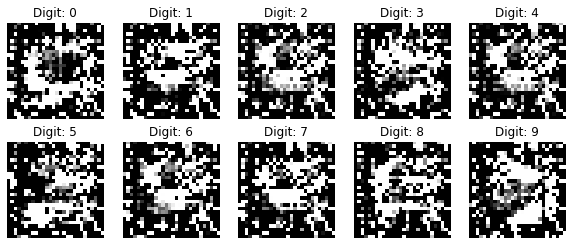

115500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.104290]


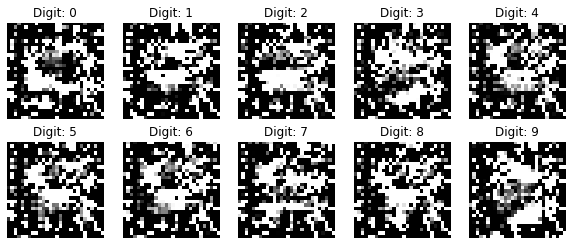

115750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.103911]


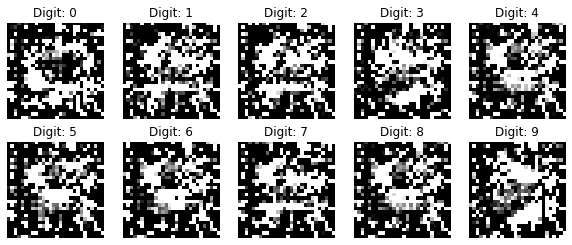

116000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.046907]


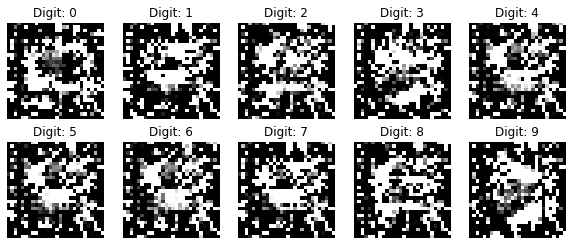

116250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.044797]


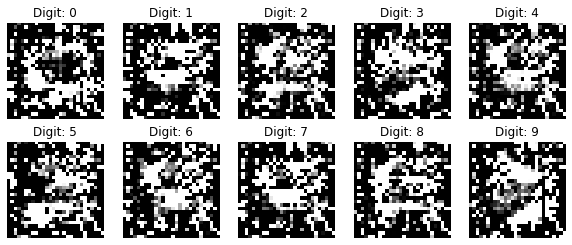

116500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.044663]


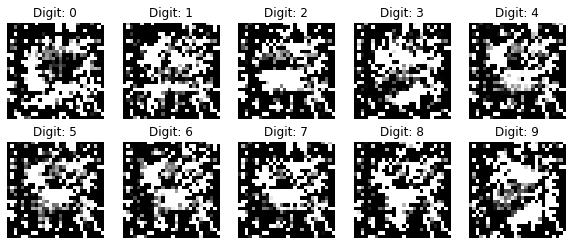

116750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.035677]


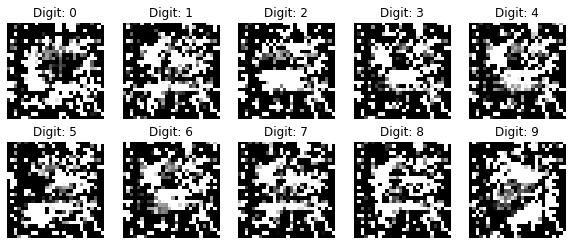

117000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.030610]


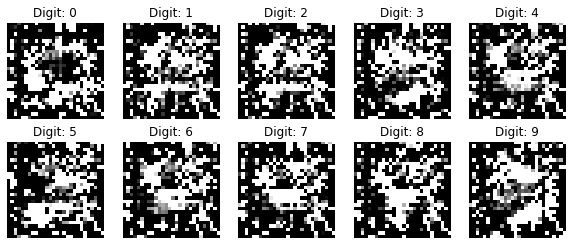

117250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.030718]


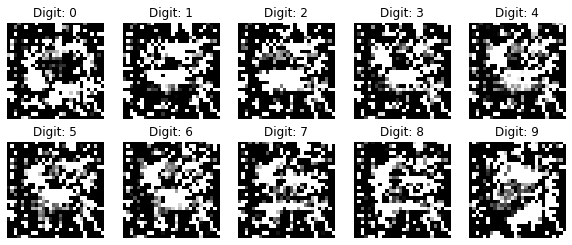

117500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.036216]


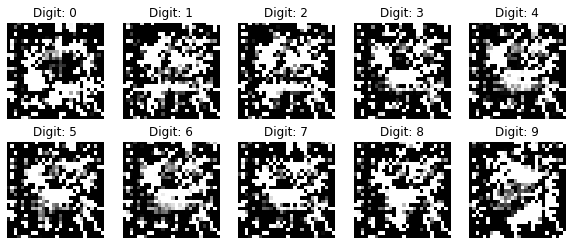

117750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.033600]


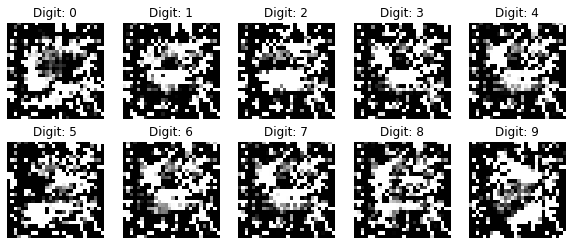

118000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.030175]


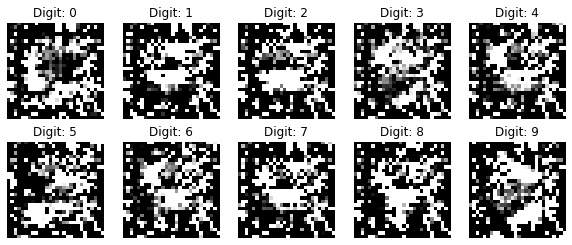

118250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.031161]


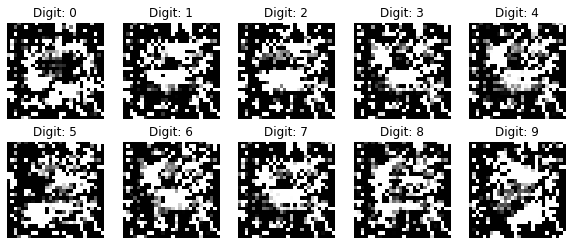

118500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.033666]


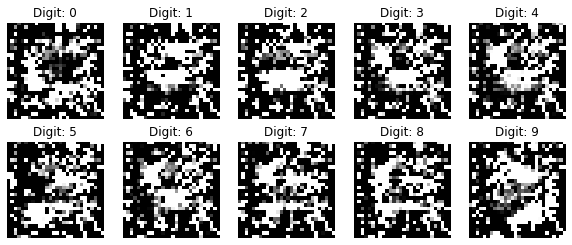

118750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.028041]


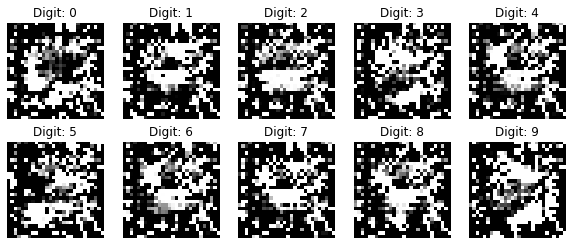

119000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.031764]


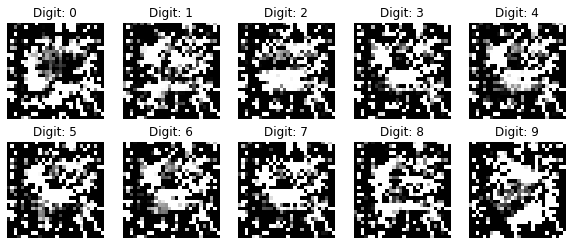

119250 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.031508]


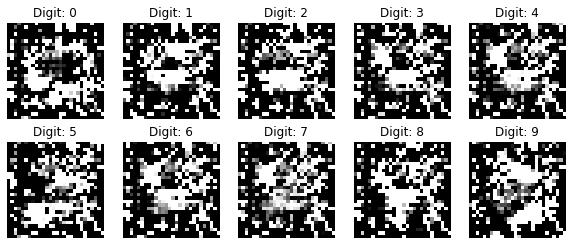

119500 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.031849]


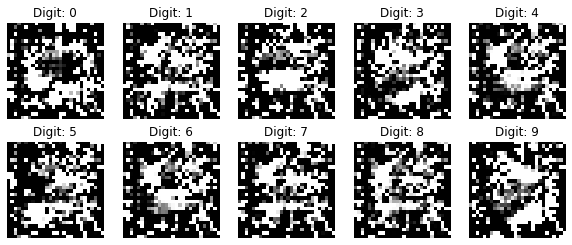

119750 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.030224]


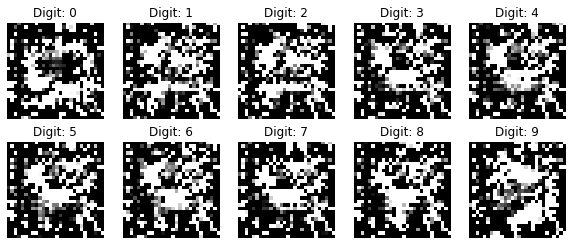

120000 [D loss: 0.000000, acc.: 100.00%] [G loss: 0.029211]


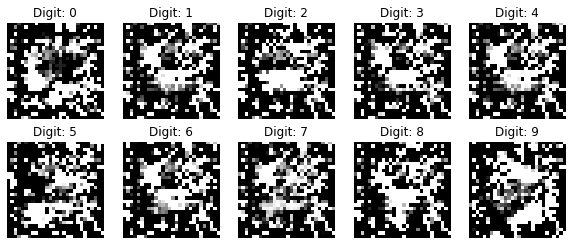

In [11]:
# Set hyperparameters
iterations = 120000
batch_size = 512
sample_interval = 250

# Train the CGAN for the specified number of iterations
train(iterations, batch_size, sample_interval)

# Output from a Trained CGAN Model

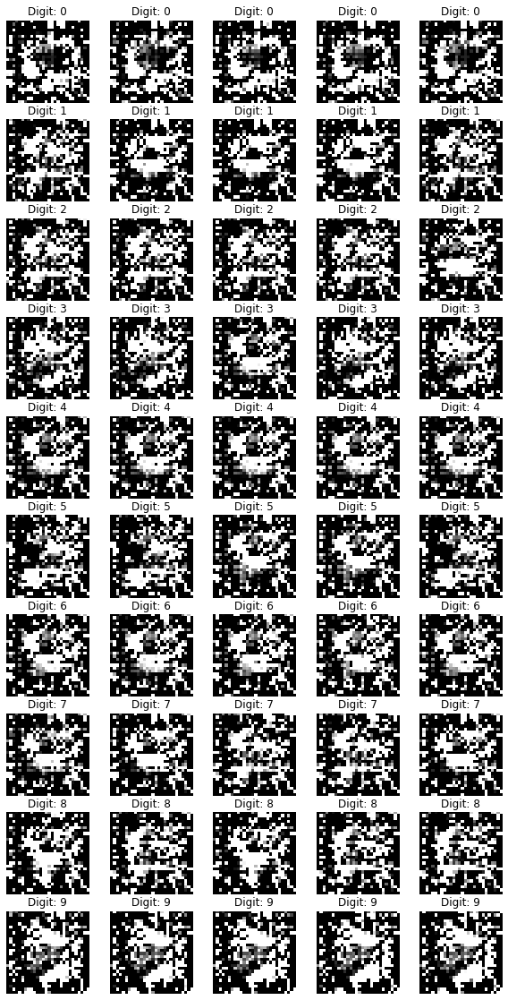

In [12]:
# Set grid dimensions
image_grid_rows = 10
image_grid_columns = 5

# Sample random noise
z = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, z_dim))

# Get image labels to generate: 5 samples for each label
labels_to_generate = np.array([[i for j in range(5)] for i in range(10)])
labels_to_generate = labels_to_generate.flatten().reshape(-1, 1)

# Generate images from random noise
gen_imgs = generator.predict([z, labels_to_generate])

# Rescale image pixel values to [0, 1]
gen_imgs = 0.5 * gen_imgs + 0.5

# Set image grid
fig, axs = plt.subplots(image_grid_rows,
                        image_grid_columns,
                        figsize=(10, 20),
                        sharey=True,
                        sharex=True)

cnt = 0
for i in range(image_grid_rows):
    for j in range(image_grid_columns):
        # Output a grid of images
        axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
        axs[i, j].axis('off')
        axs[i, j].set_title("Digit: %d" % labels_to_generate[cnt])  ## NEW
        cnt += 1

----